In [1]:
%%html
<style>
table {align:left;display:block}
</style>

# Antarctic subglacial topography map: Figures

This notebook contains code to plot the figures included in the manuscript: 
'Complex mesoscale landscapes beneath Antarctica mapped from space'

### Required datasets

The datasets which accompany this notebook can be found in this Zenodo repository and at the DOIs listed below:
10.5281/zenodo.15223469

**Metrics calculated for each of the 4269 50 km by 50 km regions (See metrics.py or Antartica_metrics.ipynb)**

| Filename  (IFPA)|Filename (Bedmachine)    | Description |
| :----------- | :-------------| :----------- |
| x_ifpa.nc     || X Coordinates        |
| y_ifpa.nc   || Y Coordinates         |
| mean_ifpa.nc or ifpa_mean.nc | bedmach_mean.nc | Mean elevation (m) |
| ifpa_count.nc | bedmach_count.nc| The number of hills with a 50 m prominence within a 5 km neighbourhood |
| ifpa_count_max_20.nc | bedmach_count_max_20.nc| The number of hills with a 20 m prominence within a 5 km neighbourhood |
| ifpa_count_max_100.nc | bedmach_count_max_100.nc| The number of hills with a 100 m prominence within a 5 km neighbourhood |
| ifpa_count_max_250.nc | bedmach_count_max_250.nc| The number of hills with a 250 m prominence within a 5 km neighbourhood |
| ifpa_b1_5km.nc | bedmach_b1_5km.nc | The fourier fractal dimension for wavelengths greater than 5 km |
| ifpa_b1_thickness.nc | bedmach_b1_thickness.nc | The fourier fractal dimension for wavelengths greater than the ice thickness |
|ifpa_std_deslope.nc| bedmach_std_deslope.nc| The standard deviation when the best-fit slope is removed |
|i_std_l.nc|b_std_l.nc | The standard deviation of some long wavelength components of the fourier spectrum |
|ifpa_wav_max_power.nc| bedmach_wav_max_power.nc| The wavelength in the Fourier spectrum with the maximum power |
|ifpa_rms_slope.nc| bedmach_rms_slope.nc | The RMS slope of the bed elevation |
|i_rms_slope_h.nc| b_rms_slope_h.nc| The RMS slope of some short wavelength components of the fourier spectrum | 
|ifpa_rms_curvature.nc| bedmach_rms_curvature.nc| The RMS curvature of the bed elevation |


**Datasets required for plotting**

| Filename      | Description |  Notes |
| :----------- | :----------- | :----------- |
| Groundingline_Antarctica_v2.shp     | Antarctic grounding line        ||
| ECR_features.shp | Outline of significant features within the example regions chosen ||
| mask.csv | Mask for IFPA topography map to remove regions outside the grounding line | Can be generated in notebook if needed (SLOW) |
| PPB_ifpa.csv | IFPA bed topography for the Pensacola-Pole subglacial Basin | Can be generated in notebook if needed |
| HA_data.csv | Comparison of ice-penetrating radar with other datasets for Highland A | Can be generated in notebook if needed |
| HA_data_ifpa.csv | Bed topography for Highland A | Can be generated in notebook if needed |
| HB_data.csv | Comparison of ice-penetrating radar with other datasets for Highland B| Can be generated in notebook if needed |
| HB_data_ifpa.csv | Bed topography for Highland B | Can be generated in notebook if needed |
| RSB_data.csv | Comparison of ice-penetrating radar with other datasets for Recovery Subglacial Basin | Can be generated in notebook if needed |
| RSB_data_ifpa.csv | Bed topography for Recovery Subglacial Basin | Can be generated in notebook if needed |
| ICE_data.csv | Comparison of ice-penetrating radar with other datasets for South Pole Basin | Can be generated in notebook if needed |
| ICE_data_ifpa.csv | Bed topography for South Pole Basin | Can be generated in notebook if needed |
| F6*.csv| Datasets for Figure S6 | Can be generated in notebook if needed |
| F8*.csv| Datasets for Figure S8 | Can be generated in notebook if needed |
| F9*.csv| Datasets for Figure S9 | Can be generated in notebook if needed |

**Large datasets (save these in a folder called Large_data)**

| Filename      | Description |
| :----------- | :----------- |
| IFPA_bed.nc | IFPA (meso) bed topography map for Antarctica, with ice thickness taken every 50 km (instead of the 8.3km used later) |
| IFPA_bed_C50.nc | IFPA (meso) bed topography map for Antarctica, with mean slipperiness Cbar = 50|
| BedMachineAntarctica_2019-11-05_v01.nc | Bedmachine Antarctica v1 (in case this is no longer available on line) |
| Bedmap3/Bedmap3_*.csv| Bedmap3 individual ice-thickness and bed elevation measurements, processed from data available online |

Note that the final IFPA map is not yet provided as it is under embargo for another publication

**Large external datasets (not provided on Zenodo, but should also be saved in Large_data)**

| Filename      | Description | Reference | DOI |
| :----------- | :----------- | :---------| :------------ |
| GaplessREMA100.nc     | Gapless REMA Antarctica dataset at 100m resolution        | Dong et al. (2022) | 10.1016/j.isprsjprs.2022.01.024|
| BedMachineAntarctica-v3.nc | MEaSURES BedMachine Antarctica bed topography map version 3 | Morlighem et al. (2020) | 10.5067/FPSU0V1MWUB6| 
| bedmap3.nc | Bedmap3 gridded topography product at 500 m resolution | Pritchard et al. (2025) | 10.1038/s41597-025-04672-y |
| antarctica_ice_velocity_450m_v2.nc | ITSLIVE Antarctic velocity map | Gardner et al. (2019) | 10.5067/6II6VW8LLWJ7|
| antarctic_ice_vel_phase.nc | MEaSURES Antarctic velocity map | Mouginot et al. (2019) | 10.5067/PZ3NJ5RXRH10 |
|UTIG_2010_ICECAP_AIR_BM3.csv| Bed elevation from airborne radar from the UTIG Icecap survey | Wright et al. (2012) | 10.1029/2011JF002066 |
|BAS_2012_ICEGRAV_AIR_BM3.csv| Bed elevation from airborne radar from the BAS Icegrav survey | Forsberg et al. (2018) | 10.1144/SP461.17 |
|2023_Antarctica_BaslerMKB.csv| Bed elevation from airborne radar from the COLDEX 2014  survey | | https://data.cresis.ku.edu/data/rds |

### Required packages

In [2]:
# Import the required packages
import numpy as np 
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from shapely.geometry import box
import geopandas as gpd
import earthpy.spatial as es
import glob
import itertools
import os
import skimage.io as sio
from scipy.interpolate import griddata 
from inversion_module_v2 import smooth_data_load
from pyproj import Transformer

### Set the filepaths to the input data, and the output folder for figures 

In [62]:
# Set the filepath to all the small datasets 
data_folder = '../../Data_Science_Zenodo/'
#ifpa_figures_data_folder = '../IFPA_figures_data/'
metrics_folder = data_folder + '/Metrics_v2/'
# Set the filepath to all the large datasets 
large_data_folder = '../../Large_data_science/'

# Set the filepath to where you would like to save the figures
figures_folder = '../Science_figures/'

### Set the filepaths for individual files within these folders

In [63]:
# Shapefile of the Antarctic groundline
filepath_groundingline = data_folder + "GroundingLine_Antarctica_v2.shp"
# Shapefile of significant features in the chosen example regions 
filepath_ECR_features = data_folder + "ECR_features.shp"

# The bedmap3 bed topography map 
filepath_bedmap3_map = large_data_folder + 'bedmap3.nc'
# The REMA surface elevation map
filepath_rema = large_data_folder + 'GaplessREMA100.nc'
# The itslive velocity map 
filepath_itslive = large_data_folder + 'antarctica_ice_velocity_450m_v2.nc'
# The measures velocity map 
filepath_measures = large_data_folder + 'antarctic_ice_vel_phase.nc' 
# The bedmachine bed topography map 
filepath_bedmach = large_data_folder + 'BedMachineAntarctica-v3.nc'

# A mask for the IFPA map to remove regions outside the grounding line 
filepath_mask = data_folder + 'mask.csv'
# IFPA in the Pensacola-Pole Basin
filepath_PPB_ifpa = data_folder + 'PPb_ifpa.csv'

# Landscape classification from Jamieson et al 2024
filepath_jamieson2014 = data_folder + "jamieson2014.png"
# Tectonic boundaries from Aitkin et al 2024
filepath_tectonics = data_folder + "Tectonics.png"

# The IFPAmeso topography map 
filepath_ifpaC50 = large_data_folder + "IFPA_bed_C50.nc"
# The IFPA topography map when applied previously with bed topography information every 50km
filepath_ifpa50km = large_data_folder + "IFPA_bed.nc"

# Radar flightlines for supplentary figures
# The UTIG flightline
filepath_UTIG = large_data_folder + 'UTIG_2010_ICECAP_AIR_BM3.csv'
# The BAS flightlines
filepath_BAS = large_data_folder + 'BAS_2012_ICEGRAV_AIR_BM3.csv'
# The ICECAP flightline
filepath_ICECAP = large_data_folder + '2023_Antarctica_BaslerMKB.csv'
# Topography and topography interpolated onto flightlines for comparison in these regions
filepath_HA = data_folder + 'HA_data.csv'
filepath_HA_ifpa = data_folder + 'HA_data_ifpa.csv'
filepath_HB = data_folder + 'HB_data.csv'
filepath_HB_ifpa = data_folder + 'HB_data_ifpa.csv'
filepath_RSB = data_folder + 'RSB_data.csv'
filepath_RSB_ifpa = data_folder + 'RSB_data_ifpa.csv'
filepath_ICE = data_folder + 'ICE_data.csv'
filepath_ICE_ifpa = data_folder + 'ICE_data_ifpa.csv'

# All the observed bed topography locations from Bedmap3 
filepath_bedmap_radar_bed = large_data_folder + 'Bedmap3/Bedmap3_bed.csv'
filepath_bedmap_radar_x = large_data_folder + 'Bedmap3/Bedmap3_x_coord.csv'
filepath_bedmap_radar_y = large_data_folder + 'Bedmap3/Bedmap3_y_coord.csv'
filepath_bedmap_radar_thick = large_data_folder + 'Bedmap3/Bedmap3_thick.csv'
filepath_bedmap_radar_xt = large_data_folder + 'Bedmap3/Bedmap3_x_thick.csv'
filepath_bedmap_radar_yt = large_data_folder + 'Bedmap3/Bedmap3_y_thick.csv'

# Bedmachine Antarctica version 1
filepath_bedmach_v1 = large_data_folder + "BedMachineAntarctica_2019-11-05_v01.nc"

# Metrics calculated for Bedmap3
# The mean distance to the nearest point 
filepath_bedmap3_mean_nearest = data_folder + 'Bedmap3/mean_nearest.nc'
# The data source 
filepath_bedmap3_source = data_folder + 'Bedmap3/source.nc'

generate_fromIFPA = False
if generate_fromIFPA == True:
    print('You need to provide the IFPA map file')
    #filepath_IFPAmap = '../../Large_data/' + 'BedMachineAntarctica-v4.0.nc' 


In [64]:
# Add bcolors to be able to print messages in different colours
class bcolors:
    FAIL = '\033[91m'
    ENDC = '\033[0m'

# Check that all the required datafiles are present (to avoid problems later)
# Note that this will just check if there is a file present, not that it's the correct file 
print('PRESENT: ' + '<filepath> (If a file exists)')
print(bcolors.FAIL + 'MISSING: ' + '<filepath> (If a file isn\'t there)' + bcolors.ENDC + '\n')
list_of_required_metrics = ['ifpa_mean', 'x_ifpa','y_ifpa','ifpa_count_max_50','bedmach_count_max_50','ifpa_b1_5km','bedmach_b1_5km']
list_of_required_metrics2 = ['ifpa_count_max_250', 'ifpa_b1_thickness', 'ifpa_rms_slope', 'ifpa_mean',\
                             'ifpa_count_max_20', 'i_rms_slope_h', 'ifpa_rms_curvature', 'ifpa_rms_slope',\
                             'ifpa_wav_max_power', 'ifpa_count_max_100', 'i_std_l', 'ifpa_std_deslope', 'ifpa_count_max_100', \
                            'ifpa_count_max_50']

list_of_required_filepaths = [filepath_groundingline, filepath_ECR_features, filepath_jamieson2014, \
                              filepath_tectonics, filepath_bedmach, filepath_measures, filepath_HA, filepath_HA_ifpa, \
                              filepath_HB, filepath_HB_ifpa, filepath_RSB, filepath_RSB_ifpa, filepath_ifpaC50, \
                              filepath_ifpa50km, filepath_PPB_ifpa, filepath_bedmap3_map, filepath_rema, \
                              filepath_bedmap_radar_bed, filepath_bedmap_radar_x, filepath_bedmap_radar_y, \
                              filepath_bedmap_radar_thick, filepath_bedmap_radar_xt, filepath_bedmap_radar_yt, \
                              filepath_bedmach_v1]
if generate_fromIFPA == True:
    list_of_required_filepaths.append(filepath_IFPAmap)
    list_of_required_filepaths.append(filepath_UTIG)
    list_of_required_filepaths.append(filepath_BAS)

for filepath in (list_of_required_filepaths):
    if os.path.isfile(filepath) == False:
        print(bcolors.FAIL + 'MISSING: ' + filepath + bcolors.ENDC)
    else:
        print('PRESENT: ' + filepath)    
for filepath in (list_of_required_metrics2):
    if os.path.isfile(data_folder + 'Metrics/' + filepath + '.nc') == False:
        print(bcolors.FAIL + 'MISSING: ' + data_folder + 'Metrics/' + filepath + '.nc' + bcolors.ENDC)
    else:
        print('PRESENT: ' + data_folder + 'Metrics/' + filepath + '.nc')
for filepath in (list_of_required_metrics):
    if os.path.isfile(metrics_folder + filepath + '.nc') == False:
        print(bcolors.FAIL + 'MISSING: ' + metrics_folder + filepath + '.nc' + bcolors.ENDC)
    else:
        print('PRESENT: ' + metrics_folder + filepath + '.nc')
if generate_fromIFPA == True:
    if os.path.isfile(filepath_IFPAmap) == False:
        print(bcolors.FAIL + 'MISSING: ' + filepath_IFPAmap + bcolors.ENDC)
    else:
        print('PRESENT: ' + filepath_IFPAmap)

PRESENT: <filepath> (If a file exists)
MISSING: <filepath> (If a file isn't there)

PRESENT: ../../Data_Science_Zenodo/GroundingLine_Antarctica_v2.shp
PRESENT: ../../Data_Science_Zenodo/ECR_features.shp
PRESENT: ../../Data_Science_Zenodo/jamieson2014.png
PRESENT: ../../Data_Science_Zenodo/Tectonics.png
PRESENT: ../../Large_data_science/BedMachineAntarctica-v3.nc
PRESENT: ../../Large_data_science/antarctic_ice_vel_phase.nc
PRESENT: ../../Data_Science_Zenodo/HA_data.csv
PRESENT: ../../Data_Science_Zenodo/HA_data_ifpa.csv
PRESENT: ../../Data_Science_Zenodo/HB_data.csv
PRESENT: ../../Data_Science_Zenodo/HB_data_ifpa.csv
PRESENT: ../../Data_Science_Zenodo/RSB_data.csv
PRESENT: ../../Data_Science_Zenodo/RSB_data_ifpa.csv
PRESENT: ../../Large_data_science/IFPA_bed_C50.nc
PRESENT: ../../Large_data_science/IFPA_bed.nc
PRESENT: ../../Data_Science_Zenodo/PPb_ifpa.csv
PRESENT: ../../Large_data_science/bedmap3.nc
PRESENT: ../../Large_data_science/GaplessREMA100.nc
PRESENT: ../../Large_data_science/

In [6]:
# Load in the shapefile for the groundingline
groundinglineM = gpd.read_file(filepath_groundingline)
ECR_features = gpd.read_file(filepath_ECR_features)

## Figure 1

**IFPA subglacial topography of Antarctica**, with panel a) showing the whole Antarctic
map and panels b) showing a comparison of different bed topography maps for the Pensacola-
Pole Basin region (outlined in black on panel a) for i) Bedmap3 (4), ii) BedMachine Antarctica
v3 (9) and iii) IFPA. The map production work flow is detailed in the Methods; the main input
datasets include the Gapless REMA ice-surface digital elevation model (24), the MEaSURES
Antarctic ice-velocity product (23), the BedMachine Antarctica v3 bed-elevation map (9), and all
available geophysical survey measurements of ice thickness from BedMap3 (3) and CReSIS SAR
surveys (25).

In [7]:
generate_mask = False
if generate_mask == True:
    # To load the IFPA data
    print('WARNING: This function will only work if you supply the location of filepath_IFPAmap')
    fh = Dataset(filepath_IFPAmap, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    bed_ifpa_new = fh.variables['bed'][:,:]
    X_ifpa_new = fh.variables['x'][:]
    Y_ifpa_new = fh.variables['y'][:]
    X_ifpa_new, Y_ifpa_new = np.meshgrid(np.array(X_ifpa_new), np.array(Y_ifpa_new))
    fh.close()
    groundinglineM = gpd.read_file(data_folder + "Groundingline_Antarctica_v2.shp")
    from shapely.geometry import Point
    print('WARNING: This mask takes absolutely aaaages to create, ideally load it from file')
    mask= np.ones(X_ifpa_new.shape)
    for i,j in itertools.product(range(X_ifpa_new.shape[1]), range(X_ifpa_new.shape[0])):
        mask[i,j] = groundinglineM.contains(Point(X_ifpa_new[i,j], Y_ifpa_new[i,j])).item()
        if np.mod(i*X_ifpa_new.shape[0]+j, 10000) == 0:
            print(i*X_ifpa_new.shape[0]+j, 'out of', X_ifpa_new.shape[0]*X_ifpa_new.shape[1], end = '\r')
    mask[mask == 0] = np.nan
    np.savetxt(filepath_mask, mask)
else:
    mask = np.loadtxt(filepath_mask)
    print('You have loaded', filepath_mask)

You have loaded ../../Data_Science_Zenodo/mask.csv


In [8]:
centre_coord = [-0.1e6,0.2e6] # Pensacola Pole Basin
#centre_coord = [1.05e6,-0.55e6] # Aurora basin
#centre_coord = [1.0e6,-0.7e6]
#centre_coord = [0.2e6, 0.8e6]
e = 200200
bounds = [centre_coord[0] - e, centre_coord[0] + e, centre_coord[1] -e, centre_coord[1] +e]
# Import the bedmap3 data in this region 
fh = Dataset(filepath_bedmap3_map, 'r', format = 'NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
xl = next(x for x, val in enumerate(X) if val >= bounds[0]) # X in ascending order
xh = next(x for x, val in enumerate(X) if val >= bounds[1])
yl = next(x for x, val in enumerate(Y) if val <= bounds[2])  # Y in descending order
yh = next(x for x, val in enumerate(Y) if val <= bounds[3])  
#print(xl,xh,yl,yh)
bed = fh.variables['bed_topography'][yh:yl, xl:xh]
radar = fh.variables['thickness_survey_count'][yh:yl,xl:xh]
X2 = fh.variables['x'][xl:xh]
Y2 = fh.variables['y'][yh:yl]
X2, Y2 = np.meshgrid(np.array(X2), np.array(Y2))
fh.close()
# Import the ITSLIVE, REMA and Bedmachine data
_, _, _, _, _, _, _, X_bedmach, Y_bedmach, thick, bedmach, _, _ = \
         smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_bedmach)

generate_fromIFPA = False
if generate_fromIFPA == True:
    # Import the ITSLIVE, REMA and IFPA data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bed_i, _, _ = \
    smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_IFPAmap)
    np.savetxt(filepath_PPB_ifpa, bed_i)
else:
    bed_i = np.loadtxt(filepath_PPB_ifpa)
    fh = Dataset(filepath_bedmach, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    bed_whole = fh.variables['bed'][:,:]
    Xwhole, Ywhole = np.meshgrid(np.array(X), np.array(Y))
    fh.close()

Plotting the Bedmachine v3 topography


/var/folders/2z/7bry1st105b3yqvkwvv4rn7c0000gp/T/ipykernel_6281/4057920871.py:55: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cbar = plt.colorbar(im, cax = ax[1], shrink = 1, orientation = 'horizontal', pad = 0.02);
/var/folders/2z/7bry1st105b3yqvkwvv4rn7c0000gp/T/ipykernel_6281/4057920871.py:93: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.savefig(figures_folder + '01sci_IFPA_map.jpg', dpi = 200, bbox_inches = 'tight')
/Users/ockendeh/miniconda3/envs/geo_py37/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/Users/ockendeh/miniconda3/envs/geo_py37/lib/python3.13

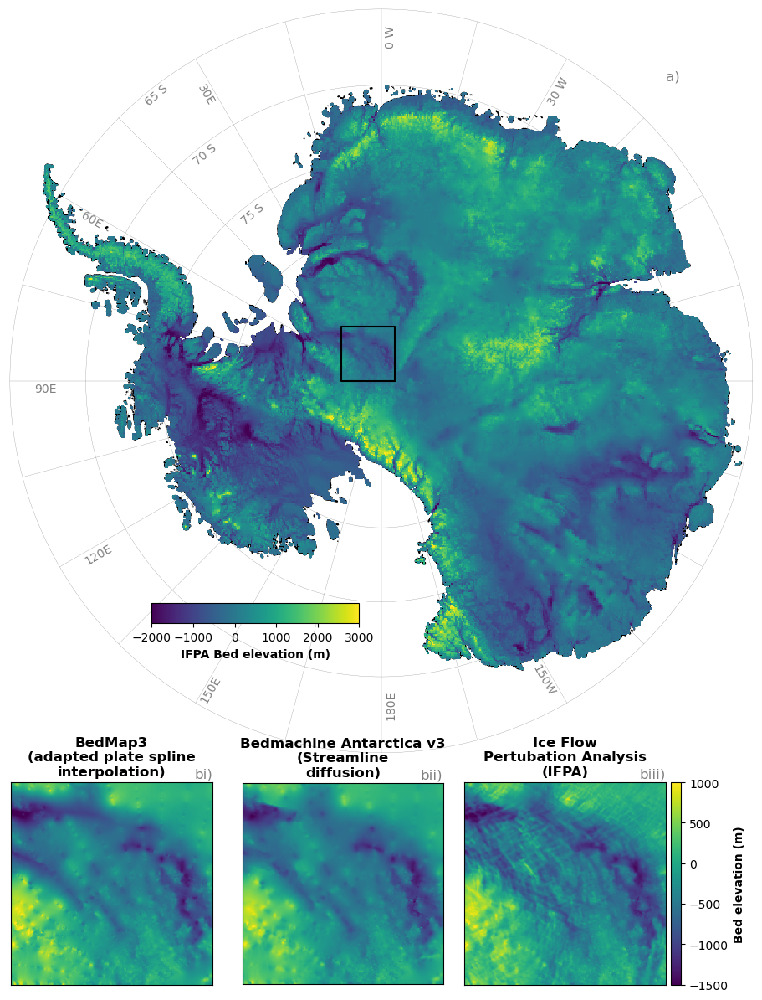

In [9]:
fig = plt.figure(constrained_layout=True, figsize = (9,12))
ax = [[],[],[],[],[],[],[]]
widths = [4,2,3.7,2,8,1]
heights = [15,0.5,3.5,5]
gs = fig.add_gridspec(len(heights),len(widths), width_ratios = widths, height_ratios = heights)
    
#ax[1] = fig.add_subplot(gs[:,:])
#ax[1] = fig.add_subplot(gs[3,:])
ax[0] = fig.add_subplot(gs[0:3,:])
ax[2] = fig.add_subplot(gs[3,0:2])
ax[3] = fig.add_subplot(gs[3,2:4])
ax[4] = fig.add_subplot(gs[3,4])
ax[5] = fig.add_subplot(gs[3,5])
ax[1] = fig.add_subplot(gs[1,1:3])

for i in range(6):
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);

for i in (0,2,3,4):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')

from pyproj import Transformer
transformer = Transformer.from_crs("epsg:4326","epsg:3031")
lons = (0,180)
lats = (-65,-65)
for i in range(int(360/15)):
    x,y = transformer.transform(lats, (0 + 15*i, 180 + 15*i))
    ax[0].plot(x,y, color = 'grey', zorder = 0, linewidth = 0.1)

cinq_deg_lat = gpd.read_file(data_folder + "5dg_latitude.shp")
cinq_deg_lat.geometry[2:4].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
cinq_deg_lat.geometry[6:7].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
cinq_deg_lat.geometry[9:].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
cinq_deg_lat.geometry[5:6].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)


for i in (2,3,4):
    ax[i].set_xlim(bounds[0], bounds[1]) 
    ax[i].set_ylim(bounds[2], bounds[3])
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);

d = 20
if generate_fromIFPA == True:
    im = ax[0].pcolor(X_ifpa_new[::d,::d], Y_ifpa_new[::d,::d], (bed_ifpa_new*mask)[::d,::d])
else:
    im = ax[0].pcolor(Xwhole[::d,::d], Ywhole[::d,::d], (bed_whole*mask)[::d,::d])
    print('Plotting the Bedmachine v3 topography')
geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
ax[0].plot(*geom.exterior.xy, color = 'k')
ax[0].set_xlim(-2.77e6,2.77e6)
ax[0].set_ylim(-2.77e6,2.77e6)
im.set_clim(-2000,3000)
ax[0].axis('off');

cbar = plt.colorbar(im, cax = ax[1], shrink = 1, orientation = 'horizontal', pad = 0.02);
cbar.set_label('IFPA Bed elevation (m)', fontweight = 'bold')
#ax[1].set_title('A bed topography map of Antarctica\n produced using\nIce Flow Perturbation Analysis', fontweight = 'bold');

label = ('65 S', '70 S', '75 S', '0 W', '30 W', '30E', '60E', '90E', '120E', '150E', '180E', '150W')
position = ((0.18,0.87),(0.245,0.79), (0.31,0.71), (0.505,0.95), (0.72,0.87), (0.25,0.87), (0.095,0.705), 
           (0.035,0.485),(0.1,0.255),(0.255,0.07),(0.505,0.05),(0.7,0.08))
rotation = (40,40,40, 90, 60, -60, -30, -0, 30,60,90,0-60)
for i in range(len(label)):
    ax[0].annotate(label[i], xy = position[i], xytext = position[i], xycoords = 'axes fraction', \
                   color = 'grey', rotation = rotation[i])

im2 = [[],[],[]]
im2[0] = ax[2].pcolor(X2, Y2, bed)
im2[1] = ax[3].pcolor(X_bedmach, Y_bedmach, bedmach)
im2[2] = ax[4].pcolor(X_bedmach, Y_bedmach, bed_i)
for i in range(3):
    im2[i].set_clim(np.min(bedmach),np.max(bedmach))
    im2[i].set_clim(-1500,1000)

titles = ['Ice Flow\nPertubation Analysis\n(IFPA)', 
          'Bedmachine Antarctica v3\n(Streamline\ndiffusion)',
          'BedMap3\n(adapted plate spline\ninterpolation)']
for i in range(3):
    ax[i+2].set_title(titles[2-i], fontweight = 'bold')

labels = ['a)', '','bi)', 'bii)', 'biii)']
locations = [(0.9,0.9),(),(1,1.01),(1,1.01),(1,1.01)]
for i in (0,2,3,4):
    ax[i].annotate(labels[i], xy=(2, 1), \
                   xytext=locations[i], \
                    fontsize = 12, ha = 'right', va = 'bottom', color = 'grey', xycoords = 'axes fraction');

cbar2 = plt.colorbar(im2[0], ax = ax[4], pad = 0.02)
cbar2.set_label('Bed elevation (m)', fontweight = 'bold')

ax[5].axis('off')

fig.savefig(figures_folder + '01sci_IFPA_map.jpg', dpi = 200, bbox_inches = 'tight')

## The high resolution version of panel a) for online only 

In [10]:
plot_full_res = False
if plot_full_res == True:
    fig = plt.figure(constrained_layout=True, figsize = (10,10))
    ax = [[],[]]
    widths = [4,6,10]
    heights = [15.5,0.5,3]
    gs = fig.add_gridspec(3,3, width_ratios = widths, height_ratios = heights)
        
    ax[0] = fig.add_subplot(gs[:,:])
    ax[1] = fig.add_subplot(gs[1,1])
    
    if plot_full_res == True:
        d = 1
    else:
        d = 20
        
    if generate_fromIFPA == True:
        im = ax[0].pcolor(X_ifpa_new[::d,::d], Y_ifpa_new[::d,::d], (bed_ifpa_new*mask)[::d,::d])
    else:
        im = ax[0].pcolor(Xwhole[::d,::d], Ywhole[::d,::d], (bed_whole*mask)[::d,::d])
    print('Plotting the Bedmachine v3 topography')
    groundinglineM.plot(ax = ax[0], facecolor = 'None', edgecolor='k')
    
    from pyproj import Transformer
    transformer = Transformer.from_crs("epsg:4326","epsg:3031")
    lons = (0,180)
    lats = (-65,-65)
    for i in range(int(360/15)):
        x,y = transformer.transform(lats, (0 + 15*i, 180 + 15*i))
        ax[0].plot(x,y, color = 'grey', zorder = 0, linewidth = 0.1)
    
    cinq_deg_lat = gpd.read_file(data_folder + "5dg_latitude.shp")
    cinq_deg_lat.geometry[2:4].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
    cinq_deg_lat.geometry[6:7].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
    cinq_deg_lat.geometry[9:].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
    cinq_deg_lat.geometry[5:6].plot(ax = ax[0], facecolor = 'None', edgecolor='grey', linewidth = 0.2, zorder = 0)
    ax[0].set_xlim(-2.77e6,2.77e6)
    ax[0].set_ylim(-2.77e6,2.77e6)
    im.set_clim(-2000,3000)
    ax[0].axis('off');
    
    cbar = plt.colorbar(im, cax = ax[1], shrink = 1, orientation = 'horizontal', pad = 0.02);
    cbar.set_label('IFPA Bed elevation (m)', fontweight = 'bold')
    #ax[1].set_title('A bed topography map of Antarctica\n produced using\nIce Flow Perturbation Analysis', fontweight = 'bold');
    
    label = ('65 S', '70 S', '75 S', '0 W', '30 W', '30E', '60E', '90E', '120E', '150E', '180E', '150W')
    position = ((0.18,0.87),(0.245,0.79), (0.31,0.71), (0.505,0.95), (0.72,0.87), (0.25,0.87), (0.095,0.705), 
               (0.035,0.485),(0.1,0.255),(0.265,0.08),(0.505,0.03),(0.7,0.08))
    rotation = (40,40,40, 90, 60, -60, -30, -0, 30,60,90,0-60)
    for i in range(len(label)):
        ax[0].annotate(label[i], xy = position[i], xytext = position[i], xycoords = 'axes fraction', \
                       color = 'grey', rotation = rotation[i])
    
    if plot_full_res == True:
        fig.savefig(figures_folder + 'IFPA_map.jpg', dpi = 500, bbox_inches = 'tight')
        plt.close(fig)
    else:
        fig.savefig(figures_folder + 'IFPA_map_small.jpg', dpi = 200, bbox_inches = 'tight')

## Figure 2

**Selected examples of new IFPA subglacial topography**, showing examples of (a-c)
channels incised into the subglacial substrate; (d-e) improved definition of subglacial topographic
lineations likely related to tectonics; and (f-h) newly-defined topography in subglacial highlands.
Note that the panels vary in size from 100 x 100 km to 300 x 300 km. (k) Panel locations. Key
linear features are annotated with white arrows, area features are outlined with dotted white lines.
See supplementary figures for examples shown alongside topography from BedMachine Antarctica
v3 (9) and BedMap3 (4), as follows: Maud Subglacial Basin - Fig. S15.11; Hercules Dome -
Fig S12.5; Recovery Subglacial Basin - Fig S15.12; Zhigalov Subglacial Highlands - Figs S23.28
and S27.36; Resolution Subglacial Highlands - Fig S21.23; Highland A - Fig S25.32; Golicyna
Subglacial Highlands - Fig S26.34.

In [11]:
# Import the calculated data metrics from folder

filepaths = glob.glob(metrics_folder +'*.nc')
# Create a matrix to save the data and its filename
data_matrix = np.ndarray((len(filepaths),2), dtype = np.ndarray)
for i in range(len(filepaths)):
    output = Dataset(filepaths[i],'r',format='netCDF4')
    data_matrix[i, 0] = output.variables['data'][:]
    output.close()
    # To account for differing lengths of data filepaths 
    for j in range(len(filepaths[i].split(os.path.sep))):
        if (filepaths[i].split(os.path.sep)[j]) == 'Metrics_v2':    
            short_filename  = filepaths[i].split(os.path.sep)[j+1].split('.')[0]
    data_matrix[i,1] = short_filename    
    
# Create a function to extract variables based on name 
def extract_from_matrix(variable_name):
    return data_matrix[data_matrix[:,1] == variable_name][0][0].data

In [12]:
# The mean ifpa elevation of the 4269 50 km by 50 km patches
mean_ifpa = extract_from_matrix('ifpa_mean')
# The x coordinates of the 4269 50 km by 50 km patches 
x_ifpa = extract_from_matrix('x_ifpa')
# The y coordinates of the 4269 50 km by 50 km patches 
y_ifpa = extract_from_matrix('y_ifpa')

In [13]:
bounds2 = np.ndarray(9, dtype = np.ndarray)
bounds2[0] = [-0.51e6, -0.38e6, -0.15e6, -0.02e6] # Herc Dome 
bounds2[1] = [0.15e6, 0.45e6, 1.025e6, 1.325e6] # Maud Subglacial basin
bounds2[2] = [2.075e6, 2.275e6, 0.15e6, 0.35e6] # Wilhelm II Land
bounds2[3] = [0.05e6, 0.25e6, 0.65e6, 0.85e6] # Recovery Subglacial lakes
bounds2[4] = [1.90e6, 2.20e6, -0.725e6, -0.425e6] # Highland A
bounds2[5] = [1.35e6, 1.65e6, 1.2e6, 1.5e6] # Zhigalov subglacial mountains
bounds2[6] = [1.0e6, 1.25e6, 0.28e6, 0.50e6] # Northern Gamburtsev subglacial mountains
bounds2[7] = [2.2e6, 2.35e6, -0.42e6, -0.27e6] # Golicyna subglacial mountains
bounds2[8] = [1.1e6,1.35e6, -1.525e6,-1.275e6] # Resolution subglacial highlands

letters2 = ['c','a','b','d','g','e','j','h','f']
labels_flat = [['Hercules Dome', (0.42, 0.50)],\
              ['    Maud\nSubglacial Basin', (0.56, 0.80)],\
              ['Wilhelm II Land', (0.86,0.45)],\
              ['Recovery Basin', (0.44, 0.62)], \
              ['Highland A', (0.83, 0.32)],\
              ['Zhigalov\nSubglacial Mountains', (0.66,0.73)],\
              ['    Northern Gamburtsev\n  Subglacial Mountains', (0.66,0.63)],\
              ['Golicyna\nSubglacial Mountains', (0.86, 0.44)], \
              ['Resolution\nSubglacial Highlands', (0.77,0.25)]]
labels_flat2 = [['Hercules Dome', (0.42, 0.50)],\
              ['Maud Subglacial Basin', (0.56, 0.80)],\
              ['Wilhelm II Land', (0.86,0.45)],\
              ['Recovery Basin', (0.44, 0.62)], \
              ['Highland A', (0.83, 0.32)],\
              ['Zhigalov Subglacial Mountains', (0.66,0.73)],\
              ['Northern Gamburtsev Subglacial Mountains', (0.66,0.63)],\
              ['Golicyna Subglacial Mountains', (0.83, 0.43)], \
              ['Resolution Subglacial Highlands', (0.77, 0.25)]]
labels = [['Hercules\nDome', (0.32, 0.43)],\
          ['Maud\nSubglacial\nBasin', (0.54, 0.79)],\
          ['Wilhelm\nII Land', (0.79,0.55)],\
          ['Recovery\nBasin', (0.50, 0.56)], \
          ['Highland A', (0.81, 0.31)],\
          ['Zhigalov\nSMs', (0.74,0.67)],\
          ['Northern\nGamburtsev\nSMs', (0.64,0.43)],\
          ['Golicyna\nSMs', (0.83, 0.42)], \
          ['Resolution\nSHs', (0.64, 0.22)]]

In [14]:
X_bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
Y_bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
bedmach_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
bedmach_new2 = np.ndarray(len(bounds2), dtype = np.ndarray)
X_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
Y_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
bed_ifpa_2 = np.ndarray(len(bounds2), dtype = np.ndarray)
geoms_2 = np.ndarray(len(bounds2), dtype = np.ndarray)

In [15]:
if generate_fromIFPA == True:
    for i in range(len(bounds2)):
        bounds = bounds2[i]
        # Extend bounds slightly for importing data
        bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
        # Create a shapely geometry file for bounds to plot them later
        geoms_2[i] = box(bounds[0], bounds[2], bounds[1], bounds[3])
        # Import the ITSLIVE, REMA and Bedmachine data
        _, _, _, _, _, _, _, X_bedmach_2[i], Y_bedmach_2[i], _, bedmach_2[i], _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
        # Import the ITSLIVE, REMA and Bedmachine data
        _, _, _, _, _, _, _, X_bedmach_2[i], Y_bedmach_2[i], _, bedmach_new2[i], _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)# To load the IFPA data
        fh = Dataset(filepath_IFPAmap, 'r', format = 'NETCDF4');
        X = fh.variables['x'][:]
        Y = fh.variables['y'][:]
        xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
        xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
        yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
        yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
        bed_ifpa_2[i] = fh.variables['bed'][yl:yh, xl:xh]
        X_ifpa = fh.variables['x'][xl:xh]
        Y_ifpa = fh.variables['y'][yl:yh]
        X_ifpa_2[i], Y_ifpa_2[i] = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
        fh.close()
    for i in range(len(bounds2)):
        np.savetxt(data_folder +str(i)+'_x_bedmach.csv', X_bedmach_2[i])
        np.savetxt(data_folder +str(i)+'_y_bedmach.csv', Y_bedmach_2[i])
        np.savetxt(data_folder +str(i)+'_bedmach.csv', bedmach_2[i])
        np.savetxt(data_folder +str(i)+'_bedmach_new.csv', bedmach_new2[i])
        np.savetxt(data_folder +str(i)+'_x_ifpa.csv', X_ifpa_2[i])
        np.savetxt(data_folder +str(i)+'_y_ifpa.csv', Y_ifpa_2[i])
        np.savetxt(data_folder +str(i)+'_bed_ifpa.csv', bed_ifpa_2[i])
else:
    for i in range(len(bounds2)):
        bounds = bounds2[i]
        # Extend bounds slightly for importing data
        bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
        # Create a shapely geometry file for bounds to plot them later
        geoms_2[i] = box(bounds[0], bounds[2], bounds[1], bounds[3])
        X_bedmach_2[i] = np.loadtxt(data_folder+str(i)+'_x_bedmach.csv')
        Y_bedmach_2[i] = np.loadtxt(data_folder+str(i)+'_y_bedmach.csv')
        bedmach_2[i] = np.loadtxt(data_folder+str(i)+'_bedmach.csv')
        bedmach_new2[i] = np.loadtxt(data_folder+str(i)+'_bedmach_new.csv')

In [16]:
def figure_plotter(kk, ax0, title, letter):
    hillshade_on = False
    if hillshade_on == True:
        hillshade = es.hillshade(bedmach_new2[kk], altitude = 45, azimuth = 45)
        ax0.imshow(hillshade, extent = bounds2[kk], cmap = 'Greys', zorder = 0, origin = 'upper')
        im = ax0.imshow(bedmach_new2[kk], extent = bounds2[kk], alpha = 0.9, cmap = 'viridis', origin = 'upper')
    else:
        im = ax0.imshow(bedmach_new2[kk], extent = bounds2[kk], alpha = 1, cmap = 'viridis', origin = 'upper')
    groundinglineM.plot(ax = ax0, facecolor = 'None', edgecolor='k')
    ax0.get_xaxis().set_ticks([]); ax0.get_yaxis().set_ticks([]);   
    ax0.set_xlim(bounds2[kk][0], bounds2[kk][1])
    ax0.set_ylim(bounds2[kk][2], bounds2[kk][3])
    ax0.set_title(title, fontsize = 30, fontweight = 'bold', pad = 10)
    cbar = plt.colorbar(im, ax = ax0, shrink = 0.7, pad = 0.01)
    cbar.set_label('Elevation (m)', fontsize = 30)
    cbar.ax.tick_params(labelsize=20)
    ax0.annotate('{}'.format(letter), xy=(2, 1), xytext=(0.04, 1.02), xycoords = 'axes fraction', \
                       fontsize = 24, ha = 'center');
    x_width  = (bounds2[kk][1] - bounds2[kk][0])/1000
    y_width =  (bounds2[kk][3] - bounds2[kk][2])/1000
    cbar.ax.annotate('{:.0f} km by\n{:.0f} km'.format(x_width, y_width), \
                   xy=(2, 1), xytext=(0, 1.05), xycoords = 'axes fraction', fontsize = 20);

In [17]:
labels = [['Hercules\nDome', (0.3, 0.43)],\
          ['Maud\nSubglacial\nBasin', (0.54, 0.79)],\
          ['Wilhelm\nII Land', (0.77,0.53)],\
          ['Recovery\nBasin', (0.50, 0.54)], \
          ['Highland A', (0.7, 0.36)],\
          ['Zhigalov\nSMs', (0.74,0.65)],\
          ['Northern\nGamburtsev\nSMs', (0.64,0.43)],\
          ['Golicyna\nSMs', (0.83, 0.42)], \
          ['Resolution\nSHs', (0.67, 0.24)]]

In [18]:
def mini_arrow(ax0, xyend, xy):
    ax0.annotate('',xy = xyend, xytext = xy, xycoords = 'axes fraction', \
                 arrowprops = dict(shrink = 0.05, color = 'white', linewidth = 5, headwidth = 10))

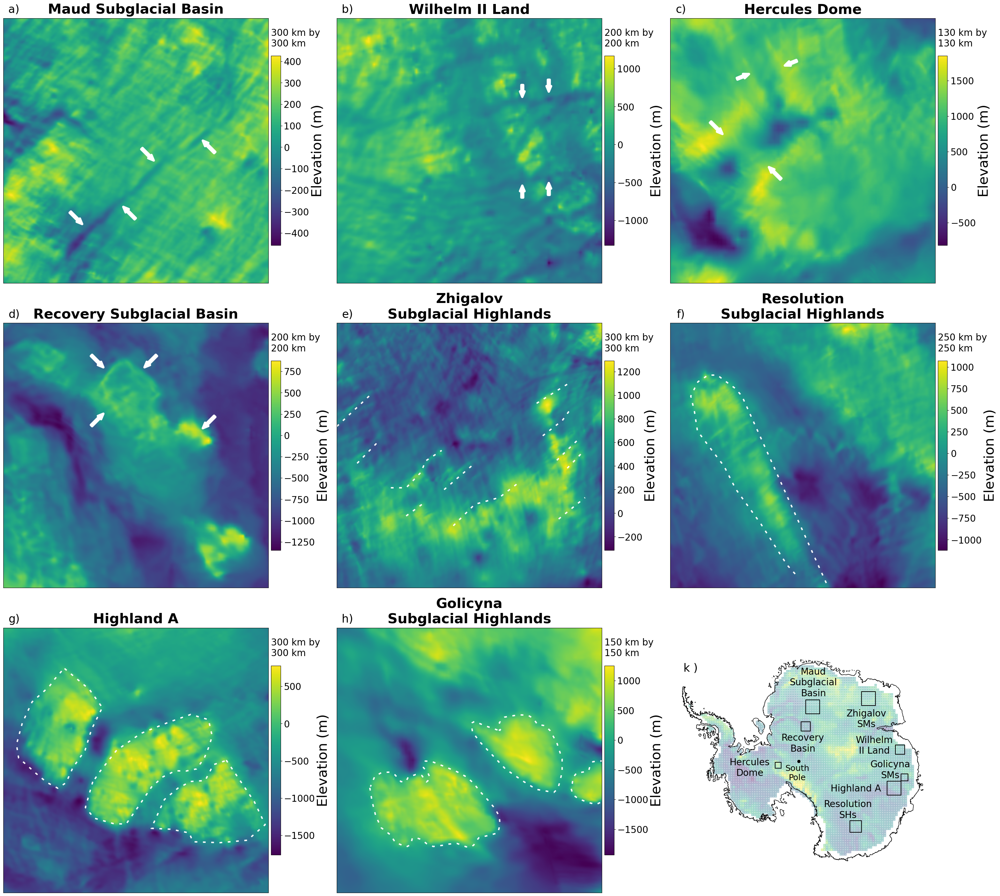

In [19]:
ax = [[],[],[],[],[],[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (30,27))
widths = [10,10,10]
heights = [10,10,10]
gs = fig.add_gridspec(3,3, width_ratios = widths, height_ratios = heights)
for i in range(9):
    ax[i] = fig.add_subplot(gs[np.mod(i,3), int((i-np.mod(i,3))/3)])

figure_plotter(2, ax[3],'Wilhelm II Land','b)')
figure_plotter(1, ax[0], 'Maud Subglacial Basin', 'a)')
figure_plotter(0, ax[6], 'Hercules Dome','c)')
figure_plotter(3, ax[1], 'Recovery Subglacial Basin','d)')
figure_plotter(5, ax[4], 'Zhigalov\nSubglacial Highlands','e)')
figure_plotter(8, ax[7], 'Resolution\nSubglacial Highlands','f)')
figure_plotter(4, ax[2], 'Highland A','g)')
figure_plotter(7, ax[5], 'Golicyna\nSubglacial Highlands','h)')


axh = ax[8]
im = axh.scatter(x_ifpa, y_ifpa, c =  mean_ifpa, s = 15, marker = 's', alpha = 0.3, zorder = 0)
im.set_clim(-2000,2000)
group_1 = (0,1,2,3,4,5,7,8)
color_1 = 'k'
color_2 = '#2f64b4'
alpha_1 = 1
#alpha_2 = 0.7
axh.annotate('k )', xy = (1,2), xytext = (0.05,0.9), xycoords = 'axes fraction', fontsize = 24)
for i in group_1:
    geom = box(bounds2[i][0], bounds2[i][2], bounds2[i][1], bounds2[i][3])
    axh.plot(*geom.exterior.xy, color = color_1, zorder = 2, alpha = alpha_1)
    axh.annotate(labels[i][0], xy=(2, 1), xytext=labels[i][1], xycoords = 'axes fraction', \
                fontsize = 20, color = color_1, ha = 'center', alpha = alpha_1);
groundinglineM.plot(ax = axh, facecolor = 'None', edgecolor='k', zorder = 0)
axh.get_xaxis().set_ticks([]); axh.get_yaxis().set_ticks([]);   
axh.axis('off');
axh.scatter(0,0, color = 'k')
axh.annotate('South\nPole', xy=(2, 1), xytext=(0.48,0.41), xycoords = 'axes fraction', \
                fontsize = 18, color = color_1, ha = 'center', alpha = alpha_1);

mini_arrow(ax[3], (0.7,0.7), (0.7,0.75))
mini_arrow(ax[3], (0.8,0.72), (0.8,0.77))
mini_arrow(ax[3], (0.7,0.37), (0.7,0.32))
mini_arrow(ax[3], (0.8,0.38), (0.8,0.33))
mini_arrow(ax[0], (0.3,0.22), (0.25,0.27))
mini_arrow(ax[0], (0.45,0.29), (0.5,0.24))
mini_arrow(ax[0], (0.57,0.46), (0.52,0.51))
mini_arrow(ax[0], (0.75,0.54), (0.8,0.49))
mini_arrow(ax[6], (0.30,0.79), (0.25,0.77))
mini_arrow(ax[6], (0.43,0.82), (0.48,0.84))
mini_arrow(ax[6], (0.2,0.56), (0.15,0.61))
mini_arrow(ax[6], (0.37,0.44), (0.42,0.39))
mini_arrow(ax[1], (0.38,0.83), (0.33,0.88))
mini_arrow(ax[1], (0.53,0.83), (0.58,0.88))
mini_arrow(ax[1], (0.38,0.66), (0.33,0.61))
mini_arrow(ax[1], (0.75,0.6), (0.8,0.65))
#mini_arrow(ax[4], (0.25,0.18), (0.2,0.15))
#mini_arrow(ax[4], (0.25,0.48), (0.2,0.45))
#mini_arrow(ax[4], (0.25,0.78), (0.2,0.75))
#mini_arrow(ax[4], (0.85,0.60), (0.80,0.57))

for i in (4, 5, 2,7):
    ECR_features.plot(ax = ax[i], linestyle=(0,(2,4)), \
                          edgecolor = 'white', linewidth = 3, zorder = 2)

fig.savefig(figures_folder + '02sci_topo_examples.jpg', bbox_inches = 'tight', dpi = 200)

### Figure 3 

**The texture of Antarctica’s ice-sheet bed.** a) The number of 50 m hills within a 5 km
radius, and b) the Fourier fractal dimension forwavelengths > 5km (a proxy for subglacial landscape
roughness), extracted from (i) IFPAtopography, (ii) topography interpolated between geophysicallyderived
bed picks using streamline diffusion (BedMachine Antarctica v3 (9)), and (iii) an adapted
plate spline interpolation (Bedmap3 (3,4). (c) Locations of bed picks used to derive both interpolated
topographies (From Bedmap3 thickness survey count) (4). The most densely surveyed regions of
East Antarctica are annotated: Dome Fuji (DF), Gamburtsev Subglacial Mountains (GSM), Lake
Vostok (LV) and Dome C (DC). Note the significant correspondence between the spatial patterns
in interpolated topographies (aii, aiii) and geophysical-survey locations (c). By contrast, panels (ai)
and (bi) show that with IFPA we can now calculate subglacial-landscape texture across Antarctica
consistently, without major bias from geophysical-survey locations.

In [20]:
# The number of hills with a 50 m prominence within a 5 km neighbourhood (IFPA)
ifpa_count = extract_from_matrix('ifpa_count_max_50')
# The number of hills with a 50 m prominence within a 5 km neighbourhood (Bedmachine)
bedmach_count = extract_from_matrix('bedmach_count_max_50')
# The fractal dimension for wavelengths greater than 5 km (IFPA)
ifpa_b1_5km = extract_from_matrix('ifpa_b1_5km')
# The fractal dimension for wavelengths greater than 5 km (Bedmachine)
bedmach_b1_5km = extract_from_matrix('bedmach_b1_5km')
# The same for Bedmap3
bedmap3_b1_5km = extract_from_matrix('bedmap3_b1_5km')
bedmap3_count = extract_from_matrix('bedmap3_count_max_50')
print('Mean Fourier Fractal Dimension for IFPA:           {:.2f}'.format(3+ np.mean(ifpa_b1_5km)/2))
print('Mean Fourier Fractal Dimension for Bedmachine v3:  {:.2f}'.format(3+np.mean(bedmach_b1_5km)/2))
print('Mean Fourier Fractal Dimension for Bedmap3:        {:.2f}'.format(3+np.mean(bedmap3_b1_5km)/2))
print('Mean Bumpiness for IFPA:                           {:.2f}'.format(np.mean(ifpa_count)))
print('Mean Bumpiness for Bedmachine v3:                  {:.2f}'.format(np.mean(bedmach_count)))
print('Mean Bumpiness for Bedmap3:                        {:.2f}'.format(np.mean(bedmap3_count)))

Mean Fourier Fractal Dimension for IFPA:           0.85
Mean Fourier Fractal Dimension for Bedmachine v3:  0.54
Mean Fourier Fractal Dimension for Bedmap3:        1.03
Mean Bumpiness for IFPA:                           16.87
Mean Bumpiness for Bedmachine v3:                  8.51
Mean Bumpiness for Bedmap3:                        16.90


In [21]:
fh = Dataset(filepath_bedmap3_map, 'r', format = 'NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
thickness_survey_count = fh.variables['thickness_survey_count'][:,:]
fh.close()

/var/folders/2z/7bry1st105b3yqvkwvv4rn7c0000gp/T/ipykernel_6281/3994191355.py:81: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.savefig(figures_folder + '03sci_Metrics.png', dpi = 200, bbox_inches = 'tight')
/Users/ockendeh/miniconda3/envs/geo_py37/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/Users/ockendeh/miniconda3/envs/geo_py37/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


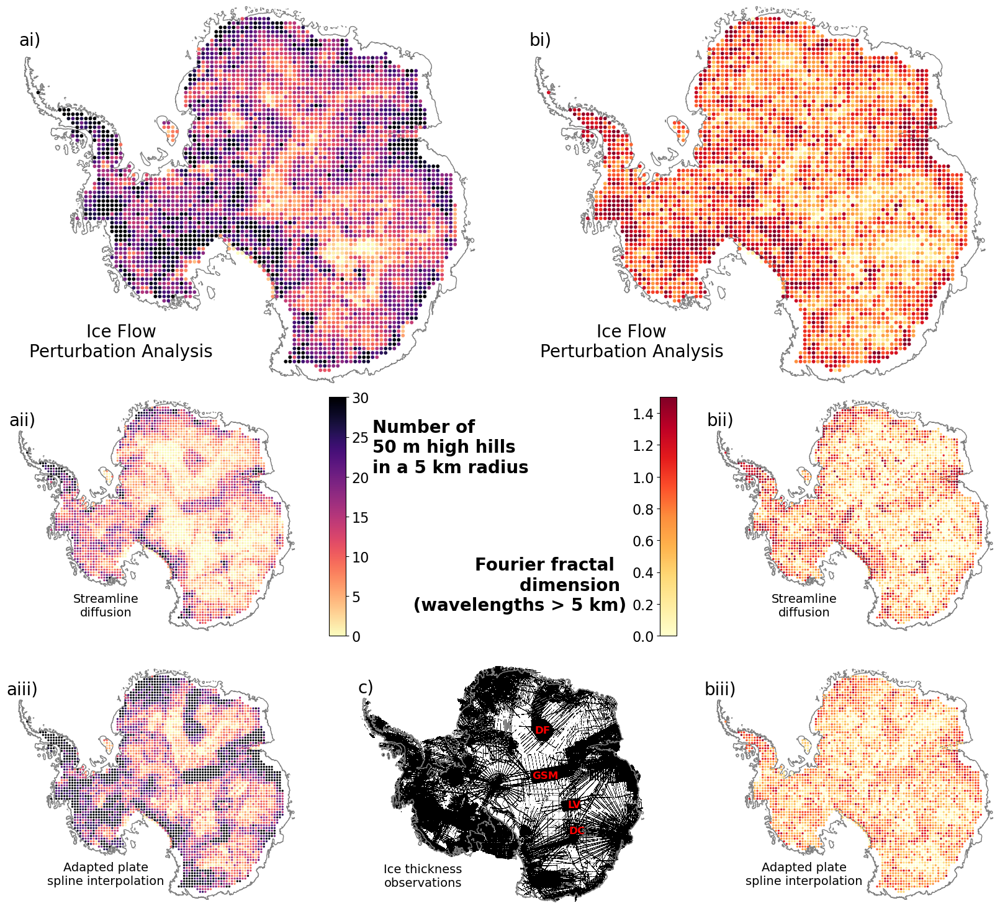

In [22]:
fig = plt.figure(constrained_layout=True, figsize = (16,15))
widths = [5, 0.3, 1.7, 1.7,0.3, 5]
heights = [4,2.5,2.5]
gs = fig.add_gridspec(3,6, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[],[],[],[],[],[],[],[],[]]
ax[0] = fig.add_subplot(gs[0, 0:3])
ax[1] = fig.add_subplot(gs[0, 3:6])
ax[2] = fig.add_subplot(gs[1, 0])
ax[3] = fig.add_subplot(gs[1,5])
ax[4] = fig.add_subplot(gs[2,0])
ax[5] = fig.add_subplot(gs[2,5])
#ax[6] = fig.add_subplot(gs[2,1:5])
ax[6] = fig.add_subplot(gs[2,1:5])
ax[7] = fig.add_subplot(gs[1,1])
ax[8] = fig.add_subplot(gs[1,4])

letters = ['ai)','bi)','aii)', 'bii)', 'aiii)','biii)','c)', 'h)', 'i)']

for i in range(7):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey')
    ax[i].set_xlim(-2.55e6,2.7e6)
    ax[i].set_ylim(-2.2e6,2.2e6)
    ax[i].annotate(letters[i], xy = (1,2), xytext = (0.02,0.91), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = 20)
    ax[i].axis('off')

for i in range(9):
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    

plots = [ifpa_count, 3+ ifpa_b1_5km/2, bedmach_count, 3+ bedmach_b1_5km/2, bedmap3_count, 2.5+bedmap3_b1_5km/2]
cmaps = ['magma_r', 'YlOrRd', 'magma_r', 'YlOrRd', 'magma_r', 'YlOrRd']
sizes = [10,10,2,2,2,2]
clims = [[0,30],[0,1.5],[0,30],[0,1.5],[0,30],[0,1.5]]
labels = ['Number of\n50 m high hills\nin a 5 km radius\n\n', \
          '\n\nFourier fractal           \ndimension          \n (wavelengths > 5 km)         ']
fontsizes = [20,14,14]
ha_cb = ['left', 'right']
va_cb = ['bottom', 'top']


for i in range(6):
    im = ax[i].scatter(x_ifpa, y_ifpa, c = plots[i], cmap = cmaps[i], s = sizes[i]) 
    im.set_clim(clims[i])

    if i in (0,1):
        cb = plt.colorbar(im, cax = ax[int(i) +7], orientation = 'vertical', shrink = 0.5)
        cb.set_label(labels[int(i)], fontsize = fontsizes[int(i/2)], fontweight = 'bold', rotation = 0, ha = ha_cb[i], va = va_cb[i])
        cb.ax.tick_params(labelsize=16) 
ax[8].yaxis.tick_left()

for i in (0,1):
    ax[i].annotate('Ice Flow\nPerturbation Analysis', xy = (1,2), xytext = (0.22,0.12), xycoords = 'axes fraction', \
               ha = 'center', c = 'k', va = 'center', fontsize = fontsizes[int(i/2)])
for i in (2,3):
    ax[i].annotate('Streamline\ndiffusion', xy = (1,2), xytext = (0.32,0.12), xycoords = 'axes fraction', \
               ha = 'center', c = 'k', va = 'center', fontsize = fontsizes[int(i/2)])
for i in (4,5):
    ax[i].annotate('Adapted plate\nspline interpolation', xy = (1,2), xytext = (0.32,0.12), xycoords = 'axes fraction', \
               ha = 'center', c = 'k', va = 'center', fontsize = fontsizes[int(i/2)])


#img =sio.imread(filepath_radar_locs)
#ax[6].imshow(img, extent = [-2.8e6,2.8e6,-2.4e6,2.5e6])
kw = {'xy' : (1,2), 'xycoords' : 'axes fraction', \
                   'ha' : 'center', 'va' : 'center', 'fontsize' : fontsizes[1]}
ax[6].annotate('Ice thickness\nobservations', xytext = (0.22,0.12), **kw, c = 'k')
kw2 = {'xy' : (1,2), 'xycoords' : 'axes fraction', \
                   'ha' : 'center', 'va' : 'center', 'c' : 'red', \
                      'fontweight' : 'bold', 'fontsize' : 12}
ax[6].annotate('DF', xytext = (0.64,0.73), **kw2)
ax[6].annotate('GSM', xytext = (0.65,0.54), **kw2)
ax[6].annotate('LV', xytext = (0.75,0.42), **kw2)
ax[6].annotate('DC', xytext = (0.76,0.31), **kw2)

im = ax[6].imshow(thickness_survey_count.mask, extent = [np.min(X),np.max(X), np.min(Y), np.max(Y)], cmap = 'Greys_r')
im.set_clim(0.99,1)
#groundinglineM.plot(ax = ax[6], facecolor = 'None', edgecolor='red')

# Save figure to folder
fig.savefig(figures_folder + '03sci_Metrics.png', dpi = 200, bbox_inches = 'tight')

### Figure 3

**Geomorphological classification of Antarctica’s subglacial landscape.** (a) Application
to IFPA𝑚𝑒𝑠𝑜 subglacial topography; (b) Previous classification applied in 2013 to interpolated bedtopography
(BedMap2) (39), adapted from Jamieson et al. (40). In each panel the classification
shows regions of low-relief, alpine (both fully submerged - subglacial, and partially submerged - subaerial) and selectively-eroded landscapes. (c) Locations discussed in text. (d) Locations of
tectonic boundaries across Antarctica, adapted from (35). We have colored some examples of
regions where the geological structure mirrors the tectonic structures which we see. Adv. ST -
Adventure Subglacial Trench, Amu. SS - Amundsen Sea Sector, AP - Antarctic Peninsula, Ast SB -
Astrolabe Subglacial Basin,Aur SB –Aurora Subglacial Basin,DML- Dronning Maud Land,EWM - Ellsworth Mountains, GaSM - Gamburtsev Subglacial Mountains, GoSM - Golicyna Subglacial Mountains, HA - Highland A, HB - Highland B, LV - Lake Vostok, MSB - Maud Subglacial
Basin, PEL - Princess Elizabeth Land, PM - Paxutent Mountains, PPB - Pensacola-Pole Basin, RT - Ragnhild Trough, RSH - Recovery Subglacial Highlands, RSLs - Recovery Subglacial Lakes, SC - Siple Coast, SPB - South Pole Basin, WIIB - Wilhelm II Basin, WSB - Wilkes Subglacial Basin, ZSM - Zhigalov Subglacial Mountains.

Notes: 

Panel b) is adapted from Figure 8 of Jamieson *et al.* (2014), DOI: 10.1017/S0954102014000212

Panel d) The tectonic boundaries shown come from Aitkin *et al.* (2023), DOI: 10.1029/2021RG000767

In [23]:
# Import the calculated data metrics from folder

filepaths = glob.glob(data_folder + 'Metrics/*.nc')
# Create a matrix to save the data and its filename
data_matrix = np.ndarray((len(filepaths),2), dtype = np.ndarray)
for i in range(len(filepaths)):
    output = Dataset(filepaths[i],'r',format='netCDF4')
    data_matrix[i, 0] = output.variables['data'][:]
    output.close()
    # To account for differing lengths of data filepaths 
    for j in range(len(filepaths[i].split(os.path.sep))):
        if (filepaths[i].split(os.path.sep)[j]) == 'Metrics':    
            short_filename  = filepaths[i].split(os.path.sep)[j+1].split('.')[0]
    data_matrix[i,1] = short_filename    
    
# Create a function to extract variables based on name 
def extract_from_matrix(variable_name):
    return data_matrix[data_matrix[:,1] == variable_name][0][0].data

In [24]:
mountain_mask = (extract_from_matrix('i_rms_slope_h') > 2) + \
                (extract_from_matrix('ifpa_count_max_250') > 10) 
#                + (extract_from_matrix('ifpa_relief') > 1250)

SGM_mask =  ((~mountain_mask)) & \
            (((extract_from_matrix('ifpa_mean') > 1000)) + (extract_from_matrix('i_std_l') > 19))
SGM_mask2 = (~mountain_mask) & (~SGM_mask) & \
                (extract_from_matrix('ifpa_b1_thickness') > -5.0)  & \
            (extract_from_matrix('ifpa_rms_slope') < 1.1) & \
            (extract_from_matrix('ifpa_mean') > 500)

poordetail_mask = (~mountain_mask) & (~SGM_mask) & (~SGM_mask2) & \
                    ((extract_from_matrix('ifpa_rms_curvature') < 0.025) + \
                    (extract_from_matrix('ifpa_count_max_20') < 15) + \
                    (extract_from_matrix('i_rms_slope_h') < 0.07))
dunes_mask = (~poordetail_mask) & (~mountain_mask) & (~SGM_mask) & (~SGM_mask2) & \
                ((extract_from_matrix('ifpa_rms_slope')/extract_from_matrix('ifpa_rms_curvature')) < 14.75) & \
                (extract_from_matrix('ifpa_rms_slope') < 0.9) & (extract_from_matrix('ifpa_wav_max_power') < 5000) & \
                (extract_from_matrix('ifpa_count_max_100') == 0) #& \

icestreams_mask = (~mountain_mask) & (~poordetail_mask) & (~dunes_mask) & (~SGM_mask) & (~SGM_mask2) & \
                    (extract_from_matrix('ifpa_b1_thickness') < -5.5) & \
                    (extract_from_matrix('ifpa_rms_slope') > 1.0)
icestreams_mask2 = (~mountain_mask) & (~poordetail_mask) & (~dunes_mask) &  (~SGM_mask) & (~SGM_mask2) & (~icestreams_mask) 

/var/folders/2z/7bry1st105b3yqvkwvv4rn7c0000gp/T/ipykernel_6281/1654949908.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map =plt.cm.get_cmap(plt.cm.rainbow)


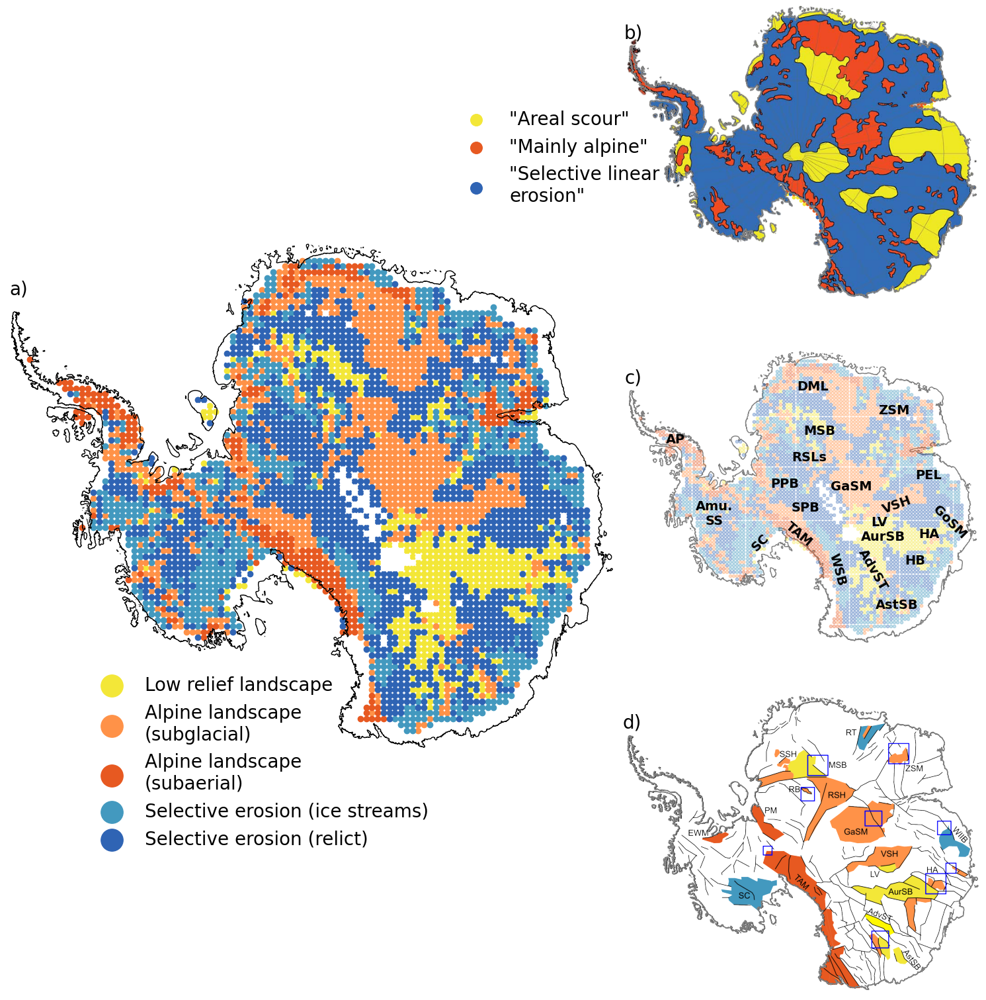

In [25]:
fig = plt.figure(constrained_layout=True, figsize = (15,15))
widths = [5.6,0.05,2.55]
heights = [1.5,1.5, 1.5, 1.5, 1.5,1.5]
gs = fig.add_gridspec(6,3, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[]]
ax[0] = fig.add_subplot(gs[1:5, :2])
ax[1] = fig.add_subplot(gs[0:2, 1:3])
ax[2] = fig.add_subplot(gs[2:4, 1:3])
ax[3] = fig.add_subplot(gs[4:,1:3])

color_map =plt.cm.get_cmap(plt.cm.rainbow)

ax[0].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', \
              label = 'Low relief landscape')#
ax[0].scatter(x_ifpa[SGM_mask], y_ifpa[SGM_mask], c = '#ff9248')
ax[0].scatter(x_ifpa[SGM_mask2], y_ifpa[SGM_mask2], c = '#ff9248', \
              label = 'Alpine landscape\n(subglacial)')
ax[0].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', \
              label = 'Alpine landscape\n(subaerial)')
ax[0].scatter(x_ifpa[icestreams_mask], y_ifpa[icestreams_mask], c  = '#4399bf', \
              label = 'Selective erosion (ice streams)')
ax[0].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', \
              label = 'Selective erosion (relict)')
ax[0].scatter(x_ifpa[dunes_mask], y_ifpa[dunes_mask], color = 'white')

edgecolors = ['k', 'grey', 'grey', 'grey']
for i in range(4):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor=edgecolors[i])
    ax[i].set_xlim(-2.55e6,2.7e6)
    ax[i].set_ylim(-2.2e6,2.2e6)
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);   
    ax[i].axis('off');

kw = {'alpha': 0.3, 's': 10}
ax[2].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', label = 'Areal scour '+r'(?)', **kw)#
ax[2].scatter(x_ifpa[SGM_mask], y_ifpa[SGM_mask], c = '#ff9248', **kw)
ax[2].scatter(x_ifpa[SGM_mask2], y_ifpa[SGM_mask2], c = '#ff9248', label = 'Alpine (subglacial)', **kw)
ax[2].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', label = 'Alpine (aerial)', **kw)
ax[2].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', label = 'Selective linear erosion', **kw)
ax[2].scatter(x_ifpa[icestreams_mask], y_ifpa[icestreams_mask], c  = '#4399bf', label = 'Ice streams', **kw)
ax[2].scatter(x_ifpa[dunes_mask], y_ifpa[dunes_mask], color = 'white', **kw)

kw = {'alpha': 1, 's': 10, 'zorder': 0}
ax[1].scatter(x_ifpa[poordetail_mask], y_ifpa[poordetail_mask], c = '#f3e738', \
              label = '"Areal scour"', **kw)#
ax[1].scatter(x_ifpa[mountain_mask], y_ifpa[mountain_mask], c = '#e75921', label = '"Mainly alpine"', **kw)
ax[1].scatter(x_ifpa[icestreams_mask2], y_ifpa[icestreams_mask2], color = '#2f64b4', \
              label = '"Selective linear\nerosion"', **kw)


places = [['AurSB', (0.73, 0.37), 0], 
          ['AstSB', (0.77, 0.14), 0], 
          ['GaSM', (0.64,0.54), 0], 
          ['LV', (0.72,0.42), 0], 
          ['DML', (0.53, 0.88), 0], 
          ['RSLs', (0.52,0.64), 0], 
          ['AP', (0.14,0.7), -0],
          ['TAM', (0.49, 0.38), -40],  
          ['HA', (0.86, 0.38), 0], 
          ['ZSM', (0.76, 0.80), 0], 
          ['HB', (0.82,0.29), 0], 
          ['SC', (0.38,0.35), 45], 
          ['Amu.\nSS', (0.25,0.45), 0], 
          ['PPB', (0.45,0.55), 0], 
          ['WSB', (0.60, 0.26), -75], 
          ['MSB', (0.55, 0.73),0], 
          ['AdvST', (0.7, 0.26), -60], 
          ['VSH', (0.77,0.48), 20], 
          ['GoSM', (0.92, 0.42), -45], 
          ['PEL', (0.86, 0.58), 0], 
          ['SPB', (0.51,0.47), 0]]


for kk in range(len(places)):
    ax[2].annotate(places[kk][0], xy = (1,2), xytext = places[kk][1], xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', rotation = places[kk][2], fontsize = 14, fontweight = 'bold')
#ax[1].scatter(x_ifpa, y_ifpa, c =  mean_ifpa, s = 40, marker = 's', alpha = 0.3, zorder = 0, edgecolors=None)
#fig.tight_layout()   

ax[0].legend(loc = (0.13,-0.2), fontsize = 20, frameon=False,markerscale=4)#.set_zorder(0)
ax[1].legend(loc = (-0.5,0.3), fontsize = 20, frameon=False,markerscale=4)#.set_zorder(0)
# Set the alpha value for the legend handles (make markers fully opaque)
#for lh in leg.legendHandles:
#    lh.set_alpha(1)

img =sio.imread(filepath_jamieson2014)
ax[1].imshow(img, extent = [-2.7e6,2.75e6,-2.2e6,2.23e6])

img =sio.imread(filepath_tectonics)
ax[3].imshow(img, extent = [-2.755e6,2.84e6,-2.32e6,2.4e6])

labels_letters = ('a)', 'b)', 'c)', 'd)')
for jk in range(4):
    ax[jk].annotate(labels_letters[jk], xy = (1,2), xytext = (0.02,0.91), xycoords = 'axes fraction', \
                   ha = 'center', c = 'k', va = 'center', fontsize = 20)

fig.savefig(figures_folder + '04sci_Textural_map.png', dpi = 200, bbox_inches = 'tight')

### Figure S1

**Steps in the Ice Flow Perturbation Analysis methodology.** A schematic illustrating the order in which various steps are carried out when IFPA is applied to a single patch. Step numbers correspond to the description in the text.

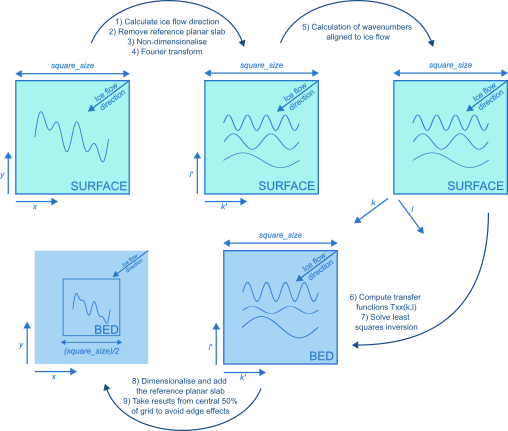

### Figure S2

**Combining multiple patches across a domain.** A schematic diagram to illustrate the steps taken when combining multiple overlapping patches to produce a smooth data product over a larger area. 

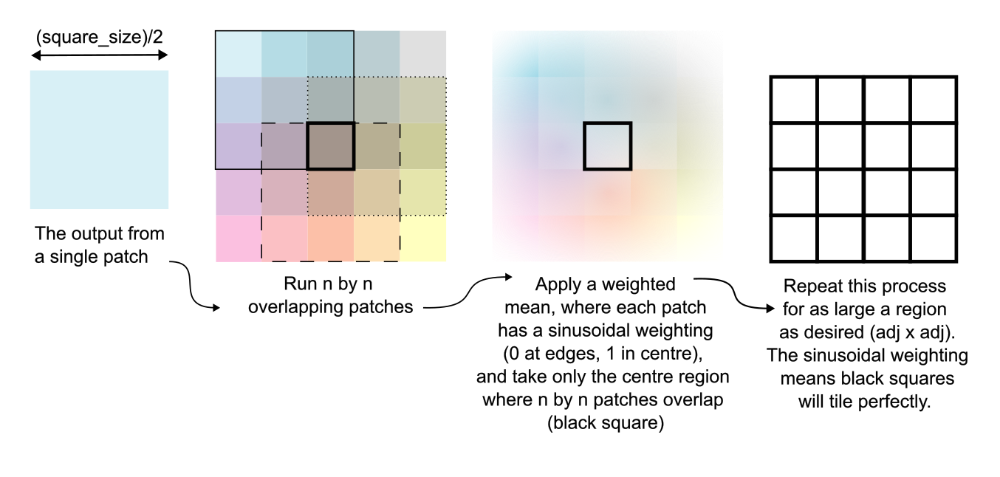

### Figure S3

**The level of detail provided by the reference baseline topography.** A comparison for
part of the Upper Recovery Subglacial Basin of (a) bed topography from BedMachine Antarctica
v3 (9), with (b) an 8.6 km mean (to match the central area of the overlapping grids) and (c) a 50 km
mean (used in previous iterations of IFPA); and the resulting bed topography produced by applying
IFPA𝑚𝑒𝑠𝑜 with (d) the 8.6 km mean topography and (e) the 50 km mean topography as a baseline.
In panel (f) the IFPA bed topography has been derived with a final correction to elevations based
on all the available ice-thickness observations. In panels (b) and (c), each individual square pixel is
8.6 km square (𝑠𝑞𝑢𝑎𝑟𝑒 𝑠𝑖𝑧𝑒/2𝑛).

In [26]:
bounds = [-1.25e6, -1.15e6, -0.3e6, -0.2e6] # Thwaites Glacier 
bounds = [0.1e6,0.2e6, 0.48e6,0.58e6] # Upper Recovery Subglacial Basin
bounds_orig = bounds

In [27]:
if generate_fromIFPA == True:
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Create a shapely geometry file for bounds to plot them later
    geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
    # Import the ITSLIVE, REMA and Bedmachine data
    X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # To load the IFPA data
    fh = Dataset(filepath_IFPAmap, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa = fh.variables['x'][xl:xh]
    Y_ifpa = fh.variables['y'][yl:yh]
    X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()
    # Calculate the width of the plot
    x_width  = (bounds[1] - bounds[0])/1000
    y_width =  (bounds[3] - bounds[2])/1000
    # Create an array of the points for the smoothed grid display
    X_points = np.arange(X_bedmach.min(), X_bedmach.max()+1, 25000/3)
    Y_points = np.arange(Y_bedmach.min(), Y_bedmach.max()+1, 25000/3)
    X_points, Y_points = np.meshgrid(X_points, Y_points)
    # For each point in this smoothed grid, calculate the mean elevation of the bed topography 
    surface = np.ndarray(X_points.shape)
    thickness = np.ndarray(X_points.shape)
    mean_bedmach = np.ndarray(X_points.shape)
    surface2 = np.ndarray(X_points.shape)
    thickness2 = np.ndarray(X_points.shape)
    mean_bedmach2 = np.ndarray(X_points.shape)
    for i,j in itertools.product(range(X_points.shape[0]), range(X_points.shape[1])):
        bounds = [X_points[i,j] - 25000, X_points[i,j]+25000, Y_points[i,j] - 25000, Y_points[i,j]+25000]
        _, _, _, _, _, _, SURF, _, _, thick, bedmach, _, _ = \
            smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_bedmach)
        surface[i,j], thickness[i,j], mean_bedmach[i,j] = np.mean(SURF), np.mean(thick), np.mean(bedmach)
        bounds = [X_points[i,j] - 25000/6, X_points[i,j]+25000/6, Y_points[i,j] - 25000/6, Y_points[i,j]+25000/6]
        _, _, _, _, _, _, SURF, _, _, thick, bedmach, _, _ = \
            smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_bedmach)
        surface2[i,j], thickness2[i,j], mean_bedmach2[i,j] = np.mean(SURF), np.mean(thick), np.mean(bedmach)

In [28]:
if generate_fromIFPA == True:
    bounds = bounds_orig
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Create a shapely geometry file for bounds to plot them later
    geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
    # Import the ITSLIVE, REMA and Bedmachine data
    X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach_new, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
    # To load the IFPA data
    fh = Dataset(filepath_ifpa50km, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa = fh.variables['x'][xl:xh]
    Y_ifpa = fh.variables['y'][yl:yh]
    X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()
    # To load the IFPA data
    fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa_new = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa_new = fh.variables['x'][xl:xh]
    Y_ifpa_new = fh.variables['y'][yl:yh]
    X_ifpa_new, Y_ifpa_new = np.meshgrid(np.array(X_ifpa_new), np.array(Y_ifpa_new))
    fh.close()
    bed_points = surface-thickness
    bed_points2 = surface2-thickness2
    # Save all the generated data to file
    np.savetxt(data_folder + 'F6_x_bedmach.csv', X_bedmach)
    np.savetxt(data_folder + 'F6_y_bedmach.csv', Y_bedmach)
    np.savetxt(data_folder + 'F6_bedmach.csv', bedmach)
    np.savetxt(data_folder + 'F6_bedmach_new.csv', bedmach_new)
    np.savetxt(data_folder + 'F6_x_ifpa.csv', X_ifpa)
    np.savetxt(data_folder + 'F6_y_ifpa.csv', Y_ifpa)
    np.savetxt(data_folder + 'F6_bed_ifpa.csv', bed_ifpa)
    np.savetxt(data_folder + 'F6_x_ifpa_new.csv', X_ifpa_new)
    np.savetxt(data_folder + 'F6_y_ifpa_new.csv', Y_ifpa_new)
    np.savetxt(data_folder + 'F6_bed_ifpa_new.csv', bed_ifpa_new)
    np.savetxt(data_folder + 'F6_x_points.csv', X_points)
    np.savetxt(data_folder + 'F6_y_points.csv', Y_points)
    np.savetxt(data_folder + 'F6_bed_bed_points.csv', surface-thickness)
    np.savetxt(data_folder + 'F6_bed_bed_points2.csv', surface2-thickness2)
else:
    # Load in the pre-made data 
    X_bedmach = np.loadtxt(data_folder + 'F6_x_bedmach.csv')
    Y_bedmach = np.loadtxt(data_folder + 'F6_y_bedmach.csv')
    bedmach = np.loadtxt(data_folder + 'F6_bedmach.csv')
    bedmach_new = np.loadtxt(data_folder + 'F6_bedmach_new.csv')
    X_ifpa = np.loadtxt(data_folder + 'F6_x_ifpa.csv')
    Y_ifpa = np.loadtxt(data_folder + 'F6_y_ifpa.csv')
    bed_ifpa = np.loadtxt(data_folder + 'F6_bed_ifpa.csv')
    X_ifpa_new = np.loadtxt(data_folder + 'F6_x_ifpa_new.csv')
    Y_ifpa_new = np.loadtxt(data_folder + 'F6_y_ifpa_new.csv')
    bed_ifpa_new = np.loadtxt(data_folder + 'F6_bed_ifpa_new.csv')
    X_points = np.loadtxt(data_folder + 'F6_x_points.csv')
    Y_points = np.loadtxt(data_folder + 'F6_y_points.csv')
    bed_points = np.loadtxt(data_folder + 'F6_bed_bed_points.csv')
    bed_points2 = np.loadtxt(data_folder + 'F6_bed_bed_points2.csv')
    # Calculate the width of the patch
    x_width  = (bounds[1] - bounds[0])/1000
    y_width =  (bounds[3] - bounds[2])/1000

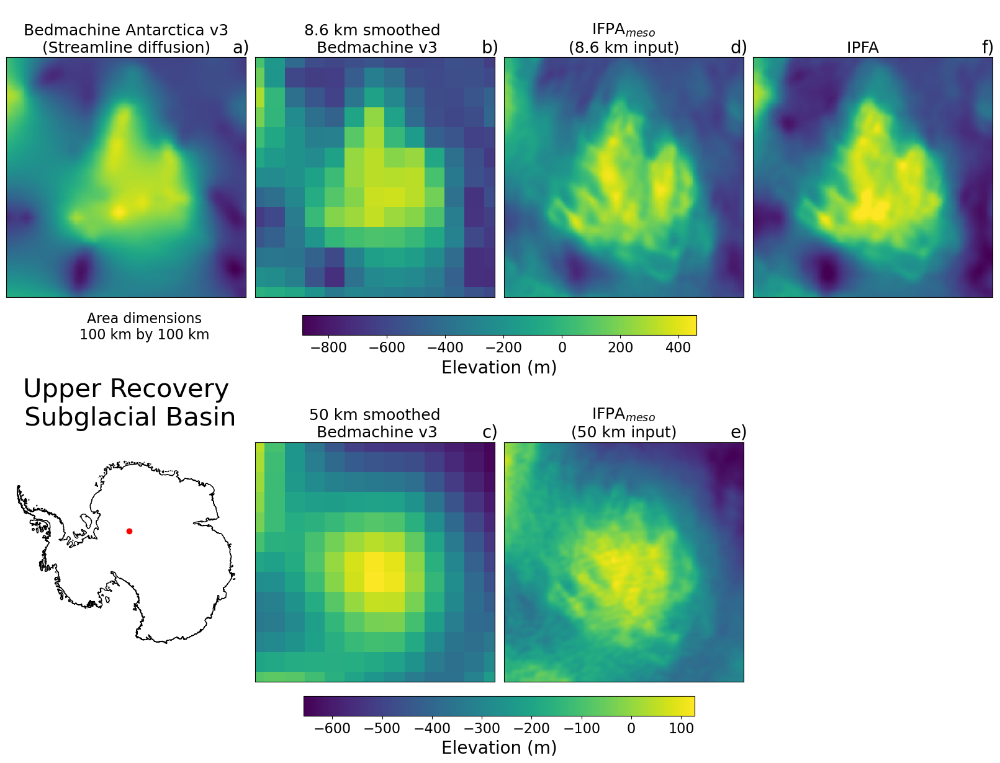

In [29]:
# Plot the data once imported`
#fig, ax = plt.subplots(1,4, figsize = (20,10), widths = (6,1,6,6))
ax = [[],[],[],[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (16,12))
widths = [6,6,6,6]
gs = fig.add_gridspec(2,4, width_ratios = widths)
ax[0] = fig.add_subplot(gs[0, 0])
ax[1] = fig.add_subplot(gs[0, 1])
ax[2] = fig.add_subplot(gs[0, 2])
ax[6] = fig.add_subplot(gs[1, 0])
ax[4] = fig.add_subplot(gs[1, 1])
ax[5] = fig.add_subplot(gs[1, 2])
ax[3] = fig.add_subplot(gs[0, 3])

d = 5
d2 = 1
im = [[],[],[],[],[],[]]
im[0] = ax[0].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach[::d2,::d2])
im[5] = ax[3].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach_new[::d2,::d2])
im[2] = ax[5].pcolor(X_ifpa[::d,::d], Y_ifpa[::d,::d], bed_ifpa[::d,::d])
im[1] = ax[2].pcolor(X_ifpa_new[::d2,::d2], Y_ifpa_new[::d2,::d2], bed_ifpa_new[::d2,::d2])
im[4] = ax[4].pcolor(X_points, Y_points, bed_points)
im[3] = ax[1].pcolor(X_points, Y_points, bed_points2)

titles = ('\nBedmachine Antarctica v3\n(Streamline diffusion)', '8.6 km smoothed \n Bedmachine v3', \
          'IFPA$_{meso}$\n(8.6 km input)', \
          'IPFA    ', '50 km smoothed\n Bedmachine v3', \
          'IFPA$_{meso}$\n(50 km input)', \
          '')
titles2 = ('Upper Recovery\n Subglacial Basin')
clims = (np.min((np.min(bedmach), np.nanmin(bed_ifpa_new))), np.max((np.max(bedmach), np.nanmax(bed_ifpa_new))))
clims2 = (np.min((np.min(bed_points), np.nanmin(bed_ifpa))), np.max((np.max(bed_points), np.nanmax(bed_ifpa)))) 
    
for i in range(7):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);       
    ax[i].set_title(titles[i], fontsize = 18)
#ax[6].set_xlabel(titles2, fontsize = 30)
for i in (0,1,3,5):
    im[i].set_clim(clims)
for i in (4,2):
    im[i].set_clim(clims2)
for i in (0,1,2,4,5,3):
    ax[i].set_xlim(bounds[0], bounds[1])
    ax[i].set_ylim(bounds[2], bounds[3])

cbar = plt.colorbar(im[0], ax = ax[0:4], shrink = 0.4, orientation = 'horizontal')
cbar.set_label('Elevation (m)', fontsize = 20)
cbar.ax.tick_params(labelsize=16)
cbar.ax.annotate('Area dimensions\n{:.0f} km by {:.0f} km\n'.format(x_width, y_width), \
               xy=(2, 1), xytext=(-0.4, 0), xycoords = 'axes fraction', fontsize = 16, ha = 'center', va = 'center');
cbar = plt.colorbar(im[2], ax = ax[4:6], shrink = 0.8, orientation = 'horizontal')
cbar.set_label('Elevation (m)', fontsize = 20)
cbar.ax.tick_params(labelsize=16)
#cbar.ax.annotate('Area dimensions\n{:.0f} km by {:.0f} km\n'.format(x_width, y_width), \
#               xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
labels_c5 = ('a)','b)','d)','f)', 'c)', 'e)')
for i in (0, 1, 2,3,4,5):
    ax[i].annotate('{}'.format(labels_c5[i]), xy = (2,1), xytext = (0.98,1.04), xycoords = 'axes fraction', \
                   ha = 'center', va = 'center', fontsize = 20)
ax[6].annotate('Upper Recovery\n Subglacial Basin', xy = (2,1), xytext = (0.5,1.24), xycoords = 'axes fraction', \
                   ha = 'center', va = 'center', fontsize = 30)


ax[6].scatter(np.mean(X_points), np.mean(Y_points), c = 'red')
ax[6].axis('off')

fig.savefig(figures_folder + 'S3sci_50km_smoothing.png', dpi = 200, bbox_inches = 'tight')

### Figure S4


**IFPA reveals the mesoscale structure of the landscape even in regions with fewer
ice-thickness measurements.** For a) Highlands B and C, and b) South Pole Basin, each panel i)
profiles bed topography from BedMachine Antarctica v3 (9) (orange), the IFPA𝑚𝑒𝑠𝑜 (light blue),
IFPA(dark blue), and ice-penetrating radar observations of bed elevation (grey). The ice-penetrating
radar profiles are from the UTIG 2010 ICECAP survey (Highlands B and C) (3), and the 2024
COLDEX survey (South Pole Basin). Panels ii) and iii) show survey-track locations, and the local
topography. The South Pole Basin line showcases how strongly IFPA performs in regions where
there is no ice-penetrating radar data, as crucially the IFPA𝑚𝑒𝑠𝑜 topography (derived with no
calibration to the location of geophysical measurements) captures the frequency of hills and valleys
which were later surveyed by COLDEX ice-radar profiling.

In [30]:
def extract_line_profiles(bounds, up, down):
    # Extend bounds slightly for importing data (grids are 500m so this should catch edges) 
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach_old, _, _ = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach_new, _, _ = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
    # Load in the IFPA data
    fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    bed_ifpa_new = fh.variables['bed'][yl:yh, xl:xh]
    X_ifpa_new = fh.variables['x'][xl:xh]
    Y_ifpa_new = fh.variables['y'][yl:yh]
    X_ifpa_new, Y_ifpa_new = np.meshgrid(np.array(X_ifpa_new), np.array(Y_ifpa_new))
    fh.close()
    print('Loaded the data')
    # Trim the radar data 
    mask = (radar_X > bounds[0]) & (radar_X < bounds[1]) & (radar_Y > bounds[2]) & (radar_Y < bounds[3])
    x_local = radar_X[mask][up:down]
    y_local = radar_Y[mask][up:down]
    b_local = radar_bed[mask][up:down]
    line_dist = np.sqrt((x_local - x_local[0])**2 + (y_local - y_local[0])**2)/1000
    # Interpolate the bed topography DEMs to the chosen line
    X_flat = np.ndarray.flatten(X_bedmach)
    Y_flat = np.ndarray.flatten(Y_bedmach)
    bed_flat = np.ndarray.flatten(bedmach_new)
    bed2_flat = np.ndarray.flatten(bedmach_old)
    bedmach_interp = griddata((X_flat, Y_flat), bed2_flat, (x_local, y_local), method = 'cubic')
    print('Bedmachine interpolated')
    ifpa_corr_interp = griddata((X_flat, Y_flat), bed_flat, (x_local, y_local), method = 'cubic')
    print('IFPA (Radar corrected) interpolated')
    X_ifpa_flat = np.ndarray.flatten(X_ifpa_new[~np.isnan(bed_ifpa_new)])
    Y_ifpa_flat = np.ndarray.flatten(Y_ifpa_new[~np.isnan(bed_ifpa_new)])
    bed_ifpa_new_flat = np.ndarray.flatten(bed_ifpa_new[~np.isnan(bed_ifpa_new)])
    ifpa_nocorr_interp = griddata((X_ifpa_flat, Y_ifpa_flat), bed_ifpa_new_flat, \
                               (x_local, y_local), method = 'cubic')
    print('IFPA (no correction, 8km baseline) interpolated')
    return line_dist, b_local, x_local, y_local, \
            bedmach_interp, ifpa_corr_interp, ifpa_nocorr_interp, bedmach_new

In [31]:
def plotting_profiles(data, bounds, A_xy, B_xy, ax0, ax1, ax2, leg_loc):
    line_dist, b_local, x_local, y_local, \
            bedmach_interp, ifpa_corr_interp, ifpa_nocorr_interp, bedmach_new = data
    ax0.scatter(line_dist, bedmach_interp, s = 0.1, color = 'C1', label = 'Bedmachine Antarctica v3', zorder = 0)
    ax0.scatter(line_dist, ifpa_nocorr_interp, s = 0.1, color = 'C9', label = 'IFPA$_{meso}$ (not radar corrected,\n8km baseline)', zorder = 3)
    ax0.scatter(line_dist, ifpa_corr_interp, s = 0.1, color = 'C0', label = 'IFPA (radar corrected)', zorder = 10)
    ax0.scatter(line_dist, b_local, s = 0.1, color = 'grey', label = 'Ice-penetrating radar', zorder = 5)
    #ax0.scatter(line_dist, ifpa_50km_interp, s = 0.1, color = 'lightblue', label = 'IFPA (not radar corrected,\n50km baseline)')
    ax0.legend(markerscale = 20, fontsize = plt_fontsize-6, loc = leg_loc)
    ax0.set_xlabel('Line distance (km)', fontsize = plt_fontsize)
    ax0.set_ylabel('Bed elevation (m)', fontsize = plt_fontsize)
    ax0.tick_params(axis='both', which='major', labelsize = plt_fontsize)
    ax0.annotate('A', xy = (1,2), xytext = (0.02,0.91), xycoords = 'axes fraction', \
                       ha = 'center', c = 'k', va = 'center', fontsize = plt_fontsize)
    ax0.annotate('B', xy = (1,2), xytext = (0.98,0.91), xycoords = 'axes fraction', \
                       ha = 'center', c = 'k', va = 'center', fontsize = plt_fontsize)
    
    ax2.annotate('A', xy = (1,2), xytext = A_xy, xycoords = 'axes fraction', \
                       ha = 'center', va = 'center', fontsize = plt_fontsize, color = 'white')
    ax2.annotate('B', xy = (1,2), xytext = B_xy, xycoords = 'axes fraction', \
                       ha = 'center', va = 'center', fontsize = plt_fontsize, color = 'white')
    ax2.scatter(x_local, y_local, s = 0.01, color = 'white')
    d = 1
    im = ax2.imshow(bedmach_new[::d,::d], extent = bounds, origin = 'upper')
    ax2.set_xlim(bounds[0], bounds[1])
    ax2.set_ylim(bounds[2], bounds[3])
    #plt.colorbar(im, ax = ax2)
    
    groundinglineM.plot(ax = ax1, facecolor = 'None', edgecolor='k', zorder = 0)
    ax1.get_xaxis().set_ticks([]); ax1.get_yaxis().set_ticks([]);   
    groundinglineM.plot(ax = ax2, facecolor = 'None', edgecolor='k', zorder = 0)
    ax2.get_xaxis().set_ticks([]); ax2.get_yaxis().set_ticks([]);   
    
    geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
    ax1.plot(*geom.exterior.xy, color = 'red', zorder = 2);
    ax1.axis('off');

In [32]:
def load_radar_lines(filepath_radar):
    radar_long = np.loadtxt(filepath_radar, skiprows = 19, delimiter = ',', usecols = (2))
    radar_lat = np.loadtxt(filepath_radar, skiprows = 19, delimiter = ',', usecols = (3))
    radar_surf = np.loadtxt(filepath_radar, skiprows = 19, delimiter = ',', usecols = (6))
    radar_thick = np.loadtxt(filepath_radar, skiprows = 19, delimiter = ',', usecols = (7))
    radar_bed = np.loadtxt(filepath_radar, skiprows = 19, delimiter = ',', usecols = (8))
    # Remove data points where the bed is set to -9999 and no elevation has been recorded
    mask1 = radar_bed > -8000
    radar_long = radar_long[mask1]
    radar_lat = radar_lat[mask1]
    radar_surf = radar_surf[mask1]
    radar_thick = radar_thick[mask1]
    radar_bed = radar_bed[mask1]
    transformer = Transformer.from_crs("epsg:4326","epsg:3031")
    radar_X, radar_Y = transformer.transform(radar_lat, radar_long)
    return radar_X, radar_Y, radar_bed

In [33]:
if generate_fromIFPA == True:
    print('Beginning data interpolation (SLOW)')
    # Set the filepath to the radar survey of interest
    radar_X, radar_Y, radar_bed = load_radar_lines(filepath_UTIG) # Load in the UTIG survey
    # Set the bounding box of the region to load all radar points from this survey
    bounds = [1.90e6, 2.20e6, -0.725e6, -0.425e6] # Highland A
    # Select the start and end indexes of the section of interest
    up = 50150
    down = 60000 
    # Interpolate to extract the line profiles of interest
    HA_data = extract_line_profiles(bounds, up, down)
    # Save these profiles to file
    np.savetxt(filepath_HA, HA_data[0:7])
    np.savetxt(filepath_HA_ifpa,HA_data[7])
    print('CREATED interpolated data')
    # Set the bounding box of the region to load all radar points from this survey
    bounds = [1.6e6,2.2e6, -1.0e6, -0.6e6] # Highland B
    # Select the start and end indexes of the section of interest
    up = 22000
    down = 41000
    # Interpolate to extract the line profiles of interest
    HB_data = extract_line_profiles(bounds, up, down)
    # Save these profiles to file
    np.savetxt(filepath_HB,HB_data[0:7])
    np.savetxt(filepath_HB_ifpa,HB_data[7])
    print('CREATED interpolated data')
    # Set the filepath to the radar survey of interest
    radar_X, radar_Y, radar_bed = load_radar_lines(filepath_BAS) # Load in the BAS survey
    # Set the bounding box of the region to load all radar points from this survey
    bounds = [-0.2e6,0.3e6,0.6e6,1.1e6] # Recovery Subglacial Basin
    # Select the start and end indexes of the section of interest
    up = 116000
    down = 165000
    # Interpolate to extract the line profiles of interest
    RSB_data = extract_line_profiles(bounds, up, down)
    # Save these profiles to file
    np.savetxt(filepath_RSB,RSB_data[0:7])
    np.savetxt(filepath_RSB_ifpa,RSB_data[7])
    print('CREATED interpolated data')

In [34]:
if generate_fromIFPA == True:
    # Import the radar data for the ICECAP survey
    from pyproj import Transformer
    import pandas as pd
    transformer = Transformer.from_crs("epsg:4326","epsg:3031")
    icecap = pd.read_csv(filepath_ICECAP)
    icecap['x'], icecap['y'] = transformer.transform(icecap.LAT, icecap.LON)
    radar_X = icecap.x.values
    radar_Y = icecap.y.values
    radar_bed = (icecap.ELEVATION - icecap.BOTTOM).values
    # Set the bounding box of the region to load all radar points from this survey
    bounds = [0.3e6,0.75e6, -0.3e6,-0.05e6] # Recovery Subglacial Basin
    # Select the start and end indexes of the section of interest
    up = 107000
    down = 120000
    # Interpolate to extract the line profiles of interest
    ICECAP_data = extract_line_profiles(bounds, up, down)
    # Save these profiles to file
    np.savetxt(filepath_ICE,ICECAP_data[0:7])
    np.savetxt(filepath_ICE_ifpa,ICECAP_data[7])
    print('CREATED interpolated data')
else:
    # Load the interpolated data for the Highland A region
    HA_data = np.loadtxt(filepath_HA)[0], np.loadtxt(filepath_HA)[1], \
              np.loadtxt(filepath_HA)[2], np.loadtxt(filepath_HA)[3], \
              np.loadtxt(filepath_HA)[4], np.loadtxt(filepath_HA)[5], \
              np.loadtxt(filepath_HA)[6], np.loadtxt(filepath_HA_ifpa)
    # Load the interpolated data for the Highland B region
    HB_data = np.loadtxt(filepath_HB)[0], np.loadtxt(filepath_HB)[1], \
              np.loadtxt(filepath_HB)[2], np.loadtxt(filepath_HB)[3], \
              np.loadtxt(filepath_HB)[4], np.loadtxt(filepath_HB)[5], \
              np.loadtxt(filepath_HB)[6], np.loadtxt(filepath_HB_ifpa)
    # Load the interpolated data for the Recovery Subglacial Basins region
    RSB_data = np.loadtxt(filepath_RSB)[0], np.loadtxt(filepath_RSB)[1], \
              np.loadtxt(filepath_RSB)[2], np.loadtxt(filepath_RSB)[3], \
              np.loadtxt(filepath_RSB)[4], np.loadtxt(filepath_RSB)[5], \
              np.loadtxt(filepath_RSB)[6], np.loadtxt(filepath_RSB_ifpa)
    # Load the interpolated data for the Recovery Subglacial Basins region
    ICECAP_data = np.loadtxt(filepath_ICE)[0], np.loadtxt(filepath_ICE)[1], \
              np.loadtxt(filepath_ICE)[2], np.loadtxt(filepath_ICE)[3], \
              np.loadtxt(filepath_ICE)[4], np.loadtxt(filepath_ICE)[5], \
              np.loadtxt(filepath_ICE)[6], np.loadtxt(filepath_ICE_ifpa)
    print('LOADED Pre-interpolated data')

LOADED Pre-interpolated data


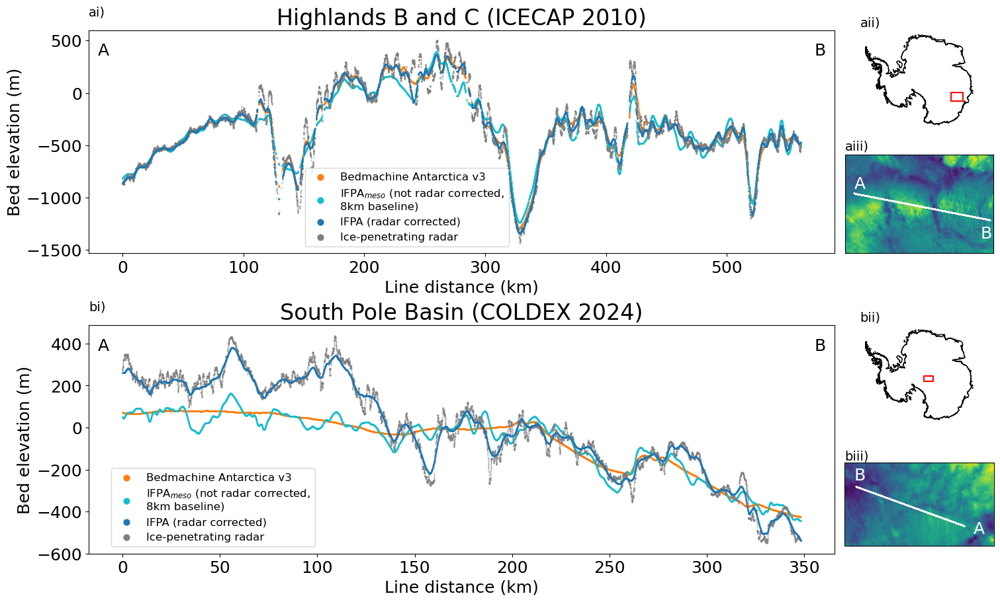

In [35]:
fig = plt.figure(constrained_layout=True, figsize = (15,9))
widths = [10,2]
heights = [5,5,5,5]
gs = fig.add_gridspec(4,2, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[],[],[],[],[],[]]
for i in range(2):
    ax[3*i+0] = fig.add_subplot(gs[2*i+0:2*i+2, 0])
    ax[3*i+1] = fig.add_subplot(gs[2*i+0, 1])
    ax[3*i+2] = fig.add_subplot(gs[2*i+1, 1])

plt_fontsize = 18

#plotting_profiles(RSB_data, [-0.2e6,0.3e6,0.6e6,1.1e6], (0.15,0.85), (0.8,0.1), ax[0], ax[1], ax[2], (.03,0.61))
#plotting_profiles(HA_data, [1.90e6, 2.20e6, -0.725e6, -0.425e6], (0.15,0.85), (0.8,0.1), ax[3], ax[4], ax[5],0)
plotting_profiles(HB_data, [1.6e6,2.2e6, -1.0e6, -0.6e6], (0.1,0.7), (0.95,0.2), ax[0], ax[1], ax[2],(0.29,.03))
plotting_profiles(ICECAP_data, [0.3e6,0.75e6, -0.3e6,-0.05e6], (0.9,0.2), (0.1,0.85), ax[3], ax[4], ax[5],(0.03,.03))

#ax[0].set_title('Recovery Subglacial Basin', fontsize = plt_fontsize+6);
ax[0].set_title('Highlands B and C (ICECAP 2010)', fontsize = plt_fontsize+6);
ax[3].set_title('South Pole Basin (COLDEX 2024)', fontsize = plt_fontsize+6);

labels = ['ai)','aii)', 'aiii)', 'bi)','bii)', 'biii)', 'ci)','cii)', 'ciii)'] 
for i in range(6):
    ax[i].annotate(labels[i], xy = (1,2), xytext = (0.0,1.08), xycoords = 'axes fraction', \
                       ha = 'left', va = 'center', fontsize = plt_fontsize-4, color = 'k')

fig.savefig(figures_folder + 'S4sci_Radar_profile.png', dpi = 200, bbox_inches = 'tight')

## Figure S5

**Even without ice-thickness information, IFPA𝑚𝑒𝑠𝑜 maps real topographic features,
as seen in geophysical surveys.** For a) the Upper Thwaites Glacier region, and b) part of Princess
Elizabeth Land, a comparison of i) a baseline bed topography with minimal ice-thickness information
from geophysical surveys (a single ice thickness value of 2000 m for Upper Thwaites Glacier,
the BedMachine v1 bed topography for Princess Elizabeth Land), ii) the bed topography when IFPA
is applied with this baseline bed topography, iii) bed topography produced by streamline diffusion
between geophysical surveys (from BedMachine Antarctica v3). Panels iv) and v) show the location
of geophysical survey observations in the Bedmap3 compilation (3) in the region shown, and the
location of the region within Antarctica respectively.

In [36]:
# Load in the bedmap data

bedmap_bed = np.loadtxt(filepath_bedmap_radar_bed)
bedmap_x = np.loadtxt(filepath_bedmap_radar_x)
bedmap_y = np.loadtxt(filepath_bedmap_radar_y)
bedmap_thick = np.loadtxt(filepath_bedmap_radar_thick)
bedmap_xt = np.loadtxt(filepath_bedmap_radar_xt)
bedmap_yt = np.loadtxt(filepath_bedmap_radar_yt)

In [37]:
def plot_baseline_comp(filename_this_run, ax0, ax1, ax2, ax3, ax4, ax5, title, centre_coord):

    axs2 = [ax0,ax1,ax2,ax3,ax4,ax5]
    # Import the data 
    filename = data_folder + filename_this_run + '.nc'
    output = Dataset(filename,'r',format='netCDF4')
    X = output.variables['x'][:]
    Y = output.variables['y'][:]
    x, y = np.meshgrid(X, Y)
    bed = output.variables['bed'][:,:]
    errbed_j = output.variables['errbed'][:,:]
    output.close()
    bounds = [np.min(x), np.max(x), np.min(y), np.max(y)]
    X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach, Y_bedmach, thick, bedmach, errbed, source = \
            smooth_data_load(bounds, filepath_measures, filepath_rema, filepath_bedmach)
    X_its, Y_its, VX, VY, X_rema, Y_rema, SURF, X_bedmach2, Y_bedmach2, thick, bedmach2, errbed, source = \
            smooth_data_load(bounds, filepath_measures, filepath_rema, filepath_bedmach_v1)
    corr = np.mean(thick) - 2000

    im = [[],[],[],[]]
    if filename_this_run == 'UThw':
        im[0] = ax0.pcolor(X_rema, Y_rema, SURF - 2000 - corr)
        im[1] = ax1.pcolor(x,y,bed-corr)
    else:
        im[0] = ax0.pcolor(X_bedmach, Y_bedmach, bedmach2)
        im[1] = ax1.pcolor(x,y,bed)
    im[2] = ax2.pcolor(X_bedmach, Y_bedmach, bedmach)
    
    for i in (0,1,2):
        im[i].set_clim(np.min(bedmach2), np.max(bedmach2))

    
    ax3.axis('off')
    cbar = plt.colorbar(im[2], ax = ax0, location='left', shrink = 0.7)
    cbar.set_label('Elevation (m)', fontweight = 'bold', fontsize = 18)
    cbar.ax.tick_params(labelsize=18)

    for i in (0,1,2,4):
        axs2[i].set_xlim(bounds[0], bounds[1])
        axs2[i].set_ylim(bounds[2], bounds[3])
        axs2[i].get_xaxis().set_ticks([]); axs2[i].get_yaxis().set_ticks([]);

    geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
    ax3.plot(*geom.exterior.xy, color = 'r')
    
    mask_x = (bedmap_x > bounds[0]) & (bedmap_x < bounds[1])
    mask_y = (bedmap_y > bounds[2]) & (bedmap_y < bounds[3])
    mask_all = mask_x & mask_y
    mask_x = (bedmap_xt > bounds_import[0]) & (bedmap_xt < bounds_import[1])
    mask_y = (bedmap_yt > bounds_import[2]) & (bedmap_yt < bounds_import[3])
    mask_allt = mask_x & mask_y
    ax4.scatter(bedmap_x[mask_all], bedmap_y[mask_all], s = 0.001, c = 'red', marker = '.')
    ax4.scatter(bedmap_xt[mask_allt], bedmap_yt[mask_allt], s = 0.001, c = 'red', marker = '.')
    ax4.set_xlabel('BedMap3\nsurvey data', fontsize = 16)

    if filename_this_run == 'UThw':
        titles = ['Baseline bed topography\n(Ice surface - 2000 m)', \
                  'IFPA$_{meso}$\n(Applied to base topo,\nNo radar information)', \
                  'BedMachine v3\n(streamline diffusion of\nradar survey data)','']
    else:
        titles = ['Baseline bed topography\n(Bedmachine v1)', \
                  'IFPA$_{meso}$\n(Applied to base topo,\nMinimal radar information)', \
                  'BedMachine v3\n(streamline diffusion of\nradar survey data)','']

    x_width  = 100
    y_width =  100
    x_cen = centre_coord[0]
    y_cen = centre_coord[1]
    
    ax2.annotate('\nDimensions: {:.0f} km by {:.0f} km'.format(x_width, y_width) +
                    '\nCentral Coordinate {:.0f},{:.0f}'.format(x_cen, y_cen), xytext = (1.0,1.01), xy = (1.0,1.01), \
                    xycoords = 'axes fraction', ha = 'right', fontsize = 12)

    for i in range(5):
        groundinglineM.plot(ax = axs2[i], facecolor = 'None', edgecolor='k', zorder = 0)
    for i in range(4):
        axs2[i].set_xlabel(titles[i], fontsize = 18)
    ax1.set_title(title, fontweight = 'bold', fontsize = 24, pad = 20)

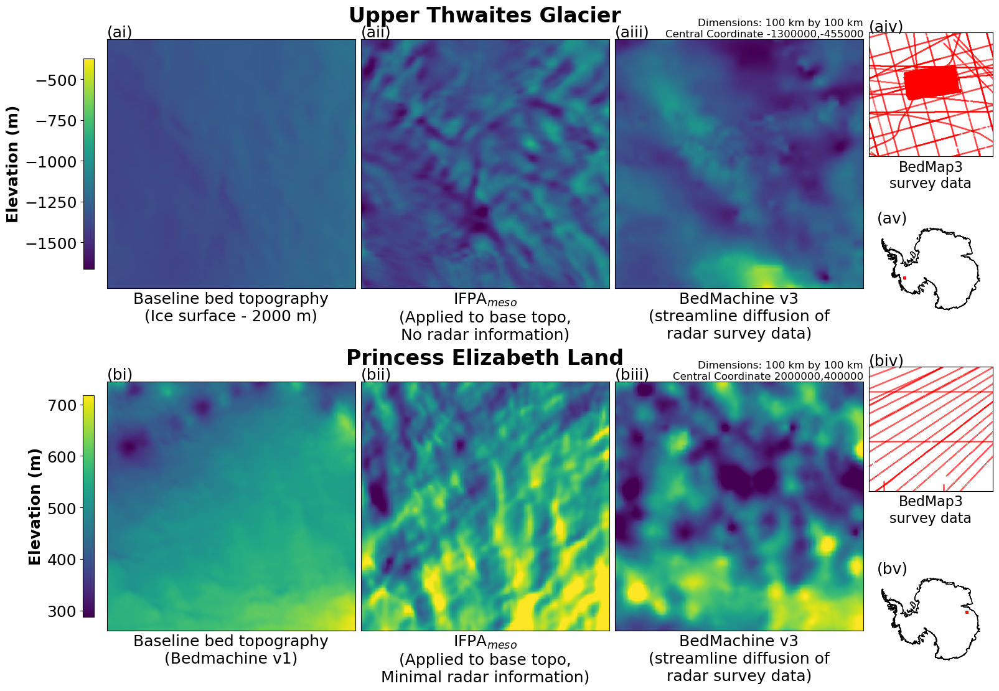

In [38]:
fig = plt.figure(constrained_layout=True, figsize = (16,11))
ax = [[],[],[],[],[],[],[],[],[],[],[],[]]
widths = [0.1,6,6,6,3]
heights = [4.5,2.5]*2
gs = fig.add_gridspec(4,5, width_ratios = widths, height_ratios = heights)

for i in range(2):
    jkj = i*2
    ax[0+6*i] = fig.add_subplot(gs[jkj:jkj+2, 1])
    ax[1+6*i] = fig.add_subplot(gs[jkj:jkj+2, 2])
    ax[2+6*i] = fig.add_subplot(gs[jkj:jkj+2, 3])
    #ax[4+6*i] = fig.add_subplot(gs[jkj:jkj+2, 0])
    ax[4+6*i] = fig.add_subplot(gs[jkj, 4])
    ax[3+6*i] = fig.add_subplot(gs[jkj+1, 4])

plot_baseline_comp('UThw', ax[0],ax[1],ax[2],ax[3],ax[4], ax[5], 'Upper Thwaites Glacier', [-1.30e6, -0.455e6])
plot_baseline_comp('Ant_PEL7_ur', ax[6],ax[7],ax[8],ax[9],ax[10],ax[11], 'Princess Elizabeth Land', [2.0e6,0.4e6])

labels = '(a', '(b'
letters = 'i)','ii)', 'iii)', 'v)', 'iv)'
for i in range(2):
    for j in range(5):
        ax[j+i*6].annotate(labels[i]+letters[j], xy = (0,1.02), xytext = (0,1.01), xycoords = 'axes fraction', fontsize = 18)

fig.savefig(figures_folder + 'S5sci_IFPA_no_radar.jpg', dpi = 200, bbox_inches = 'tight')

## Figure S6

**50 m hills in a 5 km neighborhood in the Pensacola-Pole Basin for different
topography maps.** For i) BedMap3 (4), ii) BedMachine Antarctica v3 (9) and iii) the new IFPA
map, all points which are the highest cell in their 5 km neighborhood, and which are at least 50
m higher than their lowest neighborhood are marked by black dots in panels a), with the regional
topography from the respective map shown in both panels a) and b) for comparison. The icethickness
observations in the region are shown in c), and the location of the region in Antarctica in
d). The IFPA topography identifies hills in regions away from survey lines, whereas the pattern of
hills in Bedmap3 is clearly influenced by the distribution of ice-thickness measurements.

In [39]:
# Load in the data in the region of interest
centre_coord = [-0.1e6,0.2e6] # Pensacola Pole Basin
e = 200200
bounds = [centre_coord[0] - e, centre_coord[0] + e, centre_coord[1] -e, centre_coord[1] +e]
# Import the bedmap3 data in this region 
fh = Dataset(filepath_bedmap3_map, 'r', format = 'NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
xl = next(x for x, val in enumerate(X) if val >= bounds[0]) # X in ascending order
xh = next(x for x, val in enumerate(X) if val >= bounds[1])
yl = next(x for x, val in enumerate(Y) if val <= bounds[2])  # Y in descending order
yh = next(x for x, val in enumerate(Y) if val <= bounds[3])  
#print(xl,xh,yl,yh)
bed = fh.variables['bed_topography'][yh:yl, xl:xh]
radar = fh.variables['thickness_survey_count'][yh:yl,xl:xh]
X2 = fh.variables['x'][xl:xh]
Y2 = fh.variables['y'][yh:yl]
X2, Y2 = np.meshgrid(np.array(X2), np.array(Y2))
fh.close()
# Import the ITSLIVE, REMA and Bedmachine data
_, _, _, _, _, _, _, X_bedmach, Y_bedmach, thick, bedmach, _, _ = \
         smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_bedmach)

if generate_fromIFPA == True:
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bed_i, _, _ = \
    smooth_data_load(bounds, filepath_itslive, filepath_rema, filepath_IFPAmap)
    np.savetxt(filepath_PPB_ifpa, bed_i)
else:
    bed_i = np.loadtxt(filepath_PPB_ifpa)
    
#bedmap3_b1_5km[i] = PSD_smoothed(bed, X2, Y2, 5000)
#bedmap3_count_max_50[i] = bumpiness_bedmap3(bed, 50)

In [40]:
def slope_removal(grid, return_angle = False):
    y_grid = np.arange(0,grid.shape[0], 1)
    y_grid = y_grid - np.mean(y_grid)
    x_grid = np.arange(0,grid.shape[1], 1)
    x_grid = x_grid - np.mean(x_grid)
    x_grid, y_grid = np.meshgrid(x_grid, y_grid)
    xs = np.ndarray.flatten(x_grid[::,::])
    ys = np.ndarray.flatten(y_grid[::,::])
    zs = np.ndarray.flatten(grid[::, ::])
    # do fit
    tmp_A = []
    tmp_b = []
    for i in range(len(xs)):
        tmp_A.append([xs[i], ys[i], 1])
        tmp_b.append(zs[i])
    b = np.matrix(tmp_b).T
    A = np.matrix(tmp_A)
    # Manual solution
    fit = (A.T * A).I * A.T * b
    #alpha_s = np.array((fit[0]**2 + fit[1] **2)/ (np.sqrt((fit[0]**2 + fit[1] **2))))
    angle = (np.arctan2(fit[1],fit[0]) *180/np.pi)
    #Calculate the slope array
    Z2 = x_grid * np.array(fit[0]) + y_grid * np.array(fit[1]) + np.array(fit[2])
    if return_angle == True:
        return angle
    else:
        return Z2

def bump_locations(bed, threshold_a, neighbourhood_size):
    threshold_a = 50
    grid = bed
    bed_deslope = ((grid - slope_removal(grid))-np.mean(grid-slope_removal(grid))) 
    data = bed_deslope
    neighborhood_size = 10
    threshold = threshold_a 
    bed_count = 0
    
    data_max = maximum_filter(data, neighborhood_size)
    maxima = (data == data_max)
    data_min = minimum_filter(data, neighborhood_size)
    diff = ((data_max - data_min) > threshold)
    maxima[diff == 0] = 0
    
    labeled, num_objects = ndimage.label(maxima)
    slices = ndimage.find_objects(labeled)
    x, y = [], []
    for dy,dx in slices:
        x_center = (dx.start + dx.stop - 1)/2
        y_center = (dy.start + dy.stop - 1)/2
        # To avoid double counting between squares we remove maxima on the 0 edges 
        if x_center == 0:
            None
        else: 
            if y_center == 0:
                None
            else:
                x.append(x_center)
                y.append(y_center)
        bed_count = len(x)
    return x,y,len(x)

In [41]:
import scipy.ndimage as ndimage
from scipy.ndimage import maximum_filter, minimum_filter

In [42]:
x,y, bed_count = bump_locations(bed,50,10)
x_mach, y_mach, bed_count_bedmach = bump_locations(bedmach,50,10)
x_ifpa2, y_ifpa2, bed_count_ifpa = bump_locations(bed_i, 50,10)

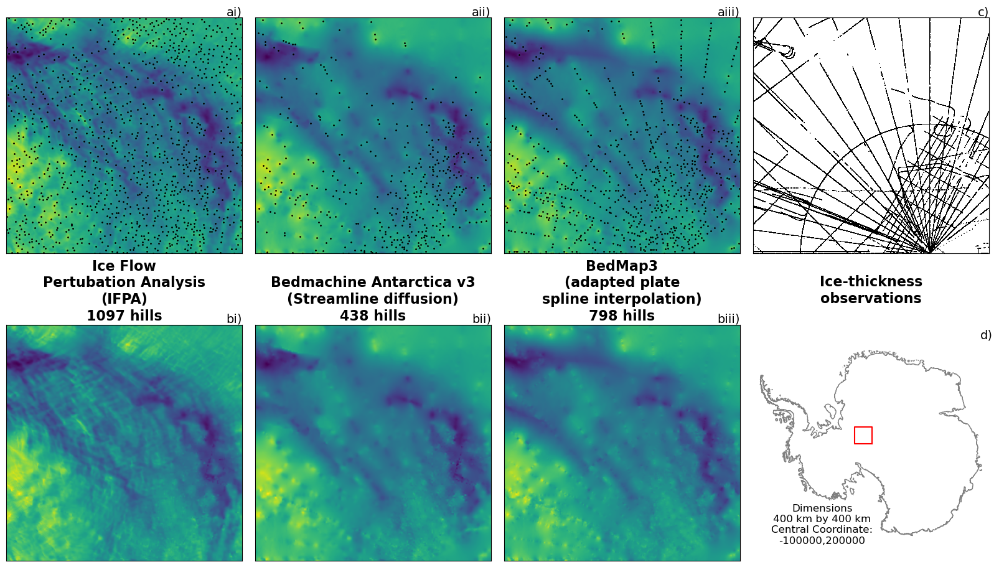

In [43]:
fig = plt.figure(constrained_layout=True, figsize = (16,9))
widths = [4,4,4,4]
heights = [4,4]
gs = fig.add_gridspec(2,4, width_ratios = widths, height_ratios = heights)
ax = [[],[],[],[],[],[],[],[],[],[],[],[]]
ax[0] = fig.add_subplot(gs[0, 0])
ax[1] = fig.add_subplot(gs[1, 0])
ax[2] = fig.add_subplot(gs[0, 1])
ax[3] = fig.add_subplot(gs[1,1])
ax[4] = fig.add_subplot(gs[0,2])
ax[5] = fig.add_subplot(gs[1,2])
ax[6] = fig.add_subplot(gs[0,3])
ax[7] = fig.add_subplot(gs[1,3])

titles = ['Ice Flow\nPertubation Analysis\n(IFPA)\n{} hills'.format(bed_count_ifpa), 
          'Bedmachine Antarctica v3\n(Streamline diffusion)\n{} hills'.format(bed_count_bedmach),\
          'BedMap3\n(adapted plate\nspline interpolation)\n{} hills'.format(bed_count),\
          'Ice-thickness\nobservations\n\n']
labels = ['ai)', 'bi)', 'aii)', 'bii)', 'aiii)', 'biii)', 'c)', 'd)']

im = ax[6].pcolor(X2, Y2, radar, cmap = 'Greys')
im.set_clim(0.99,1)

for i in range(8):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey')
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    ax[i].annotate(labels[i], xy = (1,1), xytext = (1,1), xycoords = 'axes fraction', va = 'bottom', ha = 'right', fontsize = 14)
for i in (0,1,2,3,4,5,6):
    ax[i].set_xlim(bounds[0], bounds[1])
    ax[i].set_ylim(bounds[2], bounds[3])
for i in range(4):
    ax[i*2+1].set_title(titles[i], fontweight ='bold', fontsize = 16)

ax[7].axis('off');
geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
ax[7].plot(*geom.exterior.xy, color = 'red')

x_width  = (bounds[1] - bounds[0])/1000
y_width =  (bounds[3] - bounds[2])/1000
ax[7].annotate('Dimensions\n{:.0f} km by {:.0f} km\nCentral Coordinate:\n{:.0f},{:.0f}'.format(x_width, y_width, \
                                                                                       centre_coord[0], centre_coord[1]), \
               xy=(2, 1), xytext=(0.3, 0.1), xycoords = 'axes fraction', fontsize = 12, ha = 'center', va = 'center');

ax[4].pcolor(X2, Y2, bed, alpha = 0.5)
ax[5].pcolor(X2, Y2, bed)
for i in range(len(x)):
    ax[4].scatter(X2[0,int(x[i])],Y2[int(y[i]),0], color = 'k', s = 1)

ax[2].pcolor(X_bedmach, Y_bedmach, bedmach, alpha = 0.5)
ax[3].pcolor(X_bedmach, Y_bedmach, bedmach)
for i in range(len(x_mach)):
    ax[2].scatter(X_bedmach[0,int(x_mach[i])],Y_bedmach[int(y_mach[i]),0], color = 'k', s = 1)

ax[0].pcolor(X_bedmach, Y_bedmach, bed_i, alpha  = 0.5)
ax[1].pcolor(X_bedmach, Y_bedmach, bed_i)
for i in range(len(x_ifpa2)):
    ax[0].scatter(X_bedmach[0,int(x_ifpa2[i])],Y_bedmach[int(y_ifpa2[i]),0], color = 'k', s = 1)

fig.savefig(figures_folder+ 'S6sci_Bumpiness_bedmap.jpg', bbox_inches = 'tight', dpi = 200)

### Figure S7 

**Examples of training data sets for different topographic styles.** 150 km by 150
km topographic patches from IFPA for a) Areal scour, b) Alpine (subglacial), c) Alpine (aerial),
d) Selective linear erosion in Ice streams and e) Artefacts caused by dunes in the ice surface. The
locations of the chosen topographic patches are shown on the maps at the bottom of each column.

In [44]:
# Create a function to import the IFPA bed topography and Bedmachine bed topography for a selected bounded area 
def import_IFPA_Bedmachine(bounds):
    # Extend bounds slightly for importing data
    bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    _, _, _, _, _, _, _, X_ifpa, Y_ifpa, _, bed_ifpa, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
    # To load the IFPA data
    fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
    xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
    yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
    yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
    #bed_ifpa = fh.variables['bed'][yl:yh, xl:xh]
    #X_ifpa = fh.variables['x'][xl:xh]
    #Y_ifpa = fh.variables['y'][yl:yh]
    #X_ifpa, Y_ifpa = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
    fh.close()
    return X_ifpa, Y_ifpa, bed_ifpa, X_bedmach, Y_bedmach, bedmach

In [45]:
# Set the bounds for each of the chosen regions exemplifying different topographic types 
bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [0.15e6, 0.25e6, -0.7e6, -0.6e6] # Mountains
bounds_array[1] = [0.35e6, 0.45e6, 0.05e6, 0.15e6] # Dunes
bounds_array[1] = [1.10e6, 1.20e6, -1.0e6,-0.9e6] #Dunes?
bounds_array[2] = [0.65e6, 0.75e6, 0.15e6, 0.25e6] # Subglacial mountains
bounds_array[3] = [-1.4e6, -1.3e6, -0.5e6, -0.4e6] # Ice stream
bounds_array[4] = [1.35e6, 1.45e6, -0.65e6,-0.55e6] # Low relief
bounds_array_v1 = bounds_array

bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [1.6e6, 1.7e6, 0.75e6,0.85e6] # Mountains
bounds_array[0] = [-1.2e6,-1.1e6, -0.9e6,-0.8e6]
bounds_array[0] = [0.5e6,0.6e6, -1.75e6,-1.65e6]
bounds_array[1] = [0.85e6, 0.95e6, -0.55e6, -0.45e6] # Dune
bounds_array[1] = [0.55e6,0.65e6, -0.35e6,-0.25e6]
bounds_array[2] = [1.6e6, 1.7e6, -0.9e6, -0.8e6] # Subglacial mountains
bounds_array[2] = [0.8e6,0.9e6, 1.0e6,1.1e6]
bounds_array[3] = [2.1e6, 2.2e6, 0.05e6, 0.15e6] # Ice stream
bounds_array[4] = [1.75e6, 1.85e6, -0.65e6, -0.55e6] # Low relief 
bounds_array_v2 = bounds_array

bounds_array = np.ndarray(5, dtype = np.ndarray)
bounds_array[0] = [0.8e6, 0.9e6, 1.7e6, 1.8e6] # Mountains
bounds_array[1] = [0.65e6, 0.75e6, -0.15e6, -0.05e6] # Dunes
bounds_array[1] = [0.75e6,0.85e6,-0.55e6,-0.45e6] 
bounds_array[1] = [0.85e6, 0.95e6, -0.55e6, -0.45e6]
bounds_array[2] = [2.05e6, 2.15e6, -0.65e6, -0.55e6] # Subglacial mountains
bounds_array[2] = [2.2e6,2.3e6,-0.4e6,-0.3e6]
bounds_array[3] = [-0.4e6, -0.3e6, 1.05e6, 1.15e6] # Ice stream
bounds_array[4] = [1.1e6, 1.2e6, -0.7e6, -0.6e6] # Low relief
bounds_array_v3 = bounds_array

# Create labels 
types = ['Alpine landscape\n(subaerial)', 'Artefacts\n(from dunes)', \
         'Alpine landscape\n(subglacial)', 'Selective erosion', 'Low-relief\nlandscape']

In [46]:
# Import the bed topography for each of these chosen regions 
X_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs1 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs1 = np.ndarray(6, dtype = np.ndarray)
    
X_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs2 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs2 = np.ndarray(6, dtype = np.ndarray)

X_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
Y_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
bed_ifpa_bs3 = np.ndarray(6, dtype = np.ndarray)
X_bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)
Y_bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)
bedmach_bs3 = np.ndarray(6, dtype = np.ndarray)

In [47]:
if generate_fromIFPA == True:
    for jj in range(len(bounds_array_v1)):
        X_ifpa_bs1[jj], Y_ifpa_bs1[jj], bed_ifpa_bs1[jj], X_bedmach_bs1[jj], Y_bedmach_bs1[jj], bedmach_bs1[jj] = \
                            import_IFPA_Bedmachine(bounds_array_v1[jj]);
    for jj in range(len(bounds_array_v2)):
        X_ifpa_bs2[jj], Y_ifpa_bs2[jj], bed_ifpa_bs2[jj], X_bedmach_bs2[jj], Y_bedmach_bs2[jj], bedmach_bs2[jj] = \
                            import_IFPA_Bedmachine(bounds_array_v2[jj]);
    for jj in range(len(bounds_array_v3)):
        X_ifpa_bs3[jj], Y_ifpa_bs3[jj], bed_ifpa_bs3[jj], X_bedmach_bs3[jj], Y_bedmach_bs3[jj], bedmach_bs3[jj] = \
                            import_IFPA_Bedmachine(bounds_array_v3[jj]);
    for i in range(len(bounds_array_v1)):
        np.savetxt(data_folder + 'F9_1_'+str(i)+'x_bedmach.csv', X_bedmach_bs1[i])
        np.savetxt(data_folder + 'F9_1_'+str(i)+'y_bedmach.csv', Y_bedmach_bs1[i])
        np.savetxt(data_folder + 'F9_1_'+str(i)+'bedmach.csv', bedmach_bs1[i])
        np.savetxt(data_folder + 'F9_1_'+str(i)+'x_ifpa.csv', X_ifpa_bs1[i])
        np.savetxt(data_folder + 'F9_1_'+str(i)+'y_ifpa.csv', Y_ifpa_bs1[i])
        np.savetxt(data_folder + 'F9_1_'+str(i)+'bed_ifpa.csv', bed_ifpa_bs1[i])
    for i in range(len(bounds_array_v2)):
        np.savetxt(data_folder + 'F9_2_'+str(i)+'x_bedmach.csv', X_bedmach_bs2[i])
        np.savetxt(data_folder + 'F9_2_'+str(i)+'y_bedmach.csv', Y_bedmach_bs2[i])
        np.savetxt(data_folder + 'F9_2_'+str(i)+'bedmach.csv', bedmach_bs2[i])
        np.savetxt(data_folder + 'F9_2_'+str(i)+'x_ifpa.csv', X_ifpa_bs2[i])
        np.savetxt(data_folder + 'F9_2_'+str(i)+'y_ifpa.csv', Y_ifpa_bs2[i])
        np.savetxt(data_folder + 'F9_2_'+str(i)+'bed_ifpa.csv', bed_ifpa_bs2[i])
    for i in range(len(bounds_array_v3)):
        np.savetxt(data_folder + 'F9_3_'+str(i)+'x_bedmach.csv', X_bedmach_bs3[i])
        np.savetxt(data_folder + 'F9_3_'+str(i)+'y_bedmach.csv', Y_bedmach_bs3[i])
        np.savetxt(data_folder + 'F9_3_'+str(i)+'bedmach.csv', bedmach_bs3[i])
        np.savetxt(data_folder + 'F9_3_'+str(i)+'x_ifpa.csv', X_ifpa_bs3[i])
        np.savetxt(data_folder + 'F9_3_'+str(i)+'y_ifpa.csv', Y_ifpa_bs3[i])
        np.savetxt(data_folder + 'F9_3_'+str(i)+'bed_ifpa.csv', bed_ifpa_bs3[i])
else:
    for i in range(len(bounds_array_v1)):
        X_bedmach_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'x_bedmach.csv')
        Y_bedmach_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'y_bedmach.csv')
        bedmach_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'bedmach.csv')
        X_ifpa_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'x_ifpa.csv')
        Y_ifpa_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'y_ifpa.csv')
        bed_ifpa_bs1[i] = np.loadtxt(data_folder + 'F9_1_'+str(i)+'bed_ifpa.csv')
    for i in range(len(bounds_array_v2)):
        X_bedmach_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'x_bedmach.csv')
        Y_bedmach_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'y_bedmach.csv')
        bedmach_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'bedmach.csv')
        X_ifpa_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'x_ifpa.csv')
        Y_ifpa_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'y_ifpa.csv')
        bed_ifpa_bs2[i] = np.loadtxt(data_folder + 'F9_2_'+str(i)+'bed_ifpa.csv')
    for i in range(len(bounds_array_v3)):
        X_bedmach_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'x_bedmach.csv')
        Y_bedmach_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'y_bedmach.csv')
        bedmach_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'bedmach.csv')
        X_ifpa_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'x_ifpa.csv')
        Y_ifpa_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'y_ifpa.csv')
        bed_ifpa_bs3[i] = np.loadtxt(data_folder + 'F9_3_'+str(i)+'bed_ifpa.csv')

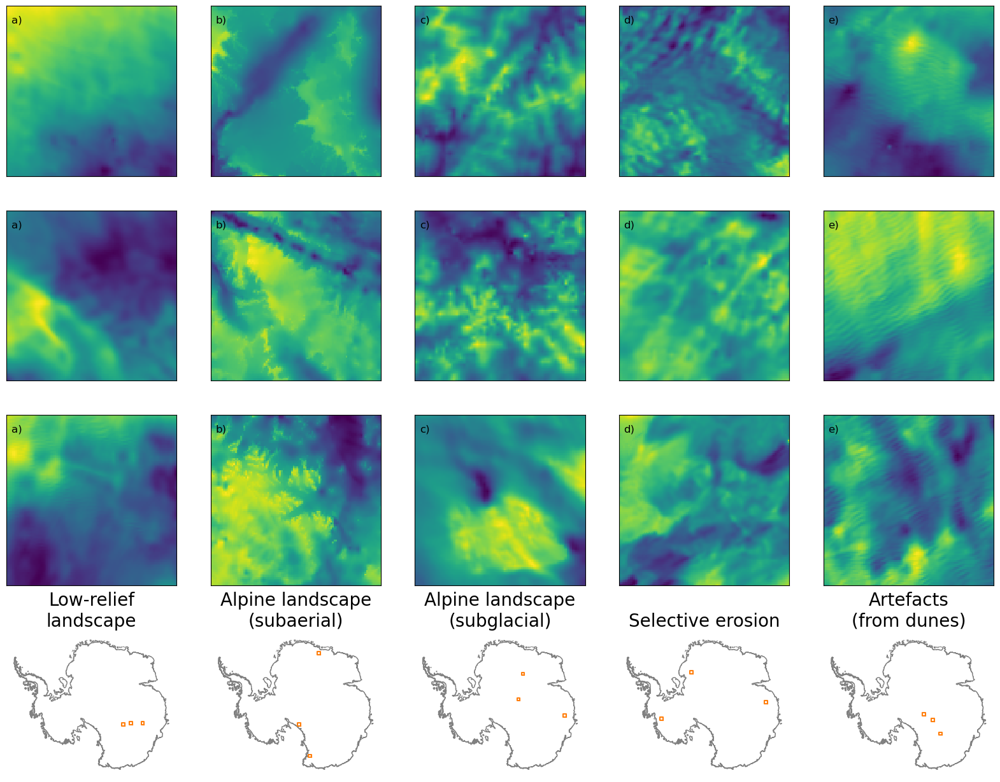

In [48]:
# Plot the example data regions 
fig, ax = plt.subplots(4,5, figsize = (20,16))
d = 2
d2 = 2
im = [[],[],[]]
jj = -1
for kk in (4,0,2,3,1):
    jj = jj +1
    # Create outline boxes for the chosen regions 
    geom1 = box(bounds_array_v1[kk][0], bounds_array_v1[kk][2], bounds_array_v1[kk][1], bounds_array_v1[kk][3])
    geom2 = box(bounds_array_v2[kk][0], bounds_array_v2[kk][2], bounds_array_v2[kk][1], bounds_array_v2[kk][3])
    geom3 = box(bounds_array_v3[kk][0], bounds_array_v3[kk][2], bounds_array_v3[kk][1], bounds_array_v3[kk][3])
    # Plot the chosen topographies
    im[0] = ax[0,jj].pcolor(X_ifpa_bs1[kk][::d,::d], Y_ifpa_bs1[kk][::d,::d], \
                            bed_ifpa_bs1[kk][::d,::d], cmap = 'viridis')
    im[1] = ax[1,jj].pcolor(X_ifpa_bs2[kk][::d,::d], Y_ifpa_bs2[kk][::d,::d], \
                            bed_ifpa_bs2[kk][::d,::d], cmap = 'viridis')    
    im[2] = ax[2,jj].pcolor(X_ifpa_bs3[kk][::d,::d], Y_ifpa_bs3[kk][::d,::d], \
                            bed_ifpa_bs3[kk][::d,::d], cmap = 'viridis')
    # Plot the outline boxes 
    ax[3,jj].plot(*geom3.exterior.xy, color = 'C1')
    ax[3,jj].plot(*geom2.exterior.xy, color = 'C1')
    ax[3,jj].plot(*geom1.exterior.xy, color = 'C1')
    # Add titles and panel labels
    titles = ('Bedmachine Antarctica', 'Ice Flow Perturbation Analysis')
    labels = ('a)', 'b)', 'c)', 'd)', 'e)' )
    for i in range(3):
        ax[i,jj].annotate(labels[jj], \
               xy=(2, 1), xytext=(0.06, 0.9), xycoords = 'axes fraction', fontsize = 12, ha = 'center');
    # Normalise with the Antarctic grounding line
    for i in range(4):
        groundinglineM.plot(ax = ax[i,jj], facecolor = 'None', edgecolor='grey')
        ax[i,jj].get_xaxis().set_ticks([]); ax[i,jj].get_yaxis().set_ticks([]);   
    # Set the x and y limits in the plot 
    ax[0,jj].set_xlim(bounds_array_v1[kk][0], bounds_array_v1[kk][1])
    ax[1,jj].set_xlim(bounds_array_v2[kk][0], bounds_array_v2[kk][1])
    ax[2,jj].set_xlim(bounds_array_v3[kk][0], bounds_array_v3[kk][1])
    ax[0,jj].set_ylim(bounds_array_v1[kk][2], bounds_array_v1[kk][3])
    ax[1,jj].set_ylim(bounds_array_v2[kk][2], bounds_array_v2[kk][3])
    ax[2,jj].set_ylim(bounds_array_v3[kk][2], bounds_array_v3[kk][3])
    ax[3,jj].axis('off');
    ax[3,jj].annotate(types[kk], \
               xy=(2, 1), xytext=(0.5, 1.05), xycoords = 'axes fraction', fontsize = 20, ha = 'center');
# Save figure to file
fig.savefig(figures_folder + 'S7sci_Textural_examples.png', dpi = 200, bbox_inches = 'tight')

## Figure S8

**Textural and spectral characteristics of different topographic styles.** Eleven textural
and spectral characteristics plotted for the example regions for five classes of subglacial topography
(areal scour in yellow, alpine (subglacial) in orange, alpine (aerial) in black, selective linear erosion
(SLE) in ice streams in dark blue and artefacts from dunes in light blue). Note that the axis scales
for panel c) have been chosen to show the variability between regions of areal scour and regions
with artefacts from dunes, and so most data points for alpine (aerial) fall outside of the chosen
region.

In [49]:
# Import the calculated data metrics from folder

filepaths = glob.glob(data_folder + 'Metrics/*.nc')
# Create a matrix to save the data and its filename
data_matrix = np.ndarray((len(filepaths),2), dtype = np.ndarray)
for i in range(len(filepaths)):
    output = Dataset(filepaths[i],'r',format='netCDF4')
    data_matrix[i, 0] = output.variables['data'][:]
    output.close()
    # To account for differing lengths of data filepaths 
    for j in range(len(filepaths[i].split(os.path.sep))):
        if (filepaths[i].split(os.path.sep)[j]) == 'Metrics':    
            short_filename  = filepaths[i].split(os.path.sep)[j+1].split('.')[0]
    data_matrix[i,1] = short_filename 
    
# Create a function to extract variables based on name 
def extract_from_matrix(variable_name):
    return data_matrix[data_matrix[:,1] == variable_name][0][0].data

In [50]:
# Create a function to filter data based on set boundaries 
def extract_area_params(variable_names, bounds):
    mask_x = (x_ifpa > (bounds[0]-10)) & (x_ifpa < (bounds[1])+10)
    mask_y = (y_ifpa > (bounds[2]-10)) & (y_ifpa < (bounds[3])+10)
    mask_xy = mask_x & mask_y
    vs = np.ndarray(len(variable_names), dtype = np.ndarray)
    params = np.ndarray((len(variable_names),2), dtype = np.ndarray)
    for i in range(len(variable_names)):
        vs[i] = extract_from_matrix(variable_names[i])
        params[i,0] = vs[i][mask_xy]
        params[i,1] = variables_labels[i][1]
    return params

In [51]:
# List variables to import and also a longform name for plotting 
variables_labels =  [['ifpa_mean', 'Mean'], \
                     ['ifpa_b1_thickness', 'Fourier fractal dimension\n(> ice thickness)'], \
                     ['ifpa_rms_curvature', 'RMS curvature'], \
                     ['ifpa_rms_slope', 'RMS slope'], \
                     ['ifpa_wav_max_power', 'Wavelength of maximum power'], \
                     ['ifpa_count_max_20', 'Number of 20m hills in 5km'],\
                     ['ifpa_count_max_50','Number of 50m hills in 5km'],\
                     ['ifpa_count_max_100', 'Number of 100m hills in 5km'],\
                     ['ifpa_count_max_250', 'Number of 250m hills in 5km'],\
                     ['ifpa_std_deslope', 'Standard deviation\nwith slope removed'], \
                     ['i_std_l', 'Low frequency\nstandard deviation'], \
                     ['i_rms_slope_h', 'High frequency\nRMS slope']]#, \
#                     ['i_std_h','High frequency\nstandard deviation'],\
#                     ['ifpa_relief','Relief']]

In [52]:
# Import the variables for each of the chosen regions 
variable_names = []
for i in range(len(variables_labels)):
    variable_names.append(variables_labels[i][0])
params_all1 = np.ndarray(len(bounds_array_v1), dtype = np.ndarray)
params_all2 = np.ndarray(len(bounds_array_v2), dtype = np.ndarray)
params_all3 = np.ndarray(len(bounds_array_v3), dtype = np.ndarray)
for i in range(len(bounds_array_v1)):
    params_all1[i] = extract_area_params(variable_names, bounds_array_v1[i])
    params_all2[i] = extract_area_params(variable_names, bounds_array_v2[i])
    params_all3[i] = extract_area_params(variable_names, bounds_array_v3[i])

In [53]:
# Create a function to plot a scatter plot of chosen variables x and y 
def plotting(x,y, ax, label = 'a)', leg = 'False'):
    color_map = plt.colormaps.get_cmap(plt.cm.rainbow)
    color_map2 = plt.colormaps.get_cmap(plt.cm.Greys)
    s_color = ('#f3e738','#2f64b4','#ff9248','#e75921','C9')
    s_color = ('k', 'C9','#ff9248','#2f64b4','#f3e738')
    for i in (4, 2, 0, 3, 1):
    #for i in (2,3):
        x_array = params_all1[i][params_all1[0][:,1] == x][0][0]
        y_array = params_all1[i][params_all1[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i], label = types[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i], label = types[i])
        x_array = params_all2[i][params_all2[0][:,1] == x][0][0]
        y_array = params_all2[i][params_all2[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i])
        x_array = params_all3[i][params_all3[0][:,1] == x][0][0]
        y_array = params_all3[i][params_all3[0][:,1] == y][0][0]
        if y == 'Fourier fractal dimension\n(> ice thickness)':
            ax.scatter(x_array,  3 + y_array/2, c = s_color[i])
        else:
            ax.scatter(x_array, y_array, c = s_color[i])
 
    ax.set_xlabel(params_all1[i][params_all1[0][:,1] == x][0][1], fontsize = 20)
    ax.set_ylabel(params_all1[i][params_all1[0][:,1] == y][0][1], fontsize = 20) 
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    if leg == True:
        ax.legend(loc = (-0.95,-0.4), fontsize = (24), markerscale = 4, ncol=5)
    ax.annotate(label, \
               xy=(2, 1), xytext=(0.05, 0.9), xycoords = 'axes fraction', fontsize = 20, ha = 'center');

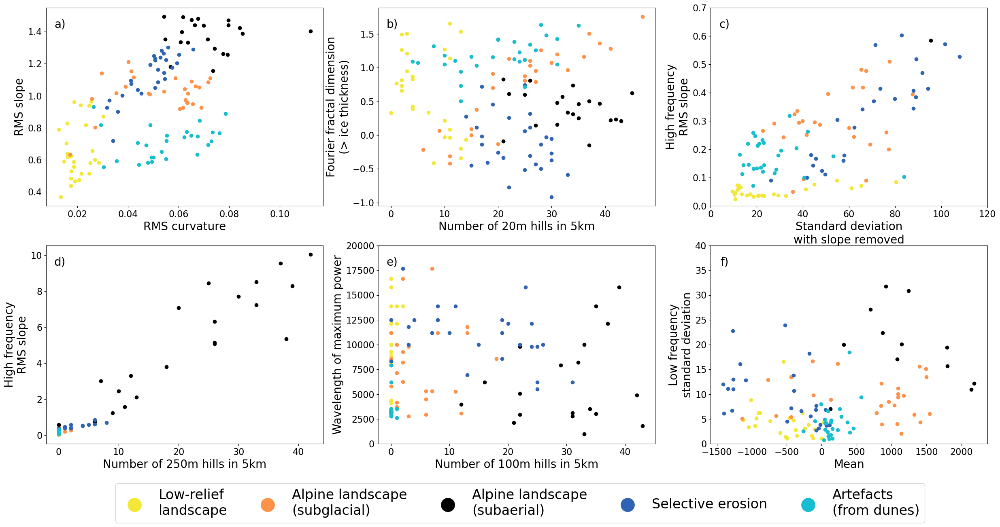

In [54]:
# Plot scatter plots for the chosen important variables 
fig, ax = plt.subplots(2,3, figsize = (30,14))
plotting('RMS curvature', 'RMS slope', ax = ax[0,0])
plotting('Number of 20m hills in 5km', 'Fourier fractal dimension\n(> ice thickness)', ax = ax[0,1], label = 'b)')
plotting('Standard deviation\nwith slope removed', 'High frequency\nRMS slope', ax  = ax[0,2], label = 'c)')
ax[0,2].set_xlim(0,120)
ax[0,2].set_ylim(0,0.7)
plotting('Number of 250m hills in 5km', 'High frequency\nRMS slope', ax = ax[1,0], label = 'd)')
plotting('Number of 100m hills in 5km', 'Wavelength of maximum power', ax = ax[1,1],  leg = True, label = 'e)')
ax[1,1].set_ylim(0,20000)
plotting('Mean', 'Low frequency\nstandard deviation', ax = ax[1,2], label = 'f)')
ax[1,2].set_ylim(0,40)
# Save figure to file 
fig.savefig(figures_folder + 'S8sci_Textural_sorting.png', dpi = 200, bbox_inches = 'tight')

## Figure S9

**Examples of artefacts in the IFPA topography from surface data sets.** Subglacial
topography produced from IFPA can have artefacts produced by a) features in the ice surface which
are not produced by ice-flow processes, in this case megadunes formed by katabatic winds, and
b) artefacts in the surface data, in this case velocity artefacts caused by proximity to the South
Pole. Panels show the ice-surface elevation (22, 24) (a1 and b1), the ice-surface velocity from
either the MEaSURES phase-based velocity product (23) (a2 and b6) or the ITS LIVE featuretracking
velocity product (60) (b2), the resulting IFPA bed topography (a3,b3,b6), and the bed
topography from from BedMachine Antarctica v3 (9). For the region shown in panels b), artefacts
in the ITS LIVE velocity product (b1) led to artefacts in the IFPA topography (b3). Using the
MEaSURES phase-based velocity product (b5) which does not contain these artefacts leads to
IFPA bed topography (b6) which matches the topography seen in BedMachine Antarctica v3,
illustrating how some artefacts may be removed with the application of different surface datasets.

In [55]:
### Artefacts
# Set the coordinate boundaries for the example regions for surface artefacts and velocity artefacts 
bounds_art = np.ndarray(3, dtype = np.ndarray)
bounds_art[0] = [1.0e6, 1.05e6, -0.95e6, -0.9e6] # Surface artefacts
bounds_art[1] = [0.1e6, 0.2e6, -0.2e6, -0.1e6] # Velocity artefacts
bounds_art[2] = [0.1e6, 0.2e6, -0.2e6, -0.1e6] # Velocity artefacts gone away

AA_X_bedmach = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_Y_bedmach = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_bedmach = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_X_ifpa = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_Y_ifpa = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_bed_ifpa = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_X_rema = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_Y_rema = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_SURF = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_X_its = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_Y_its = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_VX = np.ndarray(len(bounds_art), dtype = np.ndarray)
AA_VY = np.ndarray(len(bounds_art), dtype = np.ndarray)

In [56]:
if generate_fromIFPA == True:
    for i in range(len(bounds_art)):
        bounds = bounds_art[i]
        # Extend bounds slightly for importing data
        bounds_import = [bounds[0] - 200, bounds[1] + 200, bounds[2] - 200, bounds[3] + 200]
        # Create a shapely geometry file for bounds to plot them later
        geom = box(bounds[0], bounds[2], bounds[1], bounds[3])
        # Import the ITSLIVE, REMA and Bedmachine data
        if i in (0,2):
            AA_X_its[i], AA_Y_its[i], AA_VX[i], AA_VY[i], AA_X_rema[i], AA_Y_rema[i], AA_SURF[i], \
                    AA_X_bedmach[i], AA_Y_bedmach[i], thick, AA_bedmach[i], errbed, source = \
                smooth_data_load(bounds_import, filepath_measures, filepath_rema, filepath_bedmach)
            # To load the IFPA data
            fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
            X = fh.variables['x'][:]
            Y = fh.variables['y'][:]
            xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
            xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
            yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
            yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
            AA_bed_ifpa[i] = fh.variables['bed'][yl:yh, xl:xh]
            X_ifpa = fh.variables['x'][xl:xh]
            Y_ifpa = fh.variables['y'][yl:yh]
            AA_X_ifpa[i], AA_Y_ifpa[i] = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
            fh.close()
        else:
            AA_X_its[i], AA_Y_its[i], AA_VX[i], AA_VY[i], AA_X_rema[i], AA_Y_rema[i], AA_SURF[i], \
                    AA_X_bedmach[i], AA_Y_bedmach[i], thick, AA_bedmach[i], errbed, source = \
                smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
            # To load the IFPA data
            fh = Dataset(filepath_ifpa50km, 'r', format = 'NETCDF4');
            X = fh.variables['x'][:]
            Y = fh.variables['y'][:]
            xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
            xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
            yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
            yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
            AA_bed_ifpa[i] = fh.variables['bed'][yl:yh, xl:xh]
            X_ifpa = fh.variables['x'][xl:xh]
            Y_ifpa = fh.variables['y'][yl:yh]
            AA_X_ifpa[i], AA_Y_ifpa[i] = np.meshgrid(np.array(X_ifpa), np.array(Y_ifpa))
            fh.close()
    for i in range(len(bounds_art)):
        np.savetxt(data_folder + 'F8_'+str(i)+'x_bedmach.csv', AA_X_bedmach[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'y_bedmach.csv', AA_Y_bedmach[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'bedmach.csv', AA_bedmach[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'x_ifpa.csv', AA_X_ifpa[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'y_ifpa.csv', AA_Y_ifpa[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'bed_ifpa.csv', AA_bed_ifpa[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'x_rema.csv', AA_X_rema[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'y_rema.csv', AA_Y_rema[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'surf.csv', AA_SURF[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'x_its.csv', AA_X_its[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'y_its.csv', AA_Y_its[i])
        np.savetxt(data_folder + 'F8_'+str(i)+'vx.csv', AA_VX[i])
else:
    for i in range(len(bounds_art)):
        AA_X_bedmach[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'x_bedmach.csv')
        AA_Y_bedmach[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'y_bedmach.csv')
        AA_bedmach[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'bedmach.csv')
        AA_X_ifpa[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'x_ifpa.csv')
        AA_Y_ifpa[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'y_ifpa.csv')
        AA_bed_ifpa[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'bed_ifpa.csv')
        AA_X_rema[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'x_rema.csv')
        AA_Y_rema[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'y_rema.csv')
        AA_SURF[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'surf.csv')
        AA_X_its[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'x_its.csv')
        AA_Y_its[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'y_its.csv')
        AA_VX[i] = np.loadtxt(data_folder + 'F8_'+str(i)+'vx.csv')

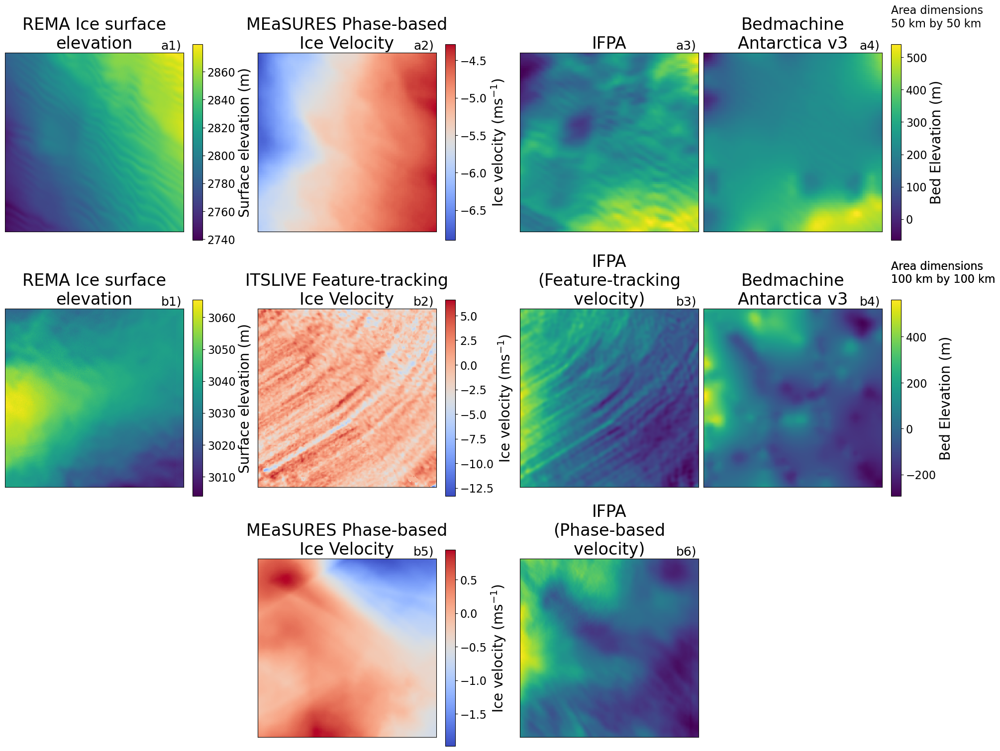

In [57]:
# Set the grids for the plot 
labels_art = ['a','b','b']
ax = [[],[],[],[]]*3
fig = plt.figure(constrained_layout=True, figsize = (20,15))
widths = [6,6,6,6]
gs = fig.add_gridspec(3,4, width_ratios = widths)
d = 1
d2 = 1
for kk in range(len(bounds_art)):
    ax[4*kk + 0] = fig.add_subplot(gs[kk, 0])
    ax[4*kk +1] = fig.add_subplot(gs[kk, 1])
    ax[4*kk+2] = fig.add_subplot(gs[kk, 2])
    ax[4*kk+3] = fig.add_subplot(gs[kk, 3])

    im = [[],[],[],[]]
    # Plot bedmachine, IFPA, REMA and ITSLIVE for the chosen region
    im[3] = ax[4*kk+3].pcolor(AA_X_bedmach[kk][::d2,::d2], AA_Y_bedmach[kk][::d2,::d2], AA_bedmach[kk][::d2,::d2])
    im[2] = ax[4*kk+2].pcolor(AA_X_ifpa[kk][::d,::d], AA_Y_ifpa[kk][::d,::d], AA_bed_ifpa[kk][::d,::d])
    im[0] = ax[4*kk+0].pcolor(AA_X_rema[kk][::d2,::d2], AA_Y_rema[kk][::d2,::d2], AA_SURF[kk][::d2,::d2])
    im[1] = ax[4*kk+1].pcolor(AA_X_its[kk][::d2,::d2], AA_Y_its[kk][::d2,::d2], AA_VX[kk][::d2,::d2], cmap = 'coolwarm')

    # Set color scale limits
    clims = (np.min((np.min(AA_bedmach[kk]), np.nanmin(AA_bed_ifpa[kk]))), np.max((np.max(AA_bedmach[kk]), np.nanmax(AA_bed_ifpa[kk]))))

    # Plot Antarctic groundingline to keep axis shape true, and remove axis ticks 
    for i in (0,1,2,3):
        groundinglineM.plot(ax = ax[4*kk+i], facecolor = 'None', edgecolor='k')
        ax[4*kk+i].get_xaxis().set_ticks([]); ax[4*kk+i].get_yaxis().set_ticks([]);   

    # Set titles and axis limits 
    for i in range(4):
        ax[4*kk+i].set_xlim(bounds_art[kk][0], bounds_art[kk][1])
        ax[4*kk+i].set_ylim(bounds_art[kk][2], bounds_art[kk][3])

    # Add ice surface elevation to plot 
    if kk in (0,1):
        cb_surf = plt.colorbar(im[0], ax = ax[4*kk+0], shrink = 1)
        cb_surf.set_label('Surface elevation (m)', fontsize = 20)
        cb_surf.ax.tick_params(labelsize=16)

    # Add ice velocity colorbar to plot
    cb_vel = plt.colorbar(im[1], ax = ax[4*kk+1], shrink = 1)
    cb_vel.set_label('Ice velocity (ms$^{-1}$)', fontsize = 20)
    cb_vel.ax.tick_params(labelsize=16)

    # Add bed elevation colorbar to plot
    if kk in (0,1):
        cbar = plt.colorbar(im[3], ax = ax[4*kk+3], shrink = 1)
        cbar.set_label('Bed Elevation (m)', fontsize = 20)
        cbar.ax.tick_params(labelsize=16)

    x_width  = (bounds_art[kk][1] - bounds_art[kk][0])/1000
    y_width =  (bounds_art[kk][3] - bounds_art[kk][2])/1000
    # Annotate plot with dimensions
    cbar.ax.annotate('Area dimensions\n{:.0f} km by {:.0f} km\n'.format(x_width, y_width), \
                   xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
    # Add panel labels to plot
    labels_c5 = ('1','2','3','4')
    labels_c4 = ('','5','6','')
    for i in (0,1,2,3):
        if kk in (0,1):
            ax[4*kk+i].annotate(labels_art[kk]+ '{})'.format(labels_c5[i]), xy = (2,1), \
                       xytext = (0.93,1.04), xycoords = 'axes fraction', \
                       ha = 'center', va = 'center', fontsize = 18)
        else:
            ax[4*kk+i].annotate(labels_art[kk]+ '{})'.format(labels_c4[i]), xy = (2,1), \
                       xytext = (0.93,1.04), xycoords = 'axes fraction', \
                       ha = 'center', va = 'center', fontsize = 18)

# Set plot titles
titles = ('REMA Ice surface\nelevation','MEaSURES Phase-based\nIce Velocity', 'IFPA', \
          'Bedmachine\nAntarctica v3',\
          'REMA Ice surface\nelevation','ITSLIVE Feature-tracking\nIce Velocity', 'IFPA\n(Feature-tracking\nvelocity)', \
          'Bedmachine\nAntarctica v3',\
          'REMA Ice surface\nelevation','MEaSURES Phase-based\nIce Velocity', 'IFPA\n(Phase-based\nvelocity)', \
          'Bedmachine\nAntarctica v3')
for i in range(len(ax)):
    ax[i].set_title(titles[i], fontsize = 24)

ax[8].set_visible(False)
ax[11].set_visible(False)


fig.savefig(figures_folder + 'S9sci_artefacts.png', dpi = 200, bbox_inches = 'tight')

## Figures S10 - S27

Panels (a) show the radar data available in
the Bedmap3 compendium (3) in this region. Panels (b-e) show a comparison of the bed topography
from (b) BedMap 3 (which uses an adapted plate spline interpolation), (c) BedMachine Antarctica
v3 (which uses streamline diffusion in interior sectors to interpolate between radar observations of
ice thickness), (d) IFPA𝑚𝑒𝑠𝑜 (prior to applying correction to geophysical thickness measurements),
and (e) IFPA (with geophysical correction implemented). Panel (f) shows the location of the region
in the Antarctic overview map.

In [58]:
print('Welcome to map_plots.py')

bounds_ar = [[-1.82e6, -1.45e6, -0.25e6, 0.075e6], 
            [-1.45e6, -1.0e6, -0.5e6,0e6], 
            [-1.25e6, -0.65e6, -1.1e6, -0.5e6],            
            [-1.0e6, -0.55e6, -0.5e6,0e6],  
            [-0.55e6, 0e6, -0.4e6, 0.05e6], 
            [-0.55e6, 0e6, 0.05e6, 0.55e6], 
            [-0.5e6, 0e6, 0.55e6, 1.1e6], 
            [-0.5e6, 0e6, 1.1e6, 1.6e6], 
            [0e6, 0.5e6, -0.6e6, -0.1e6], 
            [0e6, 0.5e6, -0.1e6, 0.4e6], 
            [0e6, 0.5e6, 0.4e6, 0.9e6], 
            [0e6, 0.5e6, 0.9e6, 1.4e6], 
            [0e6, 0.5e6, 1.4e6, 1.9e6], 
            [0.6e6, 1.0e6, -1.9e6, -1.5e6],
            [0.6e6, 1.0e6, -1.5e6, -1.0e6],
            [0.5e6, 1.0e6, -1.0e6, -0.5e6], 
            [0.5e6, 1.0e6, -0.5e6, -0.05e6], 
            [0.5e6, 1.0e6, -0.05e6, 0.40e6], 
            [0.5e6, 1.0e6, 0.4e6, 0.85e6], 
            [0.5e6, 1.0e6, 0.85e6, 1.3e6], 
            [0.5e6, 1.0e6, 1.3e6, 1.8e6], # [0.5e6, 1.0e6, 1.5e6, 1.8e6]
            [1.0e6, 1.45e6, -1.92e6, -1.47e6], 
            [1.0e6, 1.5e6, -1.47e6, -1.0e6], 
            [1.0e6, 1.5e6, -1.0e6, -0.5e6], 
            [1.0e6, 1.5e6, -0.5e6, 0.0e6], 
            [1.0e6, 1.5e6, 0.0e6, 0.5e6], 
            [1.0e6, 1.5e6, 0.5e6, 1.0e6], 
            [1.0e6, 1.5e6, 1.0e6, 1.5e6], 
            [1.45e6, 1.75e6, -1.77e6, -1.47e6], 
            [1.5e6, 1.95e6, -1.47e6, -0.97e6], 
            [1.5e6, 1.9e6, -0.97e6, -0.5e6], 
            [1.9e6, 2.3e6, -0.97e6, -0.5e6], 
            [1.5e6, 2.0e6, -0.5e6, 0.0e6], 
            [2.0e6, 2.4e6, -0.5e6, 0.0e6], 
            [1.5e6, 2.0e6, -0.0e6, 0.5e6], 
            [1.5e6, 1.95e6, 0.9e6, 1.4e6]]

clims = [[-1500,1000], 
        [-2000,1200], 
        [-1500,2000], 
        [-2000,1500], 
        [-1000,2500], 
        [-1500,1500], 
        [-2000,1500], 
        [-1500,1300],
        [-600,2900],
        [-1000,1000],
        [-1000,1250],
        [-700,700],
        [-300,2000],
        [-1200,1600],
        [-900,1100],
        [-700,700],
        [-400,1300],
        [-200,2000],
        [-500,1200],
        [0,1600],
        [-500,2500],
        [-1700,700],
        [-1200,800],
        [-1200,800],
        [-1200,1500],
        [-1000,2500],
        [-1000,1500],
        [-200,1400],
        [-1500,1000],
        [-1100,600],
        [-1500,400],
        [-1600,800],
        [-600,1200],
        [-1400,1000],
        [-500,1600],
        [-500,1800]]

area_titles = [[r'Pine\ Island\ Glacier'],
               [r'Thwaites\ Glacier'],
               [r'Marie\ Byrd\ Land'],
               [r'Whitmore\ Mountains'],
               [r'Southern\ TransAntarctic\ Mountains'],
               [r'Pensacola\ Pole\ Subglacial\ Basin'],
               [r'Polar\ Gap\ Subglacial\ Highlands\ and\ Recovery\ Glacier'],
               [r'Slessor\ Glacier\ Basin'],
               [r'South\ Pole\ Basin'],
               [r'South\ Pole\ Basin\ and\ Recovery\ Subglacial\ Highlands'],
               [r'Recovery\ Subglacial\ Basin'],
               [r'Maud\ Subglacial\ Basin'],
               [r'Western\ Dronning\ Maud\ Land'],
               [r'Oates\ Land'],
               [r'Northern\ Wilkes\ Subglacial\ Basin'],
               [r'Southern\ Wilkes\ Subglacial\ Basin'],
               [r'Southern\ Vostok\ Subglacial\ Highlands'],
               [r'Southern\ Gamburtsev\ Subglacial\ Mountains'],
               [r'Northern\ Recovery\ Subglacial\ Highlands\ and\ Dome\ Fuju'],
               [r'Inland\ Dronning\ Maud\ Land\ and\ Valkyrie\ Dome'],
               [r'S{\o}r\ Rondane\ Mountains'],
               [r'Southern\ Cross\ Subglacial\ Highlands\ and\ Webb\ Subglacial\ Trench'],
               [r'Resolution\ Subglacial\ Highlands'],
               [r'Peacock\ Subglacial\ Trench\ and\ Aurora\ Subglacial\ Basin'],
               [r'Lake\ Vostok\ and\ the\ Vostok\ Subglacial\ Highlands'],
               [r'Northern\ Gamburtsev\ Subglacial\ Mountains'],
               [r'Mellor\ Glacier'],
               [r'Interior\ Enderby\ Land'],
               [r'Astrolabe\ Subglacial\ Basin\ and\ the\ Porpoise\ Subglacial\ Highlands'],
               [r'Terre\ Ad\'elie\ Subglacial\ Highlands\ and\ Sabrina\ Subglacial\ Basin'],
               [r'Highlands\ B\ and\ C'],
               [r'Highlands\ A\ and\ B'],
               [r'Queen\ Mary\ Land\ and\ Wilhelm\ II\ land'],
               [r'Golicyna\ Subglacial\ Mountains'],
               [r'Princess\ Elizabeth\ Land'], 
               [r'Zhigalov\ Subglacial\ Mountains\ and\ central\ Kemp\ Land']]

Welcome to map_plots.py


In [59]:
x_width_ar = np.zeros(len(bounds_ar))
y_width_ar = np.zeros(len(bounds_ar))
for plot_no in range(len(bounds_ar)):
    x_width_ar[plot_no]  = (bounds_ar[plot_no][1] - bounds_ar[plot_no][0])/1000
    y_width_ar[plot_no] =  (bounds_ar[plot_no][3] - bounds_ar[plot_no][2])/1000
ratio = y_width_ar/x_width_ar

chosen_plots2 = [[0,1],[2,3],[4,5],[6,7],[8,9],[10,11],[12,13],[14,15],[16,17],[18,19],[20,21],[22,23],[24,25],[26,27],[28,29],\
                    [30,31],[32,33],[34,35]]

In [60]:
plot_all = False
if plot_all == True:
    #idk = 10
    for idk in range(len(chosen_plots2)):
    #for idk in (9,10,15):
        chosen_plots = chosen_plots2[idk]
        height = 0.2
        heights = np.zeros(len(chosen_plots)*3)
        for jj in range(len(chosen_plots)):
            height = height + 12*ratio[chosen_plots[jj]]
            heights[jj*3] = 0.1
            heights[jj*3+1] = 4*ratio[chosen_plots[jj]]
            heights[jj*3+2] = 4*ratio[chosen_plots[jj]]
        #print(heights)
        #print(height)
        
        fig = plt.figure(constrained_layout=True, figsize = (16,height))
        ax = [[],[],[],[],[],[],[]]
        widths = [6,6,6]
        #heights = [4,4]*len(chosen_plots)
        gs = fig.add_gridspec(3*len(chosen_plots),3, width_ratios = widths, height_ratios = heights)
        
        for jkj in range(len(chosen_plots)):
            
            ax[0] = fig.add_subplot(gs[jkj*3+2, 0])
            ax[1] = fig.add_subplot(gs[jkj*3+2, 1])
            ax[2] = fig.add_subplot(gs[jkj*3+2, 2])
            ax[4] = fig.add_subplot(gs[jkj*3+1, 1])
            ax[3] = fig.add_subplot(gs[jkj*3+1, 0])
            ax[5] = fig.add_subplot(gs[jkj*3+1, 2])
            ax[6] = fig.add_subplot(gs[jkj*3,1])
            
            plot_no = chosen_plots[jkj]
            
            # Extend bounds slightly for importing data
            bounds_import = [bounds_ar[plot_no][0] - 200, bounds_ar[plot_no][1] + 200, \
                             bounds_ar[plot_no][2] - 200, bounds_ar[plot_no][3] + 200]
            # Import the ITSLIVE, REMA and Bedmachine data
            _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach, _, _ = \
            smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
            # Import the ITSLIVE, REMA and Bedmachine data
            _, _, _, _, _, _, _, _, _, _, bedmach_new, _, _ = \
            smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
            # To load the IFPA data
            fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
            X = fh.variables['x'][:]
            Y = fh.variables['y'][:]
            xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
            xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
            yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
            yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
            bed_ifpa_new = fh.variables['bed'][yl:yh, xl:xh]
            X_ifpa_new = fh.variables['x'][xl:xh]
            Y_ifpa_new = fh.variables['y'][yl:yh]
            X_ifpa_new, Y_ifpa_new = np.meshgrid(np.array(X_ifpa_new), np.array(Y_ifpa_new))
            fh.close()
            # To load the bedmap3 data
            fh = Dataset(filepath_bedmap3_map, 'r', format = 'NETCDF4');
            X = fh.variables['x'][:]
            Y = fh.variables['y'][:]
            xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
            xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
            yl = next(x for x, val in enumerate(Y) if val <= bounds_import[2])  # Y in descending order
            yh = next(x for x, val in enumerate(Y) if val <= bounds_import[3])  
            #print(xl,xh,yl,yh)
            bed = fh.variables['bed_topography'][yh:yl, xl:xh]
            X2 = fh.variables['x'][xl:xh]
            Y2 = fh.variables['y'][yh:yl]
            X2, Y2 = np.meshgrid(np.array(X2), np.array(Y2))
            fh.close()
            
            x_width  = (bounds_ar[plot_no][1] - bounds_ar[plot_no][0])/1000
            y_width =  (bounds_ar[plot_no][3] - bounds_ar[plot_no][2])/1000
            
            d = 4
            d2 = 2
            im = [[],[],[],[],[]]
            im[0] = ax[0].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach[::d2,::d2])
            im[1] = ax[1].pcolor(X_ifpa_new[::d2,::d2], Y_ifpa_new[::d2,::d2], bed_ifpa_new[::d2,::d2])
            im[2] = ax[2].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach_new[::d2,::d2])
            im[4] = ax[3].pcolor(X2[::d2,::d2], Y2[::d2,::d2], bed[::d2,::d2])
            
            
            #cbar.ax.annotate('Dimensions:\n{:.0f} km by\n{:.0f} km\n'.format(x_width, y_width), \
            #               xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
            
            titles = ('Bedmachine Antarctica v3\n (streamline diffusion)', \
                      'IFPA$_{meso}$', \
                      'IFPA',\
                      'BedMap3\n(adapted plate\nspline interpolation)',
                      'Ice thickness\nobservations','\n'+r"$\bf{" + area_titles[plot_no][0] + "}$" )
            labels_let = ['a)','b)','c)','d)','e)','f)']
            labels_let = ['c)', 'd)', 'e)', 'b)', 'a)','f)']
            
            for j in range(6):
                groundinglineM.plot(ax = ax[j], facecolor = 'None', edgecolor='k')
                ax[j].get_xaxis().set_ticks([]); ax[j].get_yaxis().set_ticks([]); 
                ax[j].annotate('(' + str(plot_no+1) + labels_let[j], xy=(2, 1), \
                                   xytext=(1,1), xycoords = 'axes fraction',\
                                   fontsize = 20, ha = 'right', va = 'bottom', color = 'k')
                if j == 5:
                    ax[j].annotate('\nDimensions:\n   {:.0f} km by {:.0f} km'.format(x_width, y_width) +
                                   '\nCentral Coordinate:\n  {:.0f},{:.0f}'.format(int(np.mean((bounds_import[0], bounds_import[1]))), 
                                                                               int(np.mean((bounds_import[2], bounds_import[3])))), 
                                   xy=(2, 1), \
                                   xytext=(0.1,0), xycoords = 'axes fraction',\
                                   fontsize = 14, ha = 'left', va = 'bottom', color = 'k');
            
            for j in (0,1,2,3,4):
                ax[j].set_xlim(bounds_ar[plot_no][0], bounds_ar[plot_no][1])
                ax[j].set_ylim(bounds_ar[plot_no][2], bounds_ar[plot_no][3])
                ax[j].set_title(titles[j], fontsize = 20)
            ax[6].set_title(titles[5], fontsize = 24)#, loc = 'right')
            ax[6].axis('off')
            
            for j in (0,1,2,4):
                im[j].set_clim(clims[plot_no])
            
            cbar = plt.colorbar(im[0], ax = ax[2], shrink = 0.8)
            cbar.set_label('Elevation (m)', fontsize = 20)
            cbar.ax.tick_params(labelsize=16)
            ax[5].axis('off');
            
            mask_x = (bedmap_x > bounds_import[0]) & (bedmap_x < bounds_import[1])
            mask_y = (bedmap_y > bounds_import[2]) & (bedmap_y < bounds_import[3])
            mask_all = mask_x & mask_y
            mask_x = (bedmap_xt > bounds_import[0]) & (bedmap_xt < bounds_import[1])
            mask_y = (bedmap_yt > bounds_import[2]) & (bedmap_yt < bounds_import[3])
            mask_allt = mask_x & mask_y
            ax[4].scatter(bedmap_x[mask_all], bedmap_y[mask_all], s = 0.01, c = 'red', marker = '.')
            ax[4].scatter(bedmap_xt[mask_allt], bedmap_yt[mask_allt], s = 0.01, c = 'red', marker = '.')
            
            for kk in range(len(bounds_ar)):
                geom = box(bounds_ar[kk][0], bounds_ar[kk][2], bounds_ar[kk][1], bounds_ar[kk][3])
                ax[5].plot(*geom.exterior.xy, color = '#bebebe')
                ax[5].annotate(kk + 1, xy=(2, 1), \
                           xytext=(np.mean((bounds_ar[kk][0], bounds_ar[kk][1])), \
                                   np.mean((bounds_ar[kk][2], bounds_ar[kk][3]))), \
                            fontsize = 12, ha = 'center', va = 'center', color = 'grey');
            geom = box(bounds_ar[plot_no][0], bounds_ar[plot_no][2], \
                       bounds_ar[plot_no][1], bounds_ar[plot_no][3])
            ax[5].plot(*geom.exterior.xy, color = 'r')
            
            print(plot_no+1, 'out of', 36, 'Plotted', end = '\r')
        fig.savefig(figures_folder + 'Topo_{}to{}.png'.format(np.min(chosen_plots)+1, np.max(chosen_plots)+1), \
                    dpi = 200, bbox_inches = 'tight')
        plt.close(fig)

NameError: name 'filepath_IFPAmap' is not defined

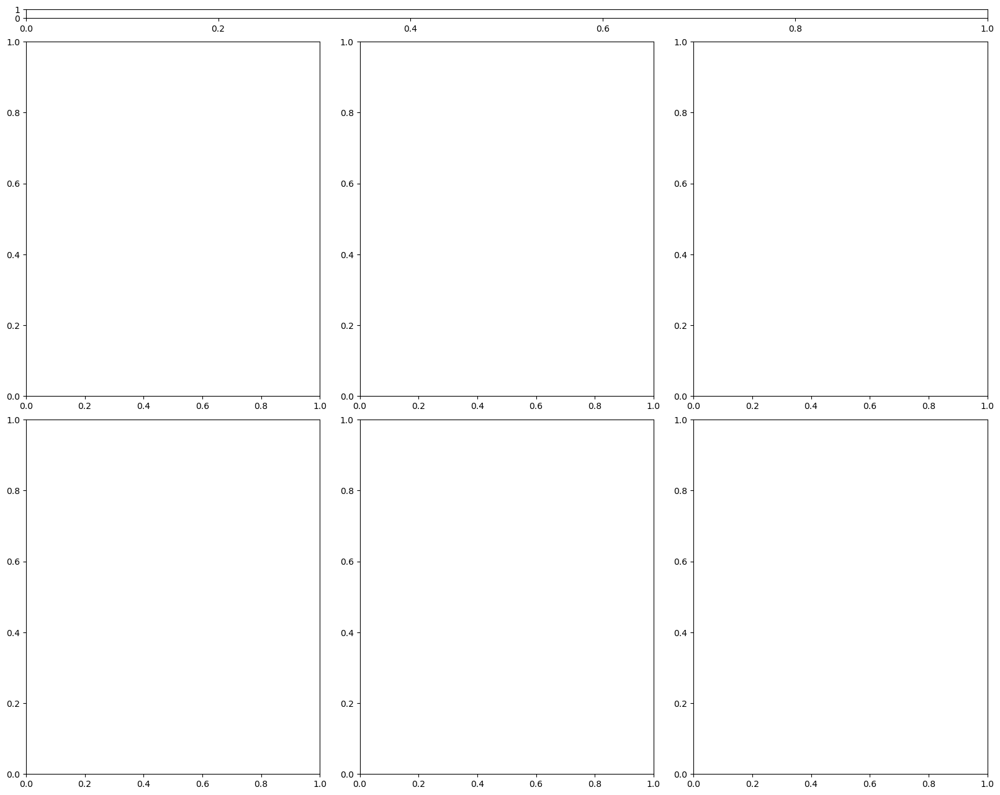

In [61]:
plot_all = True
if plot_all == True:
    idk = 14
    chosen_plots = chosen_plots2[idk]
    height = 0.2
    heights = np.zeros(len(chosen_plots)*3)
    for jj in range(len(chosen_plots)):
        height = height + 12*ratio[chosen_plots[jj]]
        heights[jj*3] = 0.1
        heights[jj*3+1] = 4*ratio[chosen_plots[jj]]
        heights[jj*3+2] = 4*ratio[chosen_plots[jj]]
    
    fig = plt.figure(constrained_layout=True, figsize = (16,height))
    ax = [[],[],[],[],[],[],[]]
    widths = [6,6,6]
    #heights = [4,4]*len(chosen_plots)
    gs = fig.add_gridspec(3*len(chosen_plots),3, width_ratios = widths, height_ratios = heights)
    
    for jkj in range(len(chosen_plots)):
        
        ax[0] = fig.add_subplot(gs[jkj*3+2, 0])
        ax[1] = fig.add_subplot(gs[jkj*3+2, 1])
        ax[2] = fig.add_subplot(gs[jkj*3+2, 2])
        ax[4] = fig.add_subplot(gs[jkj*3+1, 0])
        ax[3] = fig.add_subplot(gs[jkj*3+1, 1])
        ax[5] = fig.add_subplot(gs[jkj*3+1, 2])
        ax[6] = fig.add_subplot(gs[jkj*3,:])
        
        plot_no = chosen_plots[jkj]
        
        # Extend bounds slightly for importing data
        bounds_import = [bounds_ar[plot_no][0] - 200, bounds_ar[plot_no][1] + 200, \
                         bounds_ar[plot_no][2] - 200, bounds_ar[plot_no][3] + 200]
        # Import the ITSLIVE, REMA and Bedmachine data
        _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
        # Import the ITSLIVE, REMA and Bedmachine data
        _, _, _, _, _, _, _, _, _, _, bedmach_new, _, _ = \
        smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
        # To load the IFPA data
        fh = Dataset(filepath_ifpaC50, 'r', format = 'NETCDF4');
        X = fh.variables['x'][:]
        Y = fh.variables['y'][:]
        xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
        xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
        yl = next(x for x, val in enumerate(Y) if val >= bounds_import[2])  # Y in descending order
        yh = next(x for x, val in enumerate(Y) if val >= bounds_import[3])  
        bed_ifpa_new = fh.variables['bed'][yl:yh, xl:xh]
        X_ifpa_new = fh.variables['x'][xl:xh]
        Y_ifpa_new = fh.variables['y'][yl:yh]
        X_ifpa_new, Y_ifpa_new = np.meshgrid(np.array(X_ifpa_new), np.array(Y_ifpa_new))
        fh.close()
        # To load the bedmap3 data
        fh = Dataset(filepath_bedmap3_map, 'r', format = 'NETCDF4');
        X = fh.variables['x'][:]
        Y = fh.variables['y'][:]
        xl = next(x for x, val in enumerate(X) if val >= bounds_import[0]) # X in ascending order
        xh = next(x for x, val in enumerate(X) if val >= bounds_import[1])
        yl = next(x for x, val in enumerate(Y) if val <= bounds_import[2])  # Y in descending order
        yh = next(x for x, val in enumerate(Y) if val <= bounds_import[3])  
        #print(xl,xh,yl,yh)
        bed = fh.variables['bed_topography'][yh:yl, xl:xh]
        X2 = fh.variables['x'][xl:xh]
        Y2 = fh.variables['y'][yh:yl]
        X2, Y2 = np.meshgrid(np.array(X2), np.array(Y2))
        fh.close()
        
        x_width  = (bounds_ar[plot_no][1] - bounds_ar[plot_no][0])/1000
        y_width =  (bounds_ar[plot_no][3] - bounds_ar[plot_no][2])/1000
        
        d = 4
        d2 = 2
        im = [[],[],[],[]]
        im[0] = ax[0].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach[::d2,::d2])
        im[1] = ax[1].pcolor(X_ifpa_new[::d2,::d2], Y_ifpa_new[::d2,::d2], bed_ifpa_new[::d2,::d2])
        im[2] = ax[2].pcolor(X_bedmach[::d2,::d2], Y_bedmach[::d2,::d2], bedmach_new[::d2,::d2])
        im[3] = ax[3].pcolor(X2[::d2,::d2], Y2[::d2,::d2], bed[::d2,::d2])
        
        
        #cbar.ax.annotate('Dimensions:\n{:.0f} km by\n{:.0f} km\n'.format(x_width, y_width), \
        #               xy=(2, 1), xytext=(0, 1.02), xycoords = 'axes fraction', fontsize = 16);
        
        titles = ('Bedmachine Antarctica v3\n (streamline diffusion)', \
                  'IFPA$_{meso}$', \
                  'IFPA\n (with radar correction)',\
                  'BedMap3\n(adapted plate\nspline interpolation)',
                  'Ice thickness\nobservations','\n'+r"$\bf{" + area_titles[plot_no][0] + "}$")
        labels_let = ['a)','b)','c)','d)','e)','f)']
        
        for j in range(6):
            groundinglineM.plot(ax = ax[j], facecolor = 'None', edgecolor='k')
            ax[j].get_xaxis().set_ticks([]); ax[j].get_yaxis().set_ticks([]); 
            ax[j].annotate('(' + str(plot_no+1) + labels_let[j], xy=(2, 1), \
                               xytext=(1,1), xycoords = 'axes fraction',\
                               fontsize = 20, ha = 'right', va = 'bottom', color = 'k')
            if j == 5:
                ax[j].annotate('\nDimensions:\n   {:.0f} km by {:.0f} km'.format(x_width, y_width) +
                               '\nCentral Coordinate:\n  {:.0f},{:.0f}'.format(int(np.mean((bounds_import[0], bounds_import[1]))), 
                                                                           int(np.mean((bounds_import[2], bounds_import[3])))), 
                               xy=(2, 1), \
                               xytext=(0.1,0), xycoords = 'axes fraction',\
                               fontsize = 14, ha = 'left', va = 'bottom', color = 'k');
        
        for j in (0,1,2,3,4):
            ax[j].set_xlim(bounds_ar[plot_no][0], bounds_ar[plot_no][1])
            ax[j].set_ylim(bounds_ar[plot_no][2], bounds_ar[plot_no][3])
            ax[j].set_title(titles[j], fontsize = 20)
        
        ax[6].set_title(titles[5], fontsize = 24, loc = 'right')
        ax[6].axis('off')
        
        for j in (0,1,2,3):
            im[j].set_clim(clims[plot_no])
        
        cbar = plt.colorbar(im[0], ax = ax[2], shrink = 0.8)
        cbar.set_label('Elevation (m)', fontsize = 20)
        cbar.ax.tick_params(labelsize=16)
        ax[5].axis('off');
        
        mask_x = (bedmap_x > bounds_import[0]) & (bedmap_x < bounds_import[1])
        mask_y = (bedmap_y > bounds_import[2]) & (bedmap_y < bounds_import[3])
        mask_all = mask_x & mask_y
        mask_x = (bedmap_xt > bounds_import[0]) & (bedmap_xt < bounds_import[1])
        mask_y = (bedmap_yt > bounds_import[2]) & (bedmap_yt < bounds_import[3])
        mask_allt = mask_x & mask_y
        ax[4].scatter(bedmap_x[mask_all], bedmap_y[mask_all], s = 0.01, c = 'red', marker = '.')
        ax[4].scatter(bedmap_xt[mask_allt], bedmap_yt[mask_allt], s = 0.01, c = 'red', marker = '.')
        
        for kk in range(len(bounds_ar)):
            geom = box(bounds_ar[kk][0], bounds_ar[kk][2], bounds_ar[kk][1], bounds_ar[kk][3])
            ax[5].plot(*geom.exterior.xy, color = '#bebebe')
            ax[5].annotate(kk + 1, xy=(2, 1), \
                       xytext=(np.mean((bounds_ar[kk][0], bounds_ar[kk][1])), \
                               np.mean((bounds_ar[kk][2], bounds_ar[kk][3]))), \
                        fontsize = 12, ha = 'center', va = 'center', color = 'grey');
        geom = box(bounds_ar[plot_no][0], bounds_ar[plot_no][2], \
                   bounds_ar[plot_no][1], bounds_ar[plot_no][3])
        ax[5].plot(*geom.exterior.xy, color = 'r')
        
        print(plot_no+1, 'out of', 36, 'Plotted', end = '\r')

# Assorted figures which didn't make it into the paper 

**The new IFPA Antarctic subglacial topography map with Bedmachine Antarctica and Bedmap3 coverage for comparison.** (a) All-Antarctica IFPA subglacial topography;
(b) All-Antarctica BedMachine topography [22]; (c) BedMachine flight-track coverage (Adapted from
[22]), (e) the mean difference to the nearest Bedmap3 ice-thickness data point [20] for 50 km by
50km regions, and (d) the region where the mean distance to the nearest ice-thickness measurement
is more than 4km, and where we would expect IFPA to make the largest improvements to subglacial
topography.

Note: The code in this notebook makes 1 figure for panels a-c, and a second figure for panels d-e. 

In [ ]:
output = Dataset(filepath_bedmap3_mean_nearest,'r',format='netCDF4')
mean_nearest = output.variables['data'][:]
output.close()
output = Dataset(filepath_bedmap3_source,'r',format='netCDF4')
source_ifpa = output.variables['data'][:]
output.close()

In [ ]:
fh = Dataset(filepath_bedmach, 'r', format='NETCDF4');
X = fh.variables['x'][:]
Y = fh.variables['y'][:]
bed = fh.variables['bed'][:,:]
X_bedmach, Y_bedmach = np.meshgrid(X, Y)
fh.close()

if generate_fromIFPA == True:
    fh = Dataset(filepath_IFPAmap, 'r', format='NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    bed_ifpa = fh.variables['bed'][:,:]
    X_ifpa, Y_ifpa = np.meshgrid(X, Y)
    fh.close()
else:
    fh = Dataset(filepath_ifpaC50, 'r', format='NETCDF4');
    X = fh.variables['x'][:]
    Y = fh.variables['y'][:]
    bed_ifpa = fh.variables['bed'][:,:]
    X_ifpa, Y_ifpa = np.meshgrid(X, Y)
    fh.close()    


ax = [[],[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (14,5))
widths = [2,2,2,2,2,2]
heights = [4,0.2]
gs = fig.add_gridspec(2,6, width_ratios = widths, height_ratios = heights)
ax[0] = fig.add_subplot(gs[0,0:2])
ax[1] = fig.add_subplot(gs[0,2:4])
ax[2] = fig.add_subplot(gs[0,4:6])
ax[3] = fig.add_subplot(gs[1, 1:3])
ax[4] = fig.add_subplot(gs[1, 3:5])

mask_GL = np.loadtxt(filepath_mask)
print('Loaded Grounding line mask')

d = 20
clims = [-2000,2000]
mask = bed_ifpa < -2000
bed_ifpa[mask] = np.nan
im = ax[0].pcolor(X_ifpa[::d,::d], Y_ifpa[::d,::d], (bed_ifpa*mask_GL)[::d,::d], zorder = 1)
im.set_clim(clims)
groundinglineM.plot(ax = ax[1], facecolor = '#1d0148', edgecolor='grey', zorder = 0)
d = 25
mask = bed < -2000
bed[mask] = np.nan
im = ax[1].pcolor(X_bedmach[::d,::d], Y_bedmach[::d,::d], (bed*mask_GL)[::d,::d], zorder = 1)
im.set_clim(clims)
for i in range(3):
    ax[i].set_xlim(-2.6e6, 2.7e6)
    ax[i].set_ylim(-2.3e6, 2.3e6)
ax[4].axis('off')

cb = plt.colorbar(im, cax = ax[3], orientation  = 'horizontal', shrink = 0.5)
cb.set_label('Bed elevation (m)', fontsize = 20, fontweight = 'bold')
cb.ax.tick_params(labelsize=16)
#cb = plt.colorbar(im, cax = ax[4], orientation  = 'horizontal', shrink = 0.5)
#cb.set_label('Bed elevation (m)', fontsize = 20, fontweight = 'bold')
#cb.ax.tick_params(labelsize=16)

img =sio.imread("../Nature_figures/radar_locations.png")
ax[2].imshow(img, extent = [-2.8e6,2.8e6,-2.4e6,2.5e6], zorder = 0)

mid_letters = ['a)','b)','c)']
for i in range(3):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey', zorder = 2)
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    ax[i].axis('off')
    ax[i].annotate(mid_letters[i], \
               xy=(2, 1), xytext=(0.09, 0.87), xycoords = 'axes fraction', fontsize = 20);

ax[0].annotate('Ice Flow\nPerturbation\nAnalysis', xy = (2,1), xytext = (0.2, 0.07), ha = 'center', va = 'center', \
                  fontsize = 20, xycoords = 'axes fraction')
ax[1].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (0.2, 0.1), ha = 'center', va = 'center', \
                  fontsize = 20, xycoords = 'axes fraction');
fig.savefig(figures_folder + 'Bonus01_abc.png', dpi = 200, bbox_inches = 'tight')

In [ ]:
mask = (mean_nearest == np.inf)
mean_nearest[mask] = 0
levels = (1, 2,5, 10, 20)
fraction = (0,0.2,0.4,0.6,0.8,1.0)
mask = np.ndarray(len(levels)+1, dtype = np.ndarray)
for i in range(len(mask)):
    if i == 0:
        mask[i] = mean_nearest/1000 < levels[0]
    elif i == (len(mask) -1):
        mask[i] = mean_nearest/1000 > levels[-1]
    else:
        mask[i] = (mean_nearest/1000 > levels[i-1]) & (mean_nearest/1000 < levels[i])
    #print(i, np.sum(mask[i]))

mask4 = (source_ifpa == 5)
threshold = 4000
mask2 = mask4 & (mean_nearest < threshold)
mask3 = mask4 & (mean_nearest >= threshold)

In [ ]:
ax = [[],[],[],[],[],[]]
fig = plt.figure(constrained_layout=True, figsize = (14,5))
widths = [2,2,2,2,2,2]
heights = [2,2,0.2]
gs = fig.add_gridspec(3,6, width_ratios = widths, height_ratios = heights)
ax[0] = fig.add_subplot(gs[0:2,0:2])
ax[1] = fig.add_subplot(gs[0,2:4])
ax[2] = fig.add_subplot(gs[0:2,4:6])
ax[3] = fig.add_subplot(gs[1, 1:3])
ax[4] = fig.add_subplot(gs[1, 3:5])
ax[5] = fig.add_subplot(gs[1,2:4])

#thresholds = (4000),4000,6000)
alphas = [1,1,1,1,1,1]
for i in (0,5):
        threshold = 4000
        count_mask = (source_ifpa == 5) & (mean_nearest/1000 >= threshold)
        ax[i].scatter(x_ifpa[mask3], y_ifpa[mask3], \
                        color = 'C9', label = ' (> 4 km) IFPA'.format(threshold/1000), s = 4, alpha = alphas[i])
        ax[i].scatter(x_ifpa[mask2], y_ifpa[mask2], \
                    color = '#f58484', label = '(< 4 km) Streamline diffusion'.format(threshold/1000), \
                      s = 4, alpha = alphas[i]) #mask2
        ax[i].scatter(x_ifpa[~mask4], y_ifpa[~mask4], color = '#444444', label = 'Other methods', \
                      s = 4, alpha = alphas[i]) # mask3
        #leg = ax[i].legend(loc = (0,-0.2), fontsize = 20, frameon=False,markerscale=20)#,  \
    #                    title = 'Threshold = {:.0f} km'.format(threshold/1000), title_fontsize = 20)
        if i == 5:
            leg = ax[i].legend(loc = 'upper left', fontsize = 16, frameon=True,markerscale=10,ncol=1)#,  \
  #                      title = 'Threshold = {:.0f} km'.format(threshold/1000), title_fontsize = 20)
        ax[i].axis('off')
        if i == 0:
            ax[i].annotate('Threshold\n= {:.0f} km'.format(threshold/1000), \
                   xy=(2, 1), xytext=(0.13, 0.07), xycoords = 'axes fraction', fontsize = 20, fontweight = 'bold');

for i in (1,5):
    ax[i].set_xlim(-3e6,-2.9e6)
    ax[i].set_ylim(-3e6,-2.9e6)

mid_letters = ['d)','e)','e)']
for i in (0,2):
    groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='grey', zorder = 2)
    ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]);
    ax[i].axis('off')
    ax[i].annotate(mid_letters[i], \
               xy=(2, 1), xytext=(0.09, 0.87), xycoords = 'axes fraction', fontsize = 20);
    
color_map =plt.cm.get_cmap(plt.cm.inferno_r)
for i in range(len(mask)):
    if i == 0:
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                      label = '< {}'.format(levels[0]), s = 4)
    elif i == len(levels):
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '> {}'.format((int(levels[i-1]))), s = 4)
    else:
        ax[2].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '{} - {}'.format(levels[i-1],levels[i]), s = 4)
        
color_map =plt.cm.get_cmap(plt.cm.inferno_r)
for i in range(len(mask)):
    if i == 0:
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                      label = '< {}'.format(levels[0]), s = 4, alpha = 1)
    elif i == len(levels):
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '> {}'.format((int(levels[i-1]))), s = 4, alpha = 1)
    else:
        ax[1].scatter(x_ifpa[mask[i]], y_ifpa[mask[i]], color = color_map(fraction[i]), \
                    label = '{} - {}'.format(levels[i-1],levels[i]), s = 4, alpha = 1)

leg = ax[1].legend(title = 'Mean distance to\nnearest radar data point (km)', fontsize = 16, title_fontsize = 16, \
          loc = 'lower right', markerscale = 10, ncol=2)
ax[1].axis('off')


ax[3].axis('off')
ax[4].axis('off');

#fig.tight_layout() 
#ax[0].annotate('Ice Flow\nPerturbation\nAnalysis', xy = (2,1), xytext = (0.3, 0.08), ha = 'center', va = 'center', \
#                  fontsize = 20, xycoords = 'axes fraction')
#ax[1].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (0.23, 0.1), ha = 'center', va = 'center', \
#                  fontsize = 20, xycoords = 'axes fraction')

fig.savefig(figures_folder + 'Bonus01_de.png', dpi = 200, bbox_inches = 'tight')

Mean elevation, Standard deviation with the slope removed, low frequency standard deviation, RMS slope, High frequency RMS slope and RMS curvature for 50 km by 50 km patches of bed topography from Ice Flow Perturbation Analysis (a), b), c), g), h) and i) respectively), and Bedmachine Antarctica (d), e), f), j), k) and l) respectively).

In [ ]:
# Import the calculated data metrics from folder

filepaths = glob.glob(metrics_folder + '*.nc')
# Create a matrix to save the data and its filename
data_matrix = np.ndarray((len(filepaths),2), dtype = np.ndarray)
for i in range(len(filepaths)):
    output = Dataset(filepaths[i],'r',format='netCDF4')
    data_matrix[i, 0] = output.variables['data'][:]
    output.close()
    # To account for differing lengths of data filepaths 
    for j in range(len(filepaths[i].split(os.path.sep))):
        if (filepaths[i].split(os.path.sep)[j]) == 'Metrics_v2':    
            short_filename  = filepaths[i].split(os.path.sep)[j+1].split('.')[0]
    data_matrix[i,1] = short_filename 
    
# Create a function to extract variables based on name 
def extract_from_matrix(variable_name):
    return data_matrix[data_matrix[:,1] == variable_name][0][0].data

In [ ]:
# Load in the data for the first set of plots
plots = [[extract_from_matrix('ifpa_mean'), extract_from_matrix('ifpa_std_deslope'), extract_from_matrix('i_std_l')],\
         [extract_from_matrix('bedmach_mean'), extract_from_matrix('bedmach_std_deslope'),extract_from_matrix('b_std_l')]]
cmaps = ['RdYlBu_r', 'Spectral_r', 'coolwarm']
clims = [[-2000,2000],[0,300],[0,30]]
labels = ['Mean elevation (m)', 'Standard deviation\nwith slope removed', 'Low frequency\nstandard deviation']
letters = [['a)','b)','c)'],['d)','e)','f)']]
# Set grid parameters
ax2 = [[[],[],[]],[[],[],[]],[[],[],[]]]
fig = plt.figure(constrained_layout=True, figsize = (15,18))
heights = [4,0.2,4, 4,0.2,4]
gs = fig.add_gridspec(6,3, height_ratios = heights)
for i,j in itertools.product(range(3),range(3)):
    ax2[j][i] = fig.add_subplot(gs[j, i])    
ax = [[[],[],[]],[[],[],[]],[[],[],[]]]
for i,j in itertools.product(range(3),range(3)):
    ax[j][i] = fig.add_subplot(gs[j+3, i])
# Plot first 2 rows of plots    
for i,j in itertools.product(range(3),range(2)):
    im = ax2[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax2[j*2][i], facecolor = 'None', edgecolor='grey')
    ax2[j*2][i].get_xaxis().set_ticks([]); ax2[j*2][i].get_yaxis().set_ticks([]);
    ax2[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax2[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax2[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax2[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax2[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
# Set data and individual parameters for rows 3 and 4 of plots 
plots = [[100**extract_from_matrix('ifpa_rms_slope'), extract_from_matrix('i_rms_slope_h'), \
          extract_from_matrix('ifpa_rms_curvature')],\
         [100**extract_from_matrix('bedmach_rms_slope'), extract_from_matrix('b_rms_slope_h'), \
          extract_from_matrix('bedmach_rms_curvature')]]
cmaps = ['Spectral_r', 'coolwarm', 'RdYlBu']
clims = [[None,None],[0,8],[0.02,0.1]]
clims2 = [[None,None],[0,8],[0.02,0.1]]
labels = ['RMS slope', 'High frequency\nRMS slope', 'RMS curvature']
letters = [['g)','h)','i)'],['j)','k)','l)']]    
# Plot data 
for i,j in itertools.product(range(3),range(2)):
    im = ax[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax[j*2][i], facecolor = 'None', edgecolor='grey')
    ax[j*2][i].get_xaxis().set_ticks([]); ax[j*2][i].get_yaxis().set_ticks([]);
    ax[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction');
# Save figure to file    
fig.savefig(figures_folder + 'Bonus02_Metrics_extended.png', dpi = 200, bbox_inches = 'tight')

Fourier fractal dimension for wavelengths greater than the ice thickness, and for wavelengths
greater than 5 km, the highest power wavelength of the Fourier transformed data, the number of
20m hills in 5km, number of 100m hills in 5km and number of 200m hills in 5km for 50 km by 50 km
patches of bed topography from Ice Flow Perturbation Analysis (a), b), c), g), h) and i) respectively),
and Bedmachine Antarctica (d), e), f), j), k) and l) respectively).

In [ ]:
# Load in the data for the first set of plots
plots = [[3+extract_from_matrix('ifpa_b1_thickness')/2, 3+extract_from_matrix('ifpa_b1_5km')/2, \
          extract_from_matrix('ifpa_wav_max_power')],\
         [3+extract_from_matrix('bedmach_b1_thickness')/2, 3+extract_from_matrix('bedmach_b1_5km')/2, \
          extract_from_matrix('bedmach_wav_max_power')]]
cmaps = ['Spectral_r', 'Spectral_r', 'coolwarm']
clims = [[-1,1.3],[0,1.5],[0,25000]]
labels = ['Fourier fractal dimension\n(> ice thickness)', 'Fourier fractal dimension\n(> 5km)', 'Wavelength (m) with\nmaximum spectral power']
letters = [['a)','b)','c)'],['d)','e)','f)']]
# Set grid parameters
ax2 = [[[],[],[]],[[],[],[]],[[],[],[]]]
fig = plt.figure(constrained_layout=True, figsize = (15,18))
heights = [4,0.2,4, 4,0.2,4]
gs = fig.add_gridspec(6,3, height_ratios = heights)
for i,j in itertools.product(range(3),range(3)):
    ax2[j][i] = fig.add_subplot(gs[j, i])    
ax = [[[],[],[]],[[],[],[]],[[],[],[]]]
for i,j in itertools.product(range(3),range(3)):
    ax[j][i] = fig.add_subplot(gs[j+3, i])
# Plot first 2 rows of plots    
for i,j in itertools.product(range(3),range(2)):
    im = ax2[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax2[j*2][i], facecolor = 'None', edgecolor='grey')
    ax2[j*2][i].get_xaxis().set_ticks([]); ax2[j*2][i].get_yaxis().set_ticks([]);
    ax2[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax2[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax2[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax2[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax2[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
# Set data and individual parameters for rows 3 and 4 of plots 
plots = [[extract_from_matrix('ifpa_count_max_20'), extract_from_matrix('ifpa_count_max_100'), \
          extract_from_matrix('ifpa_count_max_250')],\
         [extract_from_matrix('bedmach_count_max_20'), extract_from_matrix('bedmach_count_max_100'), \
          extract_from_matrix('bedmach_count_max_250')]]
cmaps = ['coolwarm', 'coolwarm', 'coolwarm']
#cmaps = ['YlOrRd', 'YlOrRd', 'YlOrRd']
clims = [[0,30],[0,20],[0,10]]
labels = ['Number of 20m hills\nin 5km', 'Number of 100m hills\nin 5km', 'Number of 250m hills\nin 5km']
letters = [['g)','h)','i)'],['j)','k)','l)']]
# Plot data 
for i,j in itertools.product(range(3),range(2)):
    im = ax[j*2][i].scatter(x_ifpa, y_ifpa, c = plots[j][i], cmap = cmaps[i], s = 2) 
    im.set_clim(clims[i])
    groundinglineM.plot(ax = ax[j*2][i], facecolor = 'None', edgecolor='grey')
    ax[j*2][i].get_xaxis().set_ticks([]); ax[j*2][i].get_yaxis().set_ticks([]);
    ax[j*2][i].axis('off')
    if j == 0:
        cb = plt.colorbar(im, cax = ax[1][i], orientation = 'horizontal')
        cb.set_label(labels[i], fontsize = 20, fontweight = 'bold')
        cb.ax.tick_params(labelsize=16)
    ax[j*2][i].annotate(letters[j][i], \
               xy=(2, 1), xytext=(0.03, 0.87), xycoords = 'axes fraction', fontsize = 16);
ax[0][0].annotate('Ice Flow\nPerturbation Analysis', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction')
ax[2][0].annotate('Bedmachine\nAntarctica', xy = (2,1), xytext = (-0.1, 0.5), ha = 'center', va = 'center', \
                  fontsize = 16, rotation = 90, xycoords = 'axes fraction');
# Save figure to file    
fig.savefig(figures_folder + 'Bonus03_Metrics_extended.png', dpi = 200, bbox_inches = 'tight')

### And bonus figure, looking at the difference between IFPA and Bedmachine v3

In [ ]:
jkj = 11
# Extend bounds slightly for importing data
bounds_import = [bounds_ar[jkj][0] - 200, bounds_ar[jkj][1] + 200, \
                 bounds_ar[jkj][2] - 200, bounds_ar[jkj][3] + 200]
bounds_import2 = bounds_import
#bounds_import = [-2e6,2.3e6,-2.1e6,2.1e6]

In [ ]:
plot_this_figure = False
if (generate_fromIFPA == True) & (plot_this_figure == True):
    # Import the ITSLIVE, REMA and Bedmachine data
    _, _, _, _, _, _, _, X_bedmach, Y_bedmach, _, bedmach, _, _ = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_bedmach)
    # Import the new IFPA map (which is on the Bedmachine grid)
    _, _, _, _, _, _, _, _, _, _, bedmach_new, _, _ = \
    smooth_data_load(bounds_import, filepath_itslive, filepath_rema, filepath_IFPAmap)
    # Create the figure 
    fig = plt.figure(constrained_layout=True, figsize = (7,9))
    ax = [[],[],[],[],[]]
    widths = [2,2, 0.1]
    heights = [2,4]
    gs = fig.add_gridspec(2,3, width_ratios = widths, height_ratios = heights)
    
    ax[0] = fig.add_subplot(gs[0, 0])
    ax[1] = fig.add_subplot(gs[0, 1])
    ax[2] = fig.add_subplot(gs[1, :2])
    ax[3] = fig.add_subplot(gs[0,2])
    ax[4] = fig.add_subplot(gs[1,2])
    
    im = [[],[],[]]
    d = 10
    im[0] = ax[0].imshow(bedmach_new[::d,::d], extent = bounds_import, origin = 'upper')
    im[1] = ax[1].imshow(bedmach[::d,::d], extent = bounds_import, origin = 'upper')
    im[2] = ax[2].imshow(bedmach_new[::d,::d]-bedmach[::d,::d], cmap = 'RdBu_r', extent = bounds_import, origin = 'upper')
    im[2].set_clim(-200,200)
    #for i in range(2):
    #    im[i].set_clim(-2000,2000)
    
    geom = box(bounds_import[0], bounds_import[2], \
                       bounds_import[1], bounds_import[3])
    titles = ['IFPA', 'Bedmachine v3', 'Difference (IFPA - Bedmachine)']
    for i in range(3):
        groundinglineM.plot(ax = ax[i], facecolor = 'None', edgecolor='k')
        ax[i].set_xlim(bounds_import[0], bounds_import[1])
        ax[i].set_ylim(bounds_import[2], bounds_import[3])
        ax[i].get_xaxis().set_ticks([]); ax[i].get_yaxis().set_ticks([]); 
        ax[i].set_title(titles[i])
        ax[i].plot(*geom.exterior.xy, color = 'r')
    
    cb0 = plt.colorbar(im[0], cax= ax[3], shrink = 0.6)
    cb1 = plt.colorbar(im[2], cax= ax[4], shrink = 0.6)
    cb0.set_label('Bed elevation (m)')
    cb1.set_label('Elevation difference (m)')
    
    fig.savefig(figures_folder + 'Bonus04_Difference.png', dpi = 200, bbox_inches = 'tight')
else:
    print('Either you have chosen not to plot this figure (plot_this_figure == False),')
    print('or you have not provided the IFPA dataset and generate_fromIFPA==False')
    print('If you wish to plot these figures, please provide this dataset and change generate_fromIFPA to True')